## AIM: Train Graph Convulation Networks (GCNs) as multiclass classification models for predicting the psychiatric diagnosis based on EEG features

GraphLambda with & without edge attributes for predicting psychiatric diagnosis with statistical features of the power per frequency band per channel group (frontal, central, parietal, occipital) and connectivity features per frequency band per channel group (l/m/r; frontal, central, ). Statistical features are calculated with EC data, EO data and a with the ratio between EC divided by EO.

Have to use features before feature selection, to maintain even dimensions for each graph. Stat features are standardized before training. Models are tuned using multi-objective Optuna, maximizing val f1 and minimizing val loss

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

import optuna

import lightning.pytorch as pl
import torch
import torch_geometric
import torch.nn.functional as F
from torch.nn import Sequential, Linear, ReLU, BatchNorm1d, Dropout, Dropout1d
from torch_geometric.nn import  GCNConv, global_add_pool,GATConv,GINConv, GATv2Conv
from torch_geometric.loader import DataLoader
from torch_geometric.data import Data
from torch_geometric.utils.convert import from_networkx, to_networkx
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
from lightning.pytorch.tuner import Tuner
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import ModelCheckpoint, TQDMProgressBar, RichProgressBar
from lightning.pytorch.callbacks.early_stopping import EarlyStopping

from optuna.visualization.matplotlib import plot_contour
from optuna.visualization.matplotlib import plot_edf
from optuna.visualization.matplotlib import plot_intermediate_values
from optuna.visualization.matplotlib import plot_optimization_history
from optuna.visualization.matplotlib import plot_parallel_coordinate
from optuna.visualization.matplotlib import plot_param_importances
from optuna.visualization.matplotlib import plot_rank
from optuna.visualization.matplotlib import plot_slice
from optuna.visualization.matplotlib import plot_timeline

### Load data & features

In [2]:
import pickle
def load_file(file):
    with open(file, 'rb') as handle:
        return pickle.load(handle)

In [3]:
# import stat & conn features without feature selection
df_stat_conn_features = pd.read_pickle('df_stat_conn_features.pkl')
df_stat_conn_features = df_stat_conn_features.dropna(subset=['diagnosis'])

# label encode diagnosis
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(df_stat_conn_features['diagnosis'])
df_stat_conn_features['diagnosis'] = le.transform(df_stat_conn_features['diagnosis'])

print(df_stat_conn_features.shape)
df_stat_conn_features.sample(3)

(2700, 1218)


,ID,diagnosis,epoch,EO_l_frontal_delta_std,EO_l_frontal_delta_mean,EO_l_frontal_delta_median,EO_l_frontal_delta_skew,EO_l_frontal_delta_kurt,EO_l_frontal_theta_std,EO_l_frontal_theta_mean,...,ratio_gamma_m_central-r_central,ratio_gamma_m_central-l_posterior,ratio_gamma_m_central-m_posterior,ratio_gamma_m_central-r_posterior,ratio_gamma_r_central-l_posterior,ratio_gamma_r_central-m_posterior,ratio_gamma_r_central-r_posterior,ratio_gamma_l_posterior-m_posterior,ratio_gamma_l_posterior-r_posterior,ratio_gamma_m_posterior-r_posterior
1083,sub-88022765,2,4,0.085031,0.094956,0.094956,1.654486,2.249939,0.031888,0.054991,...,0.980003,0.985208,0.989329,0.984635,0.994907,1.000479,1.011141,0.980594,0.975989,0.986492
861,sub-87982849,1,10,0.070277,0.094237,0.094237,1.191137,0.684081,0.044996,0.067797,...,0.992926,0.948254,0.960216,0.958951,0.959756,0.974173,0.950412,0.969010,0.940131,0.957064
2130,sub-88061193,3,7,0.054773,0.068828,0.068828,1.746123,2.891282,0.026459,0.042627,...,1.005317,0.998316,1.002454,1.000290,0.999898,1.005037,1.004672,1.000118,0.997020,1.001754


In [4]:
# create 3 feature sets [EC, EO, ratio] with column ['ID', 'age', 'gender', 'diagnosis', 'epoch']
df_stat_conn_features_ec = df_stat_conn_features[df_stat_conn_features.columns[~(df_stat_conn_features.columns.str.startswith('EO') | df_stat_conn_features.columns.str.startswith('ratio'))]]
df_stat_conn_features_eo = df_stat_conn_features[df_stat_conn_features.columns[~(df_stat_conn_features.columns.str.startswith('EC') | df_stat_conn_features.columns.str.startswith('ratio'))]]
df_stat_conn_features_ratio = df_stat_conn_features[df_stat_conn_features.columns[~(df_stat_conn_features.columns.str.startswith('EC') | df_stat_conn_features.columns.str.startswith('EO'))]]
print(df_stat_conn_features_ratio.shape)
print(df_stat_conn_features_ec.shape)
print(df_stat_conn_features_eo.shape)

(2700, 408)
(2700, 408)
(2700, 408)


In [5]:
synchrony_feature_dict = load_file('synchrony_feature_dict.pkl')
subjects_ec_syncro_matrices = synchrony_feature_dict['EC_syncro']
subjects_eo_syncro_matrices = synchrony_feature_dict['EO_syncro']
subjects_ec_ids = synchrony_feature_dict['EC_IDs']
subjects_eo_ids = synchrony_feature_dict['EO_IDs']
print(len(subjects_ec_syncro_matrices), len(subjects_eo_syncro_matrices))
print(len(subjects_ec_ids), len(subjects_eo_ids))
print(subjects_ec_syncro_matrices[0].shape)
print(subjects_ec_ids[0])

224 225
224 225
(12, 5, 9, 9)
sub-87964717


In [6]:
# compute ratio [EC/EO] synchrony matrices

# Convert the lists to sets
subjects_ec_ids_set = set(subjects_ec_ids)
subjects_eo_ids_set = set(subjects_eo_ids)

# find the missing IDs to make sure ratio is computed within the same participant
missing_ids = subjects_eo_ids_set - subjects_ec_ids_set
missing_ids_indices = [subjects_eo_ids.index(id) for id in missing_ids]

# remove missing IDs from EO
ratio_subjects_eo_syncro_matrices = [matrix for i, matrix in enumerate(subjects_eo_syncro_matrices) if i not in missing_ids_indices]
assert len(ratio_subjects_eo_syncro_matrices) == len(subjects_ec_syncro_matrices)

# compute ratio
subjects_ratio_syncro_matrices = []
for i in range(len(subjects_ec_syncro_matrices)):
    ratio_matrix = subjects_ec_syncro_matrices[i] / ratio_subjects_eo_syncro_matrices[i]
    subjects_ratio_syncro_matrices.append(ratio_matrix)
subjects_ratio_ids = subjects_ec_ids
print(len(subjects_ratio_syncro_matrices), len(subjects_ratio_ids))

224 224


/tmp/ipykernel_1565098/1473655494.py:18: RuntimeWarning: invalid value encountered in divide
  ratio_matrix = subjects_ec_syncro_matrices[i] / ratio_subjects_eo_syncro_matrices[i]


In [7]:
# define function to store features in PyTorch Geometric Data objects
import networkx as nx
from joblib import Parallel, delayed # for parallel processing
from tqdm import tqdm
def process_subject(syncros, subject_id, df_features):
    graph_dataset = []
    y_list = []

    # obtain statistical features for subject
    subject_stat_features = df_features[df_features['ID'] == subject_id]
    stat_columns = ['epoch', 'mean', 'median', 'std', 'kurt', 'skew'] # select statistical features
    pattern = '|'.join(stat_columns)  # create a pattern string
    subject_stat_features = subject_stat_features[subject_stat_features.columns[subject_stat_features.columns.str.contains(pattern)]]
    
    for epoch, syncro_matrices in enumerate(syncros):
        num_edges = int((syncro_matrices.shape[1] * (syncro_matrices.shape[2] - 1)) / 2)
        bands = syncro_matrices.shape[0]
        edge_attrs = np.zeros((num_edges, bands)) # create empty array to store edge weights for each frequency band

        for i, syncro_matrix in enumerate(syncro_matrices):
            # print(f'{syncro_matrix.shape = }')
            syncro_graph = nx.from_numpy_array(syncro_matrix)
            # print(f'{syncro_graph = }')
            edge_list = nx.to_pandas_edgelist(syncro_graph)
            edge_list = edge_list.dropna(axis=0)
            # print(f'{edge_list = }')
            edge_index = edge_list.iloc[:,0:2].values.T # shape (2, num_edges), edge_index stays the same for all bands right?
            # print(f'{edge_index = }')
            edge_attr = edge_list.iloc[:,2].values#.reshape(-1,1)
            edge_attrs[:,i] = edge_attr

        y = df_stat_conn_features_ec[df_stat_conn_features_ec['ID'] == subject_id]['diagnosis'].values[0]
        
        # store statistical features for subject
        ch_groups = ['l_frontal', 'm_frontal', 'r_frontal', 'l_central', 'm_central', 'r_central', 'l_posterior', 'm_posterior', 'r_posterior']
        bands = ['delta', 'theta', 'alpha', 'beta', 'gamma']
        x = np.zeros((len(ch_groups), len(bands) * (len(stat_columns)-1))) # -1 because of epochs column in stat_columns
        # print(x.shape)
        for num, ch_group in enumerate(ch_groups):
            x[num] = subject_stat_features[subject_stat_features['epoch'] == (epoch + 1)][subject_stat_features.columns[subject_stat_features.columns.str.contains(ch_group)]].values[0]
            

        data = Data(x=torch.tensor(x, dtype=torch.float),                     # Node features [num_nodes, num_node_features]
                    edge_index=torch.tensor(edge_index, dtype=torch.long),    # Adjacency matrix [2, num_edges]
                    edge_attr=torch.tensor(edge_attrs,dtype=torch.float),  # Edge features [num_edges, num_edge_features]
                    y=torch.tensor([y], dtype=torch.long))                    # Target/Label (it should be a list) --> torch.long for classification, torch.float for regression
        graph_dataset.append(data)
        y_list.append(y)

    return graph_dataset, y_list

In [8]:
# retrieve and store data for EC features
# subjects__ec/eo_syncro_matrices : A list of lists, every list is a subject, every element in that list is an array of shape [n_epochs, n_bands, n_channels, n_channels]

results = Parallel(n_jobs=-1)(delayed(process_subject)(syncros, subject_id, df_stat_conn_features_ec) for syncros, subject_id in tqdm(zip(subjects_ec_syncro_matrices, subjects_ec_ids), total=len(subjects_ec_syncro_matrices)))

ec_graph_dataset = []
ec_y_list = []
for result in results:
    ec_graph_dataset.extend(result[0])
    ec_y_list.extend(result[1])
    
assert len(ec_graph_dataset) == len(ec_y_list)

print(f'{ec_graph_dataset[0].x.shape = }, stat features [num_nodes, num_node_features]')
print(f'{ec_graph_dataset[0].edge_attr.shape = }, [num_edges, n_bands]')
print(f'{ec_graph_dataset[0].edge_index.shape = }, [2, num_edges]')
print(f'{len(ec_graph_dataset) = }, subjects: {len(subjects_ec_syncro_matrices)}, epochs: {len(subjects_ec_syncro_matrices[0])}')
print(f'{ec_graph_dataset[0] = }')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 224/224 [00:06<00:00, 36.42it/s]


ec_graph_dataset[0].x.shape = torch.Size([9, 25]), stat features [num_nodes, num_node_features]
ec_graph_dataset[0].edge_attr.shape = torch.Size([36, 5]), [num_edges, n_bands]
ec_graph_dataset[0].edge_index.shape = torch.Size([2, 36]), [2, num_edges]
len(ec_graph_dataset) = 2688, subjects: 224, epochs: 12
ec_graph_dataset[0] = Data(x=[9, 25], edge_index=[2, 36], edge_attr=[36, 5], y=[1])


In [9]:
# retrieve and store data for EO features
# subjects__ec/eo_syncro_matrices : A list of lists, every list is a subject, every element in that list is an array of shape [n_epochs, n_bands, n_channels, n_channels]

results = Parallel(n_jobs=-1)(delayed(process_subject)(syncros, subject_id, df_stat_conn_features_eo) for syncros, subject_id in tqdm(zip(subjects_eo_syncro_matrices, subjects_eo_ids), total=len(subjects_eo_syncro_matrices)))

eo_graph_dataset = []
eo_y_list = []
for result in results:
    eo_graph_dataset.extend(result[0])
    eo_y_list.extend(result[1])
    
assert len(eo_graph_dataset) == len(eo_y_list)

print(f'{eo_graph_dataset[0].x.shape = }, stat features [num_nodes, num_node_features]')
print(f'{eo_graph_dataset[0].edge_attr.shape = }, [num_edges, n_bands]')
print(f'{eo_graph_dataset[0].edge_index.shape = }, [2, num_edges]')
print(f'{len(eo_graph_dataset) = }, subjects: {len(subjects_eo_syncro_matrices)}, epochs: {len(subjects_eo_syncro_matrices[0])}')
print(f'{eo_graph_dataset[0] = }')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 225/225 [00:02<00:00, 92.46it/s]


eo_graph_dataset[0].x.shape = torch.Size([9, 25]), stat features [num_nodes, num_node_features]
eo_graph_dataset[0].edge_attr.shape = torch.Size([36, 5]), [num_edges, n_bands]
eo_graph_dataset[0].edge_index.shape = torch.Size([2, 36]), [2, num_edges]
len(eo_graph_dataset) = 2700, subjects: 225, epochs: 12
eo_graph_dataset[0] = Data(x=[9, 25], edge_index=[2, 36], edge_attr=[36, 5], y=[1])


In [10]:
# retrieve and store data for EO features
# subjects__ec/eo_syncro_matrices : A list of lists, every list is a subject, every element in that list is an array of shape [n_epochs, n_bands, n_channels, n_channels]

results = Parallel(n_jobs=-1)(delayed(process_subject)(syncros, subject_id, df_stat_conn_features_ratio) for syncros, subject_id in tqdm(zip(subjects_ratio_syncro_matrices, subjects_ratio_ids), total=len(subjects_ratio_syncro_matrices)))

# process_subject(subjects_ratio_syncro_matrices[0], subjects_ratio_ids[0])

ratio_graph_dataset = []
ratio_y_list = []
for result in results:
    ratio_graph_dataset.extend(result[0])
    ratio_y_list.extend(result[1])
    
assert len(ratio_graph_dataset) == len(ratio_y_list)

print(f'{ratio_graph_dataset[0].x.shape = }, stat features [num_nodes, num_node_features]')
print(f'{ratio_graph_dataset[0].edge_attr.shape = }, [num_edges, n_bands]')
print(f'{ratio_graph_dataset[0].edge_index.shape = }, [2, num_edges]')
print(f'{len(ratio_graph_dataset) = }, subjects: {len(subjects_ratio_syncro_matrices)}, epochs: {len(subjects_ratio_syncro_matrices[0])}')
print(f'{ratio_graph_dataset[0] = }')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 224/224 [00:02<00:00, 85.52it/s]


ratio_graph_dataset[0].x.shape = torch.Size([9, 25]), stat features [num_nodes, num_node_features]
ratio_graph_dataset[0].edge_attr.shape = torch.Size([36, 5]), [num_edges, n_bands]
ratio_graph_dataset[0].edge_index.shape = torch.Size([2, 36]), [2, num_edges]
len(ratio_graph_dataset) = 2688, subjects: 224, epochs: 12
ratio_graph_dataset[0] = Data(x=[9, 25], edge_index=[2, 36], edge_attr=[36, 5], y=[1])


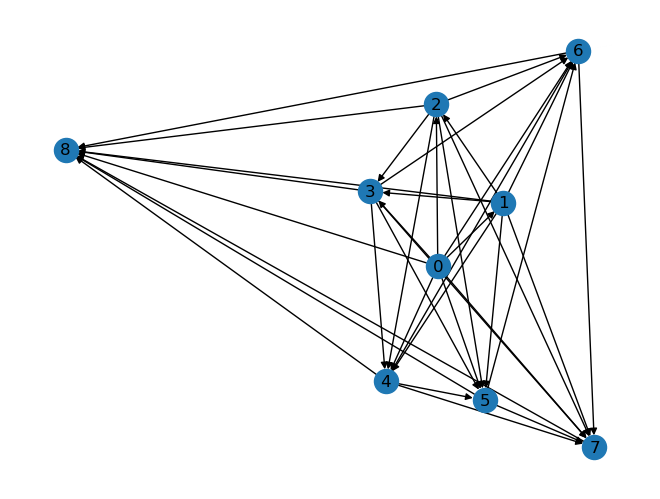

In [11]:
nx.draw(to_networkx(ratio_graph_dataset[0]), with_labels=True)

In [12]:
# load the indices of the validation sets from the ML models
data_split_indices = load_file('data_split_indices.pkl')

# GCN models:

### Model: graphLambda without edge_attr

In [13]:
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch_geometric
from torch.nn import Sequential, Linear, ReLU, BatchNorm1d, Dropout, Dropout1d, ModuleList
import torch.nn.functional as F
from torch_geometric.nn import  GCNConv, global_add_pool, GATConv, GINConv


n_features = 25 # [Delta, Theta, Alpha, Beta, Gamma] * [mean, median, std, skew, kurt]
num_classes = 5 # healthy, ADHD, MDD, OCD, SMC

class graphLambda_wo_edge_attr(pl.LightningModule):
    def __init__(self, learning_rate, optimizer_name, fc_layers, dropout):
        super(graphLambda_wo_edge_attr, self).__init__()
        self.learning_rate = learning_rate
        self.optimizer_name = optimizer_name

        #GCN-representation
        self.conv1 = GCNConv(n_features, 256, cached=False )
        self.bn01 = BatchNorm1d(256)
        self.conv2 = GCNConv(256, 128, cached=False )
        self.bn02 = BatchNorm1d(128)
        self.conv3 = GCNConv(128, 128, cached=False)
        self.bn03 = BatchNorm1d(128)
        #GAT-representation
        self.gat1 = GATConv(n_features, 256, heads=3)
        self.bn11 = BatchNorm1d(256*3)
        self.gat2 = GATConv(256*3, 128, heads=3)
        self.bn12 = BatchNorm1d(128*3)
        self.gat3 = GATConv(128*3, 128, heads=3)
        self.bn13 = BatchNorm1d(128*3)
        #GIN-representation
        fc_gin1=Sequential(Linear(n_features, 256), ReLU(), Linear(256, 256))
        self.gin1 = GINConv(fc_gin1)
        self.bn21 = BatchNorm1d(256)
        fc_gin2=Sequential(Linear(256, 128), ReLU(), Linear(128, 128))
        self.gin2 = GINConv(fc_gin2)
        self.bn22 = BatchNorm1d(128)
        fc_gin3=Sequential(Linear(128, 64), ReLU(), Linear(64, 64))
        self.gin3 = GINConv(fc_gin3)
        self.bn23 = BatchNorm1d(64)
        # Fully connected layers for concatinating outputs (varied depending on fc_layers)
        self.fcs = ModuleList()
        self.dropouts = ModuleList()
        input_size = 128*4 + 64 # Input size for the first layer
        output_size = num_classes # Output size for the last layer
        sizes = np.linspace(input_size, output_size, fc_layers + 1, dtype=int) # Calculate the size for each layer
        for i in range(fc_layers): # Create the layers
            self.fcs.append(Linear(sizes[i], sizes[i + 1]))
            self.dropouts.append(Dropout(p=dropout))

        # add metrics
        self.train_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_cm = ConfusionMatrix(task = 'binary', num_classes=num_classes, threshold=0.05)
        self.validation_step_yhats = []
        self.validation_step_ys = []
        
    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        y=x
        z=x
        #GCN-representation
        x = F.relu(self.conv1(x, edge_index))
        x = self.bn01(x)
        x = F.relu(self.conv2(x, edge_index))
        x = self.bn02(x)
        x = F.relu(self.conv3(x, edge_index))
        x = self.bn03(x)
        x = global_add_pool(x, data.batch)
        #GAT-representation
        y = F.relu(self.gat1(y, edge_index))
        y = self.bn11(y)
        y = F.relu(self.gat2(y, edge_index))
        y = self.bn12(y)
        y = F.relu(self.gat3(y, edge_index))
        y = self.bn13(y)
        y = global_add_pool(y, data.batch)
        #GIN-representation
        z = F.relu(self.gin1(z, edge_index))
        z = self.bn21(z)
        z = F.relu(self.gin2(z, edge_index))
        z = self.bn22(z)
        z = F.relu(self.gin3(z, edge_index))
        z = self.bn23(z)
        z = global_add_pool(z, data.batch)
        #Concatinating_representations
        cr=torch.cat((x,y,z),1)
        for fc, dropout in zip(self.fcs, self.dropouts):
            cr = F.relu(fc(cr))
            cr = dropout(cr)
        #cr = F.relu(cr).view(-1)
        cr = F.log_softmax(cr, dim=1) # Activation function for classification
        return cr  
    
    def configure_optimizers(self):
        if self.optimizer_name == 'Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'RMSprop':
            optimizer = torch.optim.RMSprop(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'SGD':
            optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError(f'Unsupported optimizer: {self.optimizer_name}')
        return optimizer
    
    def training_step(self, train_batch, batch_idx):
        x, y = train_batch.x, train_batch.y
        output = self.forward(train_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('train_loss', loss, on_epoch=True, prog_bar=True)
        self.log('train_f1', self.train_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch.x, val_batch.y
        output = self.forward(val_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        self.log('val_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        self.validation_step_yhats.append(y_hat)
        self.validation_step_ys.append(y)
        return loss
    
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch.x, test_batch.y
        output = self.forward(test_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('test_loss', loss, on_epoch=True, prog_bar=True)
        self.log('test_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    # def on_train_epoch_end(self, training_step_outputs):
    #     # compute metrics
    #     train_f1 = self.train_f1.compute()
    #     # log metrics
    #     self.log("epoch_train_f1", train_f1)
    #     # reset all metrics
    #     self.train_f1.reset()
    #     print(f"\nf1: {train_f1:.4}")

    # def on_validation_epoch_end(self):
    #     # plot confusion matrix
    #     y_hat = torch.cat(self.validation_step_yhats)
    #     y = torch.cat(self.validation_step_ys)
    #     confusion_matrix = self.val_cm(y_hat, y.int())

    #     confusion_matrix_computed = confusion_matrix.detach().cpu().numpy().astype(int)

    #     df_cm = pd.DataFrame(confusion_matrix_computed)
    #     plt.figure(figsize = (10,7))
    #     fig_ = sns.heatmap(df_cm, annot=True, cmap='Spectral').get_figure()
    #     plt.close(fig_)
    #     self.loggers[0].experiment.add_figure("Confusion matrix", fig_, self.current_epoch)

    #     self.validation_step_yhats.clear() # free memory
    #     self.validation_step_ys.clear()
    
    def predict_step(self, batch):
        x, y = batch.x, batch.y
        output = self.forward(batch)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        return y_hat

### Model: graphLambda with edge_attr

In [14]:
#Model
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch_geometric
from torch.nn import Sequential, Linear, ReLU, BatchNorm1d, Dropout, Dropout1d, ModuleList
import torch.nn.functional as F
from torch_geometric.nn import  GCNConv, global_add_pool, GATConv, GINConv, GATv2Conv


n_features = 25 # [Delta, Theta, Alpha, Beta, Gamma] * [mean, median, std, skew, kurt]
num_classes = 5 # healthy, ADHD, MDD, OCD, SMC
n_edge_attrs = 5 # [Delta, Theta, Alpha, Beta, Gamma]

class graphLambda_w_edge_attr(pl.LightningModule):
    def __init__(self, learning_rate, optimizer_name, fc_layers, dropout):
        super(graphLambda_w_edge_attr, self).__init__()
        self.learning_rate = learning_rate
        self.optimizer_name = optimizer_name

        #GCN-representation
        self.conv1 = GCNConv(n_features, 256, cached=False )
        self.bn01 = BatchNorm1d(256)
        self.conv2 = GCNConv(256, 128, cached=False )
        self.bn02 = BatchNorm1d(128)
        self.conv3 = GCNConv(128, 128, cached=False)
        self.bn03 = BatchNorm1d(128)
        #GAT-representation
        self.gat1 = GATv2Conv(n_features, 256, heads=3, edge_dim=n_edge_attrs)
        self.bn11 = BatchNorm1d(256*3)
        self.gat2 = GATv2Conv(256*3, 128, heads=3, edge_dim=n_edge_attrs)
        self.bn12 = BatchNorm1d(128*3)
        self.gat3 = GATv2Conv(128*3, 128, heads=3, edge_dim=n_edge_attrs)
        self.bn13 = BatchNorm1d(128*3)
        #GIN-representation
        fc_gin1=Sequential(Linear(n_features, 256), ReLU(), Linear(256, 256))
        self.gin1 = GINConv(fc_gin1)
        self.bn21 = BatchNorm1d(256)
        fc_gin2=Sequential(Linear(256, 128), ReLU(), Linear(128, 128))
        self.gin2 = GINConv(fc_gin2)
        self.bn22 = BatchNorm1d(128)
        fc_gin3=Sequential(Linear(128, 64), ReLU(), Linear(64, 64))
        self.gin3 = GINConv(fc_gin3)
        self.bn23 = BatchNorm1d(64)
        # Fully connected layers for concatinating outputs (varied depending on fc_layers)
        self.fcs = ModuleList()
        self.dropouts = ModuleList()
        input_size = 128*4 + 64 # Input size for the first layer
        output_size = num_classes # Output size for the last layer
        sizes = np.linspace(input_size, output_size, fc_layers + 1, dtype=int) # Calculate the size for each layer
        for i in range(fc_layers): # Create the layers
            self.fcs.append(Linear(sizes[i], sizes[i + 1]))
            self.dropouts.append(Dropout(p=dropout))

        # add metrics
        self.train_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_cm = ConfusionMatrix(task = 'binary', num_classes=num_classes, threshold=0.05)
        self.validation_step_yhats = []
        self.validation_step_ys = []
        
    def forward(self, data):
        x, edge_index, edge_attr = data.x, data.edge_index, data.edge_attr
        y=x
        z=x
        #GCN-representation
        x = F.relu(self.conv1(x, edge_index))
        x = self.bn01(x)
        x = F.relu(self.conv2(x, edge_index))
        x = self.bn02(x)
        x = F.relu(self.conv3(x, edge_index))
        x = self.bn03(x)
        x = global_add_pool(x, data.batch)
        #GAT-representation
        y = F.relu(self.gat1(y, edge_index, edge_attr))
        y = self.bn11(y)
        y = F.relu(self.gat2(y, edge_index, edge_attr))
        y = self.bn12(y)
        y = F.relu(self.gat3(y, edge_index, edge_attr))
        y = self.bn13(y)
        y = global_add_pool(y, data.batch)
        #GIN-representation
        z = F.relu(self.gin1(z, edge_index))
        z = self.bn21(z)
        z = F.relu(self.gin2(z, edge_index))
        z = self.bn22(z)
        z = F.relu(self.gin3(z, edge_index))
        z = self.bn23(z)
        z = global_add_pool(z, data.batch)
        #Concatinating_representations
        cr=torch.cat((x,y,z),1)
        for fc, dropout in zip(self.fcs, self.dropouts):
            cr = F.relu(fc(cr))
            cr = dropout(cr)
        #cr = F.relu(cr).view(-1)
        cr = F.log_softmax(cr, dim=1) # Activation function for classification
        return cr  
    
    def configure_optimizers(self):
        if self.optimizer_name == 'Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'RMSprop':
            optimizer = torch.optim.RMSprop(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'SGD':
            optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError(f'Unsupported optimizer: {self.optimizer_name}')
        return optimizer
    
    def training_step(self, train_batch, batch_idx):
        x, y = train_batch.x, train_batch.y
        output = self.forward(train_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('train_loss', loss, on_epoch=True, prog_bar=True)
        self.log('train_f1', self.train_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch.x, val_batch.y
        output = self.forward(val_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        self.log('val_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        self.validation_step_yhats.append(y_hat)
        self.validation_step_ys.append(y)
        return loss
    
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch.x, test_batch.y
        output = self.forward(test_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('test_loss', loss, on_epoch=True, prog_bar=True)
        self.log('test_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    # def on_train_epoch_end(self, training_step_outputs):
    #     # compute metrics
    #     train_f1 = self.train_f1.compute()
    #     # log metrics
    #     self.log("epoch_train_f1", train_f1)
    #     # reset all metrics
    #     self.train_f1.reset()
    #     print(f"\nf1: {train_f1:.4}")

    # def on_validation_epoch_end(self):
    #     # plot confusion matrix
    #     y_hat = torch.cat(self.validation_step_yhats)
    #     y = torch.cat(self.validation_step_ys)
    #     confusion_matrix = self.val_cm(y_hat, y.int())

    #     confusion_matrix_computed = confusion_matrix.detach().cpu().numpy().astype(int)

    #     df_cm = pd.DataFrame(confusion_matrix_computed)
    #     plt.figure(figsize = (10,7))
    #     fig_ = sns.heatmap(df_cm, annot=True, cmap='Spectral').get_figure()
    #     plt.close(fig_)
    #     self.loggers[0].experiment.add_figure("Confusion matrix", fig_, self.current_epoch)

    #     self.validation_step_yhats.clear() # free memory
    #     self.validation_step_ys.clear()
    
    def predict_step(self, batch):
        x, y = batch.x, batch.y
        output = self.forward(batch)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        return y_hat

# 1. EC feature set

In [15]:
from sklearn.model_selection import StratifiedGroupKFold

baseline_rest_idxs = data_split_indices['EC'][0]
baseline_val_idxs = data_split_indices['EC'][1]

# first splitting validation data using the first split from the baseline RF model
groups = [elem for elem in subjects_ec_ids for i in range(12)] # times 12 for each epoch

print(f'{len(ec_graph_dataset) = }')
print(f'{len(baseline_rest_idxs) = }, {len(baseline_val_idxs) = }, total: {len(baseline_rest_idxs)+len(baseline_val_idxs)}')

X_traintest = [ec_graph_dataset[i] for i in baseline_rest_idxs] 
X_val = [ec_graph_dataset[i] for i in baseline_val_idxs]
Y_traintest =[ec_y_list[i] for i in baseline_rest_idxs]
Y_val = [ec_y_list[i] for i in baseline_val_idxs]
groups_traintest = [groups[i] for i in baseline_rest_idxs]
groups_val = [groups[i] for i in baseline_val_idxs]

# now splitting the test and training data with seperate StratifiedGroupKFold
desired_test_ratio = 0.20
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)  # should shuffle be true?

train_idxs, test_idxs = sgkf.split(X_traintest, Y_traintest, groups_traintest).__next__() # just take the first split
print(f'{len(X_traintest) = }, {len(X_val) = }')
print(f'{len(train_idxs) = }, {len(test_idxs) = }, total: {len(train_idxs)+len(test_idxs)}')

X_train = [X_traintest[i] for i in train_idxs] # X also includes y values, because they are stored in the Data object
X_test = [X_traintest[i] for i in test_idxs]
Y_train =[Y_traintest[i] for i in train_idxs]
Y_test = [Y_traintest[i] for i in test_idxs]

len(ec_graph_dataset) = 2688
len(baseline_rest_idxs) = 2148, len(baseline_val_idxs) = 540, total: 2688
len(X_traintest) = 2148, len(X_val) = 540
len(train_idxs) = 1716, len(test_idxs) = 432, total: 2148


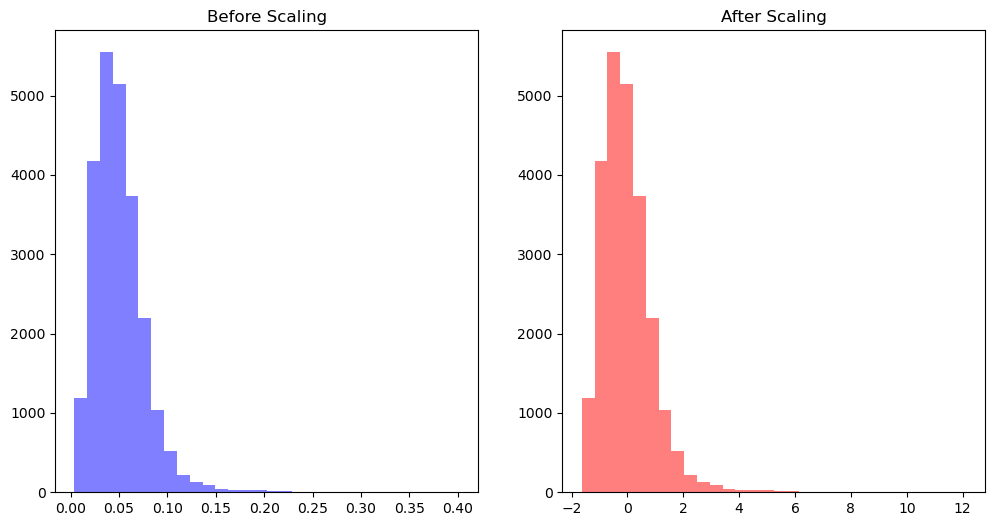

In [16]:
# standardize statistical node features
from sklearn.preprocessing import StandardScaler

# Concatenate all x values before scaling for the first feature, as a sanity check for standardization
x_before = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

scaler = StandardScaler()
scaler.fit(np.vstack([data.x.numpy() for data in X_train + X_val]))


# Transform the x values of the data in X_train
for data in X_train:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_val
for data in X_val:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_test
for data in X_test:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Concatenate all x values after scaling for the first feature, as a sanity check for standardization
x_after = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

# Plot the distribution of the first x feature before and after scaling as a sanity check
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(x_before, bins=30, color='b', alpha=0.5)
plt.title('Before Scaling')

plt.subplot(1, 2, 2)
plt.hist(x_after, bins=30, color='r', alpha=0.5)
plt.title('After Scaling')

plt.show()

### Model: graphLambda without edge_attr

In [17]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    # fc_layers = 1
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create the model
    model = graphLambda_wo_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ec_results_wo_edge_attrs_trials.pkl')

[I 2024-06-05 16:06:25,943] A new study created in memory with name: no-name-120a2824-6035-48ae-99fc-23530888aa24


Tested parameters: {'learning_rate': 1.1395241428946627e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.09458074400681778}


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
[I 2024-06-05 16:11:34,087] Trial 0 finished with value: 0.2812321186065674 and parameters: {'learning_rate': 1.1395241428946627e-05, 'optimizer': 'RMSprop'

Tested parameters: {'learning_rate': 0.004596469429357539, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.7647642303861029}


[I 2024-06-05 16:11:47,074] Trial 1 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0030467994315695646, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.3209336280429163}


[I 2024-06-05 16:11:59,365] Trial 2 pruned. Trial was pruned at epoch 100.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (10) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.00972288380941655, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.062489077540931075}


[I 2024-06-05 16:12:22,454] Trial 3 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0015209318032459098, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.40892025184522035}


[I 2024-06-05 16:12:54,298] Trial 4 pruned. Trial was pruned at epoch 245.


Tested parameters: {'learning_rate': 0.0001508440231726423, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.6304492424124521}


[I 2024-06-05 16:13:08,216] Trial 5 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.08410384378431034, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.20180626279741923}


[I 2024-06-05 16:13:21,596] Trial 6 pruned. Trial was pruned at epoch 100.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 2.2833376311706358e-05, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.686184527772419}


[I 2024-06-05 16:13:38,582] Trial 7 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.008245034917782666, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.032480946059026565}


[I 2024-06-05 16:13:52,021] Trial 8 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.02811257353985588, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.7734765639200523}


[I 2024-06-05 16:14:16,192] Trial 9 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.3048054790904574e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.43669776526804005}


[I 2024-06-05 16:19:26,993] Trial 10 finished with value: 0.2882438898086548 and parameters: {'learning_rate': 1.3048054790904574e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.43669776526804005}. Best is trial 10 with value: 0.2882438898086548.


Tested parameters: {'learning_rate': 1.0288758620572172e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.4850832131008532}


[I 2024-06-05 16:24:37,986] Trial 11 finished with value: 0.2888675928115845 and parameters: {'learning_rate': 1.0288758620572172e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.4850832131008532}. Best is trial 11 with value: 0.2888675928115845.


Tested parameters: {'learning_rate': 0.00010890530794929667, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.5022829716051915}


[I 2024-06-05 16:29:42,113] Trial 12 finished with value: 0.2547847032546997 and parameters: {'learning_rate': 0.00010890530794929667, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.5022829716051915}. Best is trial 11 with value: 0.2888675928115845.


Tested parameters: {'learning_rate': 6.209647333542405e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.5070102515999992}


[I 2024-06-05 16:34:48,918] Trial 13 finished with value: 0.27536875009536743 and parameters: {'learning_rate': 6.209647333542405e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.5070102515999992}. Best is trial 11 with value: 0.2888675928115845.


Tested parameters: {'learning_rate': 0.000395213125109905, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.3245598658511012}


[I 2024-06-05 16:39:59,943] Trial 14 finished with value: 0.2961285710334778 and parameters: {'learning_rate': 0.000395213125109905, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.3245598658511012}. Best is trial 14 with value: 0.2961285710334778.


Tested parameters: {'learning_rate': 0.0004539344589638982, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.25751407418239025}


[I 2024-06-05 16:45:08,978] Trial 15 finished with value: 0.2828649580478668 and parameters: {'learning_rate': 0.0004539344589638982, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.25751407418239025}. Best is trial 14 with value: 0.2961285710334778.


Tested parameters: {'learning_rate': 0.0005963871850836433, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.5735786360709779}


[I 2024-06-05 16:45:25,336] Trial 16 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 4.2213165629083e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.31391554516785036}


[I 2024-06-05 16:50:35,959] Trial 17 finished with value: 0.28125646710395813 and parameters: {'learning_rate': 4.2213165629083e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.31391554516785036}. Best is trial 14 with value: 0.2961285710334778.


Tested parameters: {'learning_rate': 0.00023286395873860197, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.18813609600898681}


[I 2024-06-05 16:55:44,508] Trial 18 finished with value: 0.28015342354774475 and parameters: {'learning_rate': 0.00023286395873860197, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.18813609600898681}. Best is trial 14 with value: 0.2961285710334778.


Tested parameters: {'learning_rate': 0.0010770630347137207, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.33813711297191706}


[I 2024-06-05 17:00:57,613] Trial 19 finished with value: 0.2758047580718994 and parameters: {'learning_rate': 0.0010770630347137207, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.33813711297191706}. Best is trial 14 with value: 0.2961285710334778.


Tested parameters: {'learning_rate': 4.172098015637559e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.48169771544920736}


[I 2024-06-05 17:05:35,598] Trial 20 finished with value: 0.2317567616701126 and parameters: {'learning_rate': 4.172098015637559e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.48169771544920736}. Best is trial 14 with value: 0.2961285710334778.


Tested parameters: {'learning_rate': 3.215463968922367e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.4200903878949502}


[I 2024-06-05 17:10:41,903] Trial 21 finished with value: 0.27228161692619324 and parameters: {'learning_rate': 3.215463968922367e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.4200903878949502}. Best is trial 14 with value: 0.2961285710334778.


Tested parameters: {'learning_rate': 1.0566940746771519e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.42574521359361034}


[I 2024-06-05 17:15:43,425] Trial 22 finished with value: 0.30116379261016846 and parameters: {'learning_rate': 1.0566940746771519e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.42574521359361034}. Best is trial 22 with value: 0.30116379261016846.


Tested parameters: {'learning_rate': 1.4229123349429619e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.5637942555873786}


[I 2024-06-05 17:20:45,396] Trial 23 finished with value: 0.28992608189582825 and parameters: {'learning_rate': 1.4229123349429619e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.5637942555873786}. Best is trial 22 with value: 0.30116379261016846.


Tested parameters: {'learning_rate': 8.116897566340549e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.5798859358882777}


[I 2024-06-05 17:23:21,246] Trial 24 finished with value: 0.26698848605155945 and parameters: {'learning_rate': 8.116897566340549e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.5798859358882777}. Best is trial 22 with value: 0.30116379261016846.


Tested parameters: {'learning_rate': 0.0002883152427541297, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.3619256863097615}


[I 2024-06-05 17:28:29,856] Trial 25 finished with value: 0.31783854961395264 and parameters: {'learning_rate': 0.0002883152427541297, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.3619256863097615}. Best is trial 25 with value: 0.31783854961395264.


Tested parameters: {'learning_rate': 0.00018886303923083508, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.3445676725779854}


[I 2024-06-05 17:32:11,626] Trial 26 finished with value: 0.2916285991668701 and parameters: {'learning_rate': 0.00018886303923083508, 'optimizer': 'RMSprop', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.3445676725779854}. Best is trial 25 with value: 0.31783854961395264.


Tested parameters: {'learning_rate': 0.00040888905933241914, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.24552649023665418}


[I 2024-06-05 17:37:21,204] Trial 27 finished with value: 0.30970847606658936 and parameters: {'learning_rate': 0.00040888905933241914, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.24552649023665418}. Best is trial 25 with value: 0.31783854961395264.


Tested parameters: {'learning_rate': 0.001349829525274376, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.1350473692451698}


[I 2024-06-05 17:42:36,094] Trial 28 finished with value: 0.2732105851173401 and parameters: {'learning_rate': 0.001349829525274376, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.1350473692451698}. Best is trial 25 with value: 0.31783854961395264.


Tested parameters: {'learning_rate': 0.00030225807074206175, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.25537236145146147}


[I 2024-06-05 17:47:46,630] Trial 29 finished with value: 0.3191404938697815 and parameters: {'learning_rate': 0.00030225807074206175, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.25537236145146147}. Best is trial 29 with value: 0.3191404938697815.


Tested parameters: {'learning_rate': 0.0003467937154853871, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.24258393042248538}


[I 2024-06-05 17:48:30,838] Trial 30 pruned. Trial was pruned at epoch 383.


Tested parameters: {'learning_rate': 0.0006963745990356008, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.14919728106571406}


[I 2024-06-05 17:53:40,956] Trial 31 finished with value: 0.303088515996933 and parameters: {'learning_rate': 0.0006963745990356008, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.14919728106571406}. Best is trial 29 with value: 0.3191404938697815.


Tested parameters: {'learning_rate': 0.0007934940133168471, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.11770521516097476}


[I 2024-06-05 17:58:45,471] Trial 32 finished with value: 0.31715136766433716 and parameters: {'learning_rate': 0.0007934940133168471, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.11770521516097476}. Best is trial 29 with value: 0.3191404938697815.


Tested parameters: {'learning_rate': 0.0025631404933244045, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.27238393913971437}


[I 2024-06-05 18:03:12,678] Trial 33 finished with value: 0.28886687755584717 and parameters: {'learning_rate': 0.0025631404933244045, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.27238393913971437}. Best is trial 29 with value: 0.3191404938697815.


Tested parameters: {'learning_rate': 0.00027031419004892073, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.11391198695443008}


[I 2024-06-05 18:08:25,168] Trial 34 finished with value: 0.330598384141922 and parameters: {'learning_rate': 0.00027031419004892073, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.11391198695443008}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.002246724942425864, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.08593093003346151}


[I 2024-06-05 18:10:58,428] Trial 35 finished with value: 0.28537777066230774 and parameters: {'learning_rate': 0.002246724942425864, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.08593093003346151}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.0002642104216222441, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.13231274996065495}


[I 2024-06-05 18:11:10,326] Trial 36 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0007804738439467541, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.020108383461640345}


[I 2024-06-05 18:18:29,956] Trial 37 finished with value: 0.2614777088165283 and parameters: {'learning_rate': 0.0007804738439467541, 'optimizer': 'SGD', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.020108383461640345}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.00013391966501151035, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.20982013361951324}


[I 2024-06-05 18:22:09,729] Trial 38 finished with value: 0.27727562189102173 and parameters: {'learning_rate': 0.00013391966501151035, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.20982013361951324}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.0014590140378714178, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.06535514520141367}


[I 2024-06-05 18:22:39,656] Trial 39 pruned. Trial was pruned at epoch 213.


Tested parameters: {'learning_rate': 0.0048235895200913845, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.16904173076554246}


[I 2024-06-05 18:30:03,022] Trial 40 finished with value: 0.29271143674850464 and parameters: {'learning_rate': 0.0048235895200913845, 'optimizer': 'SGD', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.16904173076554246}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.00023494977713440162, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.22729489799269773}


[I 2024-06-05 18:35:11,645] Trial 41 finished with value: 0.2689704895019531 and parameters: {'learning_rate': 0.00023494977713440162, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.22729489799269773}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.000460827386427243, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.38041008714673774}


[I 2024-06-05 18:35:31,318] Trial 42 pruned. Trial was pruned at epoch 167.


Tested parameters: {'learning_rate': 8.0891453916521e-05, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.27625665595328563}


[I 2024-06-05 18:40:33,752] Trial 43 finished with value: 0.19270059466362 and parameters: {'learning_rate': 8.0891453916521e-05, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.27625665595328563}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.0009098303630252315, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.11588320089242696}


[I 2024-06-05 18:45:45,284] Trial 44 finished with value: 0.29499727487564087 and parameters: {'learning_rate': 0.0009098303630252315, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.11588320089242696}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.00015329880365583956, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.29355267843360117}


[I 2024-06-05 18:48:27,129] Trial 45 finished with value: 0.27483421564102173 and parameters: {'learning_rate': 0.00015329880365583956, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.29355267843360117}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.0003086841180840888, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.37029423845759946}


[I 2024-06-05 18:53:34,298] Trial 46 finished with value: 0.1905861794948578 and parameters: {'learning_rate': 0.0003086841180840888, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.37029423845759946}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.0005573303405407429, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.049471211782563695}


[I 2024-06-05 18:58:42,372] Trial 47 finished with value: 0.31740811467170715 and parameters: {'learning_rate': 0.0005573303405407429, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.049471211782563695}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.005416019617414249, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.026553349517314598}


[I 2024-06-05 19:03:57,465] Trial 48 finished with value: 0.2998167872428894 and parameters: {'learning_rate': 0.005416019617414249, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.026553349517314598}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.014889377313291173, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.0693015770233752}


[I 2024-06-05 19:11:09,591] Trial 49 finished with value: 0.297647088766098 and parameters: {'learning_rate': 0.014889377313291173, 'optimizer': 'SGD', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.0693015770233752}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.001753833892094907, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.09520704550195663}


[I 2024-06-05 19:14:46,224] Trial 50 finished with value: 0.28531694412231445 and parameters: {'learning_rate': 0.001753833892094907, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.09520704550195663}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.0005346012100013707, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.17805065673027376}


[I 2024-06-05 19:19:58,723] Trial 51 finished with value: 0.32624977827072144 and parameters: {'learning_rate': 0.0005346012100013707, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.17805065673027376}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.0005423659856739273, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.004252700451557456}


[I 2024-06-05 19:25:04,667] Trial 52 finished with value: 0.3002459406852722 and parameters: {'learning_rate': 0.0005423659856739273, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.004252700451557456}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.0010086331505045694, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.15873169951841146}


[I 2024-06-05 19:30:13,492] Trial 53 finished with value: 0.29689425230026245 and parameters: {'learning_rate': 0.0010086331505045694, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.15873169951841146}. Best is trial 34 with value: 0.330598384141922.


Tested parameters: {'learning_rate': 0.0006210924272386651, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.19161299932130532}


[I 2024-06-05 19:35:21,265] Trial 54 finished with value: 0.3379698395729065 and parameters: {'learning_rate': 0.0006210924272386651, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.19161299932130532}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.00018570139814036622, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.18619018255859543}


[I 2024-06-05 19:40:30,949] Trial 55 finished with value: 0.23853477835655212 and parameters: {'learning_rate': 0.00018570139814036622, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.18619018255859543}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.00010631344027647879, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.21259153449845747}


[I 2024-06-05 19:45:33,185] Trial 56 finished with value: 0.30533772706985474 and parameters: {'learning_rate': 0.00010631344027647879, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.21259153449845747}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0005571074347288837, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.10223298286413664}


[I 2024-06-05 19:50:45,720] Trial 57 finished with value: 0.2321438044309616 and parameters: {'learning_rate': 0.0005571074347288837, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.10223298286413664}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0002977551613368011, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.7356530342175995}


[I 2024-06-05 19:50:59,191] Trial 58 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0001945281462934831, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.04735632949117642}


[I 2024-06-05 19:56:11,264] Trial 59 finished with value: 0.29984617233276367 and parameters: {'learning_rate': 0.0001945281462934831, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.04735632949117642}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0035221747104911333, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.17730289513297537}


[I 2024-06-05 19:58:46,128] Trial 60 finished with value: 0.3047358989715576 and parameters: {'learning_rate': 0.0035221747104911333, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.17730289513297537}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.000631770066989577, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.1314508587297485}


[I 2024-06-05 20:03:58,631] Trial 61 finished with value: 0.28057345747947693 and parameters: {'learning_rate': 0.000631770066989577, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.1314508587297485}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0010692822991156176, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.1098072074093991}


[I 2024-06-05 20:09:07,616] Trial 62 finished with value: 0.2752184271812439 and parameters: {'learning_rate': 0.0010692822991156176, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.1098072074093991}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0003770173111608733, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.30335636634559154}


[I 2024-06-05 20:14:18,798] Trial 63 finished with value: 0.2369758039712906 and parameters: {'learning_rate': 0.0003770173111608733, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.30335636634559154}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0007172805960656497, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.1989774709751092}


[I 2024-06-05 20:19:23,670] Trial 64 finished with value: 0.2924046218395233 and parameters: {'learning_rate': 0.0007172805960656497, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.1989774709751092}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.00201409772761552, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.15518847151115311}


[I 2024-06-05 20:19:35,169] Trial 65 pruned. Trial was pruned at epoch 101.


Tested parameters: {'learning_rate': 0.06614660672359353, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.45177629665272245}


[I 2024-06-05 20:24:45,273] Trial 66 finished with value: 0.27722764015197754 and parameters: {'learning_rate': 0.06614660672359353, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.45177629665272245}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.001243720643543877, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.23743490722625932}


[I 2024-06-05 20:24:56,639] Trial 67 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00012661787089160925, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.04936053789151911}


[I 2024-06-05 20:28:37,817] Trial 68 finished with value: 0.3063313961029053 and parameters: {'learning_rate': 0.00012661787089160925, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.04936053789151911}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.00045381012363874824, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.07680716970497009}


[I 2024-06-05 20:33:43,498] Trial 69 finished with value: 0.23604774475097656 and parameters: {'learning_rate': 0.00045381012363874824, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.07680716970497009}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0008611575304094829, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.12870492817380377}


[I 2024-06-05 20:33:56,352] Trial 70 pruned. Trial was pruned at epoch 105.


Tested parameters: {'learning_rate': 0.0004013518447528544, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.27307800111659325}


[I 2024-06-05 20:34:08,127] Trial 71 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0002549360603570705, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.24550490901269945}


[I 2024-06-05 20:39:19,943] Trial 72 finished with value: 0.29931312799453735 and parameters: {'learning_rate': 0.0002549360603570705, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.24550490901269945}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0005228598306957064, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.3354063138193512}


[I 2024-06-05 20:39:32,353] Trial 73 pruned. Trial was pruned at epoch 104.


Tested parameters: {'learning_rate': 0.0003535171289335146, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.36310916893941614}


[I 2024-06-05 20:39:43,976] Trial 74 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00020014084255492437, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.2159376879171377}


[I 2024-06-05 20:44:10,355] Trial 75 finished with value: 0.30308571457862854 and parameters: {'learning_rate': 0.00020014084255492437, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.2159376879171377}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0007789442064607565, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.2606143807072821}


[I 2024-06-05 20:49:14,963] Trial 76 finished with value: 0.31962496042251587 and parameters: {'learning_rate': 0.0007789442064607565, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.2606143807072821}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0007395858728542584, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.17909744015362142}


[I 2024-06-05 20:54:26,392] Trial 77 finished with value: 0.3172358572483063 and parameters: {'learning_rate': 0.0007395858728542584, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.17909744015362142}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0016017661633841943, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.3972074560360941}


[I 2024-06-05 20:59:31,154] Trial 78 finished with value: 0.2732817232608795 and parameters: {'learning_rate': 0.0016017661633841943, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.3972074560360941}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0006280742433702779, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.288743552024882}


[I 2024-06-05 21:02:06,003] Trial 79 finished with value: 0.33162641525268555 and parameters: {'learning_rate': 0.0006280742433702779, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.288743552024882}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 8.846955824163712e-05, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.2939378641654587}


[I 2024-06-05 21:04:40,013] Trial 80 finished with value: 0.12722453474998474 and parameters: {'learning_rate': 8.846955824163712e-05, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.2939378641654587}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0006606895413034153, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.26104647989958707}


[I 2024-06-05 21:07:12,900] Trial 81 finished with value: 0.3159233331680298 and parameters: {'learning_rate': 0.0006606895413034153, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.26104647989958707}. Best is trial 54 with value: 0.3379698395729065.


Tested parameters: {'learning_rate': 0.0002976897695991558, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.19049657029010222}


[I 2024-06-05 21:09:43,951] Trial 82 finished with value: 0.3451659679412842 and parameters: {'learning_rate': 0.0002976897695991558, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.19049657029010222}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.00029845057935150743, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.3527952916632635}


[I 2024-06-05 21:10:19,108] Trial 83 pruned. Trial was pruned at epoch 152.


Tested parameters: {'learning_rate': 0.00016816651334698341, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.3159489024378909}


[I 2024-06-05 21:10:57,662] Trial 84 pruned. Trial was pruned at epoch 173.


Tested parameters: {'learning_rate': 0.00023739331465465706, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.1981447014498975}


[I 2024-06-05 21:13:31,688] Trial 85 finished with value: 0.3092159628868103 and parameters: {'learning_rate': 0.00023739331465465706, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.1981447014498975}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.0012233430872985451, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.22751131687277243}


[I 2024-06-05 21:16:04,973] Trial 86 finished with value: 0.32201188802719116 and parameters: {'learning_rate': 0.0012233430872985451, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.22751131687277243}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.0032417162820559953, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.22977233098693897}


[I 2024-06-05 21:18:42,605] Trial 87 finished with value: 0.2789378762245178 and parameters: {'learning_rate': 0.0032417162820559953, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.22977233098693897}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.0012394609292521249, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.28181898605510136}


[I 2024-06-05 21:19:06,645] Trial 88 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0004470432460373022, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.2558421410708452}


[I 2024-06-05 21:19:30,179] Trial 89 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0003191324311700006, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.14954785520006708}


[I 2024-06-05 21:22:03,701] Trial 90 finished with value: 0.3012406826019287 and parameters: {'learning_rate': 0.0003191324311700006, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.14954785520006708}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.0009047218815824657, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.22020825878074185}


[I 2024-06-05 21:24:40,231] Trial 91 finished with value: 0.3022240102291107 and parameters: {'learning_rate': 0.0009047218815824657, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.22020825878074185}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.0005261116830082555, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.3273753115591662}


[I 2024-06-05 21:25:03,202] Trial 92 pruned. Trial was pruned at epoch 101.


Tested parameters: {'learning_rate': 0.0006023365488519349, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.17404391868274685}


[I 2024-06-05 21:28:41,812] Trial 93 finished with value: 0.3021432161331177 and parameters: {'learning_rate': 0.0006023365488519349, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.17404391868274685}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.0002613260121976155, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.19407445559878936}


[I 2024-06-05 21:31:17,129] Trial 94 finished with value: 0.3283526599407196 and parameters: {'learning_rate': 0.0002613260121976155, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.19407445559878936}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.00021987413583281524, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.20101244424911252}


[I 2024-06-05 21:33:53,067] Trial 95 finished with value: 0.280228853225708 and parameters: {'learning_rate': 0.00021987413583281524, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.20101244424911252}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.0001223268383479535, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.25753054311314116}


[I 2024-06-05 21:34:24,757] Trial 96 pruned. Trial was pruned at epoch 140.


Tested parameters: {'learning_rate': 0.00036292871484964236, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.30787856065346736}


[I 2024-06-05 21:36:58,600] Trial 97 finished with value: 0.3031870722770691 and parameters: {'learning_rate': 0.00036292871484964236, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.30787856065346736}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.0002549268704599002, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.1672649348969708}


[I 2024-06-05 21:39:35,111] Trial 98 finished with value: 0.15860310196876526 and parameters: {'learning_rate': 0.0002549268704599002, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.1672649348969708}. Best is trial 82 with value: 0.3451659679412842.


Tested parameters: {'learning_rate': 0.00016530704407672912, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.23085055371183244}


[I 2024-06-05 21:46:46,069] Trial 99 finished with value: 0.28918230533599854 and parameters: {'learning_rate': 0.00016530704407672912, 'optimizer': 'SGD', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.23085055371183244}. Best is trial 82 with value: 0.3451659679412842.


Best trial:
  Value: 0.3451659679412842
  Params: 
    learning_rate: 0.0002976897695991558
    optimizer: SGD
    batch_size: 170
    fc_layers: 4
    dropout: 0.19049657029010222


In [18]:
df_trials = pd.read_pickle('ec_results_wo_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
82,82,0.345166,2024-06-05 21:07:12.901957,2024-06-05 21:09:43.950813,0 days 00:02:31.048856,170,0.190497,4,0.000298,SGD,COMPLETE
54,54,0.337970,2024-06-05 19:30:13.494491,2024-06-05 19:35:21.262831,0 days 00:05:07.768340,680,0.191613,4,0.000621,SGD,COMPLETE
79,79,0.331626,2024-06-05 20:59:31.155617,2024-06-05 21:02:06.001262,0 days 00:02:34.845645,170,0.288744,4,0.000628,SGD,COMPLETE
34,34,0.330598,2024-06-05 18:03:12.680297,2024-06-05 18:08:25.165724,0 days 00:05:12.485427,680,0.113912,4,0.000270,SGD,COMPLETE
94,94,0.328353,2024-06-05 21:28:41.812818,2024-06-05 21:31:17.129027,0 days 00:02:35.316209,170,0.194074,4,0.000261,SGD,COMPLETE
51,51,0.326250,2024-06-05 19:14:46.224844,2024-06-05 19:19:58.720062,0 days 00:05:12.495218,680,0.178051,4,0.000535,SGD,COMPLETE
86,86,0.322012,2024-06-05 21:13:31.689943,2024-06-05 21:16:04.972139,0 days 00:02:33.282196,170,0.227511,4,0.001223,SGD,COMPLETE
76,76,0.319625,2024-06-05 20:44:10.357096,2024-06-05 20:49:14.955224,0 days 00:05:04.598128,680,0.260614,4,0.000779,SGD,COMPLETE
29,29,0.319140,2024-06-05 17:42:36.095494,2024-06-05 17:47:46.627275,0 days 00:05:10.531781,680,0.255372,4,0.000302,SGD,COMPLETE
25,25,0.317839,2024-06-05 17:23:21.248052,2024-06-05 17:28:29.853437,0 days 00:05:08.605385,680,0.361926,3,0.000288,RMSprop,COMPLETE


#### Visualizations

In [19]:
# function to change axes size
def set_size(w,h, ax=None):
    """ w, h: width, height in inches """
    if not ax: ax=plt.gca()
    l = ax.figure.subplotpars.left
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)

/tmp/ipykernel_1565098/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

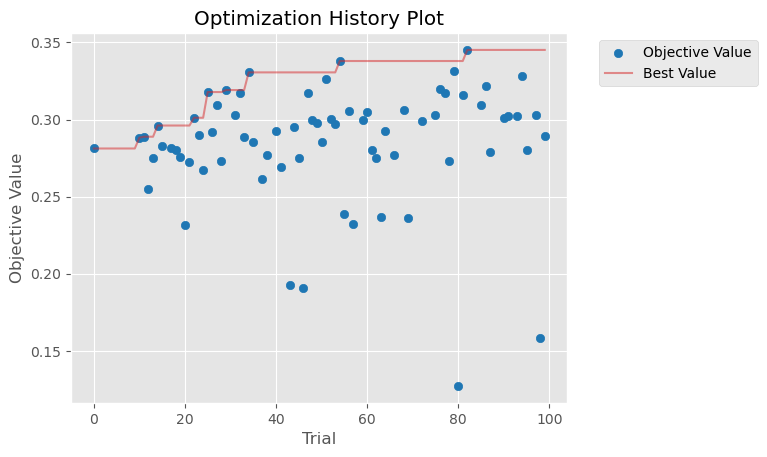

In [20]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-05 21:46:46,481] A new study created in memory with name: no-name-4754fe4e-5475-4558-b634-619a25b6d306
/tmp/ipykernel_1565098/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


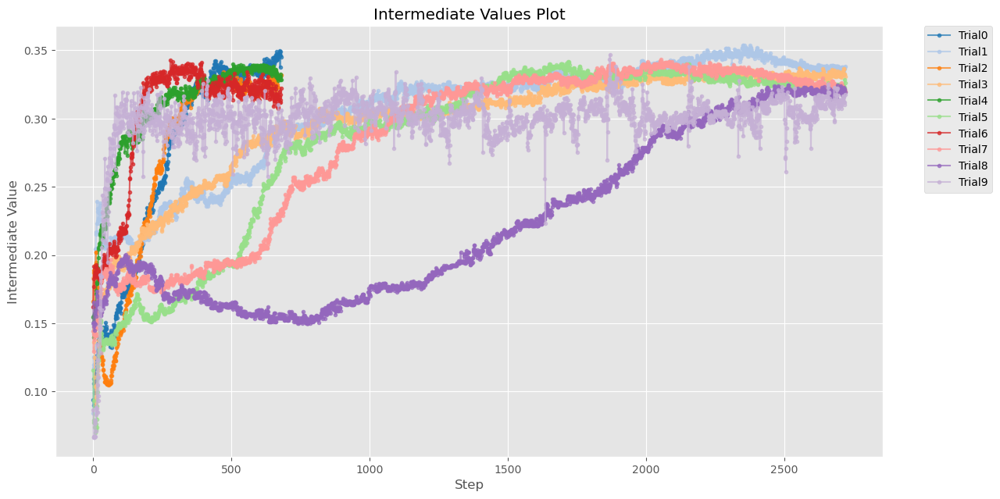

In [21]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_1565098/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


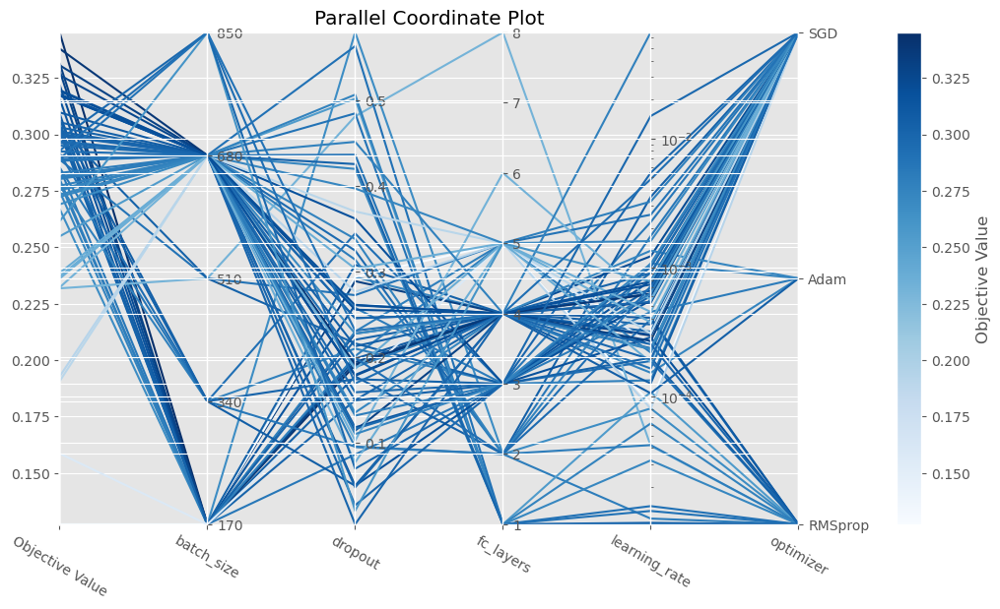

In [22]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_1565098/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-05 21:46:47,946] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


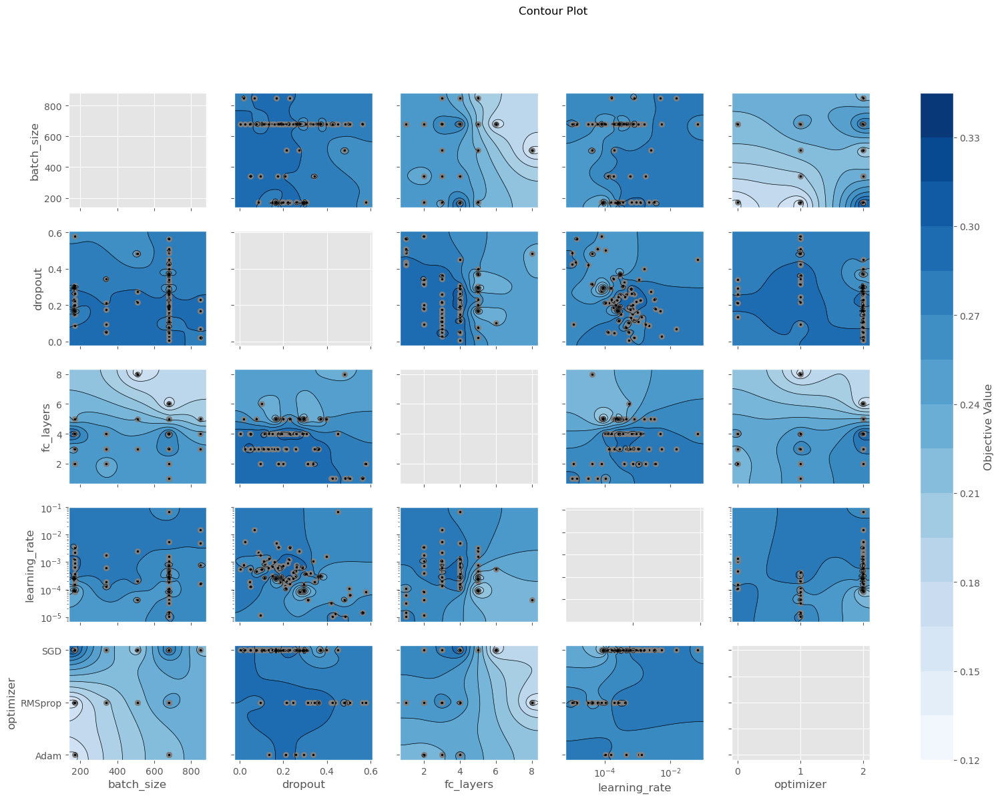

In [23]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_1565098/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

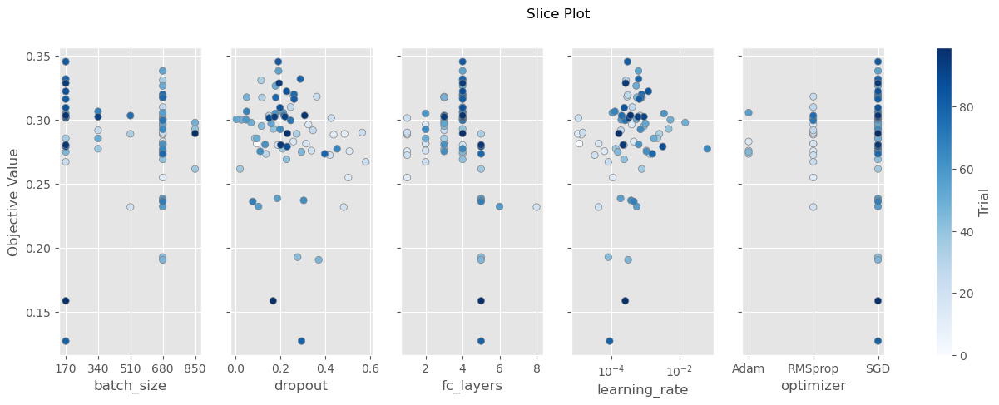

In [24]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_1565098/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

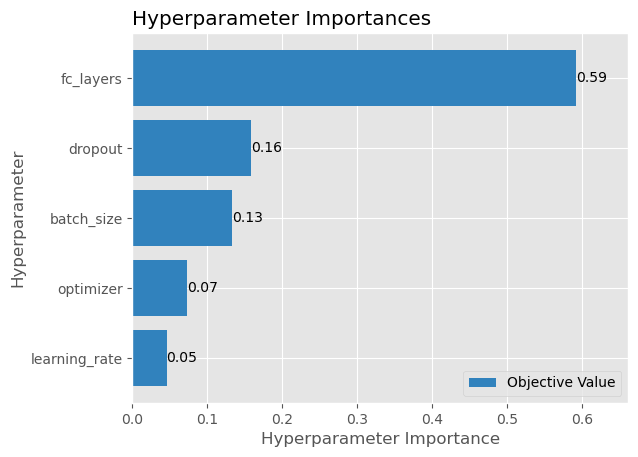

In [25]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_1565098/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

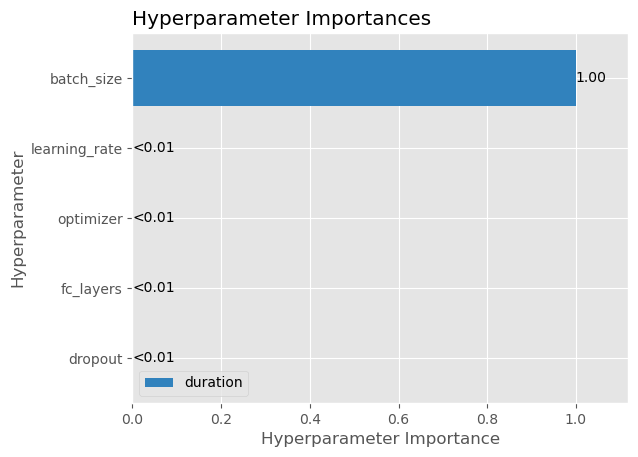

In [26]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_1565098/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

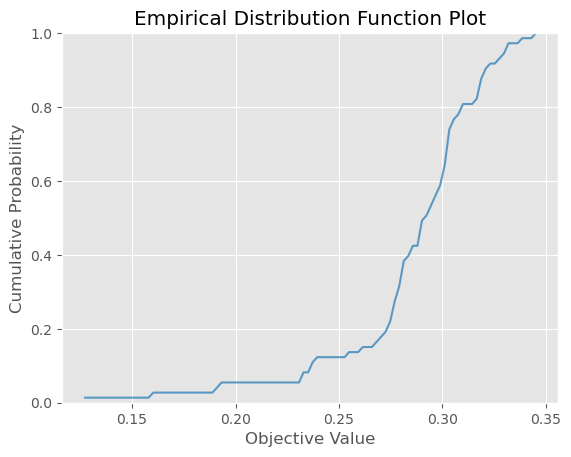

In [27]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_1565098/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-05 21:46:55,045] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


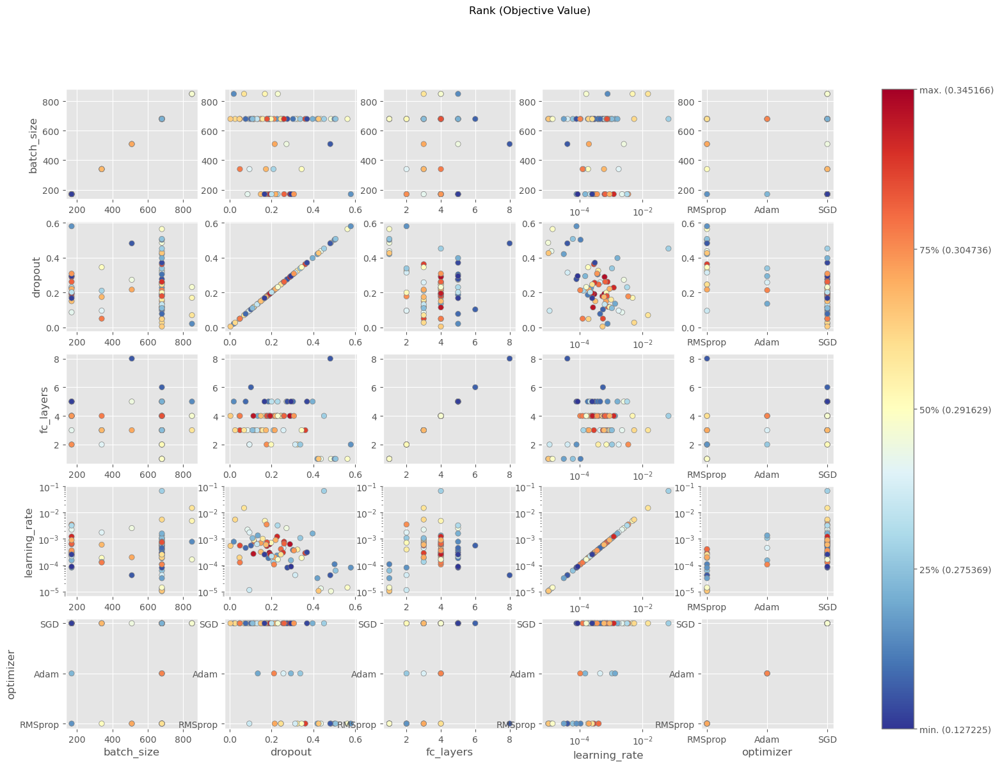

In [28]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_1565098/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


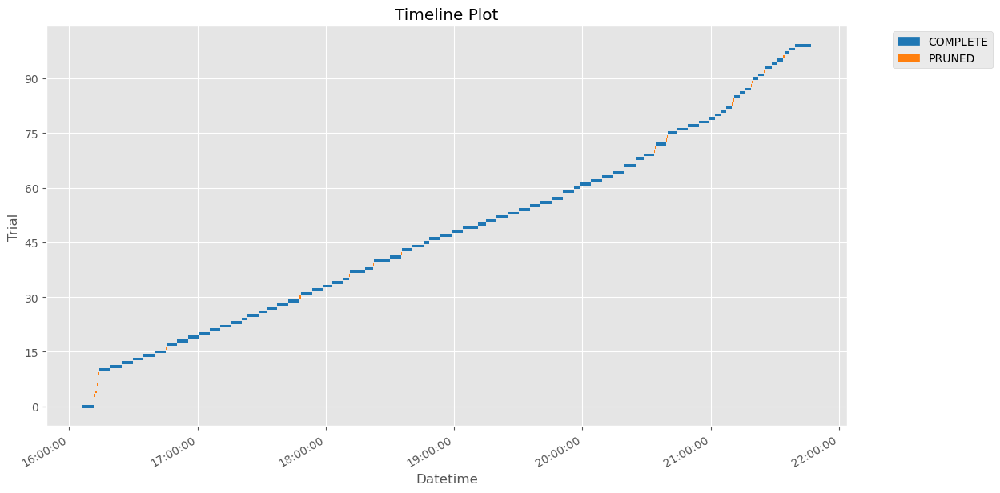

In [29]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda with edge_attr

In [30]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    # fc_layers = 1
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size


    # Create the model
    model = graphLambda_w_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ec_results_w_edge_attrs_trials.pkl')

[I 2024-06-05 21:46:58,100] A new study created in memory with name: no-name-d9e87db5-4149-4daa-8524-a67b28d2ac75
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.05635190357484962, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.11145432531330411}


[I 2024-06-05 21:47:17,879] Trial 0 pruned. Trial was pruned at epoch 100.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (10) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 2.3547749861617485e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.4330923184432048}


[I 2024-06-05 21:50:11,451] Trial 1 finished with value: 0.30945760011672974 and parameters: {'learning_rate': 2.3547749861617485e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.4330923184432048}. Best is trial 1 with value: 0.30945760011672974.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (3) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.009720924874606815, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.044408839777313074}


[I 2024-06-05 21:55:32,684] Trial 2 finished with value: 0.31115591526031494 and parameters: {'learning_rate': 0.009720924874606815, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.044408839777313074}. Best is trial 2 with value: 0.31115591526031494.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.001079606863151937, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.4003160592074938}


[I 2024-06-05 21:55:49,506] Trial 3 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0011551194010280116, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.21047735993424377}


[I 2024-06-05 22:02:06,933] Trial 4 finished with value: 0.31290337443351746 and parameters: {'learning_rate': 0.0011551194010280116, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.21047735993424377}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.01257914474512578, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.3412520920861785}


[I 2024-06-05 22:02:21,884] Trial 5 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.005413743985887988, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.6001855160639911}


[I 2024-06-05 22:02:42,393] Trial 6 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0008590704700513692, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.5210069525369171}


[I 2024-06-05 22:03:09,525] Trial 7 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00021508575050646162, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.28967995242850453}


[I 2024-06-05 22:07:34,990] Trial 8 finished with value: 0.28562110662460327 and parameters: {'learning_rate': 0.00021508575050646162, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.28967995242850453}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.00013712317569658915, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.28289656189242757}


[I 2024-06-05 22:08:02,384] Trial 9 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.0215159567690476e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.7707111773627864}


[I 2024-06-05 22:14:10,794] Trial 10 finished with value: 0.2797919511795044 and parameters: {'learning_rate': 1.0215159567690476e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.7707111773627864}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.007734526267006155, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.005767551901939998}


[I 2024-06-05 22:14:27,169] Trial 11 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.08337737787273469, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.15662380604362514}


[I 2024-06-05 22:14:44,425] Trial 12 pruned. Trial was pruned at epoch 111.


Tested parameters: {'learning_rate': 0.0022538157145150363, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.15422864353211402}


[I 2024-06-05 22:15:08,542] Trial 13 pruned. Trial was pruned at epoch 155.


Tested parameters: {'learning_rate': 0.022572578530520613, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.02096397899143493}


[I 2024-06-05 22:21:13,862] Trial 14 finished with value: 0.30112606287002563 and parameters: {'learning_rate': 0.022572578530520613, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.02096397899143493}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.0005751029295720504, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.21588696399948204}


[I 2024-06-05 22:30:06,006] Trial 15 finished with value: 0.27482253313064575 and parameters: {'learning_rate': 0.0005751029295720504, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.21588696399948204}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.0036855086898676085, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 8, 'dropout': 0.06681469667349219}


[I 2024-06-05 22:30:19,907] Trial 16 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00012945414399205012, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.20155900411547753}


[I 2024-06-05 22:35:44,658] Trial 17 finished with value: 0.30859455466270447 and parameters: {'learning_rate': 0.00012945414399205012, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.20155900411547753}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.03019971477623218, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.2565863543531515}


[I 2024-06-05 22:36:00,097] Trial 18 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0019905898010340005, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.09061780356555538}


[I 2024-06-05 22:36:14,112] Trial 19 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0002830544454213844, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.47213621846452253}


[I 2024-06-05 22:36:38,701] Trial 20 pruned. Trial was pruned at epoch 159.


Tested parameters: {'learning_rate': 3.0107897405174248e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.39407769852458124}


[I 2024-06-05 22:39:37,582] Trial 21 finished with value: 0.3031631112098694 and parameters: {'learning_rate': 3.0107897405174248e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.39407769852458124}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 4.958944364273282e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.5290957471903697}


[I 2024-06-05 22:42:34,803] Trial 22 finished with value: 0.28682467341423035 and parameters: {'learning_rate': 4.958944364273282e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.5290957471903697}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 1.2343447579347703e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.7057748015659933}


[I 2024-06-05 22:42:59,313] Trial 23 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0005650951380368138, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.35198384457176585}


[I 2024-06-05 22:43:15,837] Trial 24 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 4.8549413731218595e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.4469630018745923}


[I 2024-06-05 22:46:15,906] Trial 25 finished with value: 0.3070380985736847 and parameters: {'learning_rate': 4.8549413731218595e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.4469630018745923}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.012786320153203143, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.6048100767470876}


[I 2024-06-05 22:46:29,940] Trial 26 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.002455795254395907, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.1532696707318031}


[I 2024-06-05 22:46:56,426] Trial 27 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00033830354129078973, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.0596821730953116}


[I 2024-06-05 22:52:20,592] Trial 28 finished with value: 0.24455875158309937 and parameters: {'learning_rate': 0.00033830354129078973, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.0596821730953116}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.035141296042716, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.12335406999409156}


[I 2024-06-05 22:52:40,924] Trial 29 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0012838696428807026, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.1972222822215321}


[I 2024-06-05 22:52:54,964] Trial 30 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 8.795669627892713e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.22364376931989838}


[I 2024-06-05 22:58:18,769] Trial 31 finished with value: 0.28223058581352234 and parameters: {'learning_rate': 8.795669627892713e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.22364376931989838}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 2.055123075742435e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.3242667366179821}


[I 2024-06-05 23:03:40,937] Trial 32 finished with value: 0.30257606506347656 and parameters: {'learning_rate': 2.055123075742435e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.3242667366179821}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.000110613619140387, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.4030995042029709}


[I 2024-06-05 23:09:06,492] Trial 33 finished with value: 0.21003815531730652 and parameters: {'learning_rate': 0.000110613619140387, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.4030995042029709}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 5.26634783263637e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.18401509981060865}


[I 2024-06-05 23:18:04,891] Trial 34 finished with value: 0.2999655306339264 and parameters: {'learning_rate': 5.26634783263637e-05, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.18401509981060865}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 1.7492394610490712e-05, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.11065016137054781}


[I 2024-06-05 23:22:24,807] Trial 35 finished with value: 0.29050689935684204 and parameters: {'learning_rate': 1.7492394610490712e-05, 'optimizer': 'RMSprop', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.11065016137054781}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.006303489583161343, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.2500760959538946}


[I 2024-06-05 23:22:40,790] Trial 36 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00016867335905926527, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.33809462990488554}


[I 2024-06-05 23:28:52,246] Trial 37 finished with value: 0.14605936408042908 and parameters: {'learning_rate': 0.00016867335905926527, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.33809462990488554}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.0004479964036936148, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.29082118831498166}


[I 2024-06-05 23:31:49,730] Trial 38 finished with value: 0.2904941439628601 and parameters: {'learning_rate': 0.0004479964036936148, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.29082118831498166}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 0.001261951430347993, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.5349723115890048}


[I 2024-06-05 23:32:09,024] Trial 39 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 3.0008422040098915e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.6019579089331608}


[I 2024-06-05 23:32:29,658] Trial 40 pruned. Trial was pruned at epoch 129.


Tested parameters: {'learning_rate': 6.075103389159999e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.41856161635093087}


[I 2024-06-05 23:35:28,596] Trial 41 finished with value: 0.2738710641860962 and parameters: {'learning_rate': 6.075103389159999e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.41856161635093087}. Best is trial 4 with value: 0.31290337443351746.


Tested parameters: {'learning_rate': 3.0154102515029966e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.45402345444292874}


[I 2024-06-05 23:38:25,429] Trial 42 finished with value: 0.32392847537994385 and parameters: {'learning_rate': 3.0154102515029966e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.45402345444292874}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 2.453025128684798e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.4788068393965127}


[I 2024-06-05 23:41:21,443] Trial 43 finished with value: 0.26497146487236023 and parameters: {'learning_rate': 2.453025128684798e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.4788068393965127}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 9.295743926066651e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.5719683595054047}


[I 2024-06-05 23:44:16,183] Trial 44 finished with value: 0.268449604511261 and parameters: {'learning_rate': 9.295743926066651e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.5719683595054047}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.010540995454024801, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.3674537110229421}


[I 2024-06-05 23:44:32,434] Trial 45 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.4628309648173194e-05, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.02555515641838553}


[I 2024-06-05 23:50:37,994] Trial 46 finished with value: 0.21024832129478455 and parameters: {'learning_rate': 1.4628309648173194e-05, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.02555515641838553}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.00022029456356706967, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.29438236105414706}


[I 2024-06-05 23:56:06,491] Trial 47 finished with value: 0.3029186427593231 and parameters: {'learning_rate': 0.00022029456356706967, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.29438236105414706}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0035605688022220423, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.4878512581563514}


[I 2024-06-05 23:56:32,842] Trial 48 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0008520045443543782, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.6541081415283333}


[I 2024-06-05 23:56:46,379] Trial 49 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 7.51173720152521e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.44084388020936177}


[I 2024-06-06 00:02:10,237] Trial 50 finished with value: 0.29321420192718506 and parameters: {'learning_rate': 7.51173720152521e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.44084388020936177}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 3.7588156583836094e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.4429221674042983}


[I 2024-06-06 00:05:07,323] Trial 51 finished with value: 0.2817738354206085 and parameters: {'learning_rate': 3.7588156583836094e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.4429221674042983}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 3.875445280143924e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.37458571909524163}


[I 2024-06-06 00:08:02,402] Trial 52 finished with value: 0.2929649353027344 and parameters: {'learning_rate': 3.875445280143924e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.37458571909524163}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0001205341539982006, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.4379995022919254}


[I 2024-06-06 00:10:58,331] Trial 53 finished with value: 0.3175259232521057 and parameters: {'learning_rate': 0.0001205341539982006, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.4379995022919254}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0001516123346445817, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.5026205237517275}


[I 2024-06-06 00:13:50,833] Trial 54 finished with value: 0.2725212872028351 and parameters: {'learning_rate': 0.0001516123346445817, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.5026205237517275}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.019270859939203383, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.41862879507367795}


[I 2024-06-06 00:14:16,449] Trial 55 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.1311984655003282e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.3175119159301422}


[I 2024-06-06 00:17:09,989] Trial 56 finished with value: 0.28648489713668823 and parameters: {'learning_rate': 1.1311984655003282e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.3175119159301422}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.00029704138739184663, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.5658374034499364}


[I 2024-06-06 00:17:26,406] Trial 57 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.046512928939585016, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.26730784079923053}


[I 2024-06-06 00:17:40,791] Trial 58 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00013036132839483203, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.04699823667877168}


[I 2024-06-06 00:22:59,905] Trial 59 finished with value: 0.251491904258728 and parameters: {'learning_rate': 0.00013036132839483203, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.04699823667877168}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.07549196911051104, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.23502858369271523}


[I 2024-06-06 00:25:54,800] Trial 60 finished with value: 0.2656868100166321 and parameters: {'learning_rate': 0.07549196911051104, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.23502858369271523}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 6.820538384566413e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.44752194780723425}


[I 2024-06-06 00:28:49,608] Trial 61 finished with value: 0.2860743999481201 and parameters: {'learning_rate': 6.820538384566413e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.44752194780723425}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 2.7549661088587495e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.38896949905389083}


[I 2024-06-06 00:31:45,741] Trial 62 finished with value: 0.28535568714141846 and parameters: {'learning_rate': 2.7549661088587495e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.38896949905389083}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 4.1751177318608283e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.5128212047438256}


[I 2024-06-06 00:34:39,069] Trial 63 finished with value: 0.2939431965351105 and parameters: {'learning_rate': 4.1751177318608283e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.5128212047438256}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 1.5315678909817018e-05, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.4674737507481467}


[I 2024-06-06 00:39:02,479] Trial 64 finished with value: 0.2096596658229828 and parameters: {'learning_rate': 1.5315678909817018e-05, 'optimizer': 'RMSprop', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.4674737507481467}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.00019851016220210995, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.18066514726007077}


[I 2024-06-06 00:41:59,116] Trial 65 finished with value: 0.29884204268455505 and parameters: {'learning_rate': 0.00019851016220210995, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.18066514726007077}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 2.281593654917493e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.12361711510980414}


[I 2024-06-06 00:47:25,747] Trial 66 finished with value: 0.273406982421875 and parameters: {'learning_rate': 2.281593654917493e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.12361711510980414}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.00010605683921855869, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.5424705897544801}


[I 2024-06-06 00:47:39,775] Trial 67 pruned. Trial was pruned at epoch 101.


Tested parameters: {'learning_rate': 0.0007751258350054343, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.09264166906873887}


[I 2024-06-06 00:50:31,795] Trial 68 finished with value: 0.3150003254413605 and parameters: {'learning_rate': 0.0007751258350054343, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.09264166906873887}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0006860575313116282, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.1537876930896503}


[I 2024-06-06 00:55:52,132] Trial 69 finished with value: 0.2890702486038208 and parameters: {'learning_rate': 0.0006860575313116282, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.1537876930896503}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.004355694181001245, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.08433996627461653}


[I 2024-06-06 00:56:18,327] Trial 70 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 4.572697391010625e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.007246208494858686}


[I 2024-06-06 00:59:17,067] Trial 71 finished with value: 0.3155367076396942 and parameters: {'learning_rate': 4.572697391010625e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.007246208494858686}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0029544357230976643, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.02408603069783457}


[I 2024-06-06 00:59:42,756] Trial 72 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0018175447055108972, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.0009643498370443468}


[I 2024-06-06 01:02:37,916] Trial 73 finished with value: 0.2126835137605667 and parameters: {'learning_rate': 0.0018175447055108972, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.0009643498370443468}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 5.644275384216033e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.09482242117420084}


[I 2024-06-06 01:05:29,115] Trial 74 finished with value: 0.27045607566833496 and parameters: {'learning_rate': 5.644275384216033e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.09482242117420084}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0004101989716030217, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.05599597629592541}


[I 2024-06-06 01:08:23,069] Trial 75 finished with value: 0.31422606110572815 and parameters: {'learning_rate': 0.0004101989716030217, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.05599597629592541}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0009918542025663763, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.05581062813457678}


[I 2024-06-06 01:11:20,051] Trial 76 finished with value: 0.30749139189720154 and parameters: {'learning_rate': 0.0009918542025663763, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.05581062813457678}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0005035699951341449, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.06940686118416606}


[I 2024-06-06 01:14:15,490] Trial 77 finished with value: 0.28306466341018677 and parameters: {'learning_rate': 0.0005035699951341449, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.06940686118416606}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 1.8827619111526315e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.039586875861318975}


[I 2024-06-06 01:17:09,221] Trial 78 finished with value: 0.2772030830383301 and parameters: {'learning_rate': 1.8827619111526315e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.039586875861318975}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0014193205394019653, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.12191732917228029}


[I 2024-06-06 01:20:07,906] Trial 79 finished with value: 0.28758469223976135 and parameters: {'learning_rate': 0.0014193205394019653, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.12191732917228029}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0007106885337080584, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.014524354368135324}


[I 2024-06-06 01:28:59,302] Trial 80 finished with value: 0.31282752752304077 and parameters: {'learning_rate': 0.0007106885337080584, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.014524354368135324}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0003786705556857543, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.02279394527045984}


[I 2024-06-06 01:37:52,927] Trial 81 finished with value: 0.24546192586421967 and parameters: {'learning_rate': 0.0003786705556857543, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.02279394527045984}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0006501822801893079, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.07698654443547306}


[I 2024-06-06 01:46:46,647] Trial 82 finished with value: 0.27777716517448425 and parameters: {'learning_rate': 0.0006501822801893079, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.07698654443547306}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0007981398801624865, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.005765174816084115}


[I 2024-06-06 01:55:43,972] Trial 83 finished with value: 0.2781428098678589 and parameters: {'learning_rate': 0.0007981398801624865, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.005765174816084115}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0004343908935742882, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.10317681103371105}


[I 2024-06-06 02:04:46,583] Trial 84 finished with value: 0.29949134588241577 and parameters: {'learning_rate': 0.0004343908935742882, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.10317681103371105}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0002475154880349538, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.04350210396101628}


[I 2024-06-06 02:09:07,385] Trial 85 finished with value: 0.3048701286315918 and parameters: {'learning_rate': 0.0002475154880349538, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.04350210396101628}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.001476675277113228, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.13606482874957915}


[I 2024-06-06 02:15:20,870] Trial 86 finished with value: 0.29846954345703125 and parameters: {'learning_rate': 0.001476675277113228, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.13606482874957915}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 3.3955484747828814e-05, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.033637421600293524}


[I 2024-06-06 02:18:14,961] Trial 87 finished with value: 0.22157476842403412 and parameters: {'learning_rate': 3.3955484747828814e-05, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.033637421600293524}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0010267754744272756, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.06397703829758936}


[I 2024-06-06 02:21:09,539] Trial 88 finished with value: 0.31622421741485596 and parameters: {'learning_rate': 0.0010267754744272756, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.06397703829758936}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0010821359123065193, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.06498948353392606}


[I 2024-06-06 02:24:06,231] Trial 89 finished with value: 0.29537487030029297 and parameters: {'learning_rate': 0.0010821359123065193, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.06498948353392606}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.001747817836049025, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 1, 'dropout': 0.09032385702145007}


[I 2024-06-06 02:32:55,629] Trial 90 finished with value: 0.2677980065345764 and parameters: {'learning_rate': 0.001747817836049025, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 1, 'dropout': 0.09032385702145007}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0007143565841337085, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.0032310343305189445}


[I 2024-06-06 02:35:57,136] Trial 91 finished with value: 0.292392373085022 and parameters: {'learning_rate': 0.0007143565841337085, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.0032310343305189445}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0003837403468522846, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.4181693266073617}


[I 2024-06-06 02:38:54,802] Trial 92 finished with value: 0.31052058935165405 and parameters: {'learning_rate': 0.0003837403468522846, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.4181693266073617}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0005549711660368712, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.4111729080808828}


[I 2024-06-06 02:39:22,050] Trial 93 pruned. Trial was pruned at epoch 102.


Tested parameters: {'learning_rate': 0.0003584342706197542, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.055085050129166334}


[I 2024-06-06 02:42:22,129] Trial 94 finished with value: 0.2976251244544983 and parameters: {'learning_rate': 0.0003584342706197542, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.055085050129166334}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.0010578285980416672, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.13830670573152543}


[I 2024-06-06 02:42:48,636] Trial 95 pruned. Trial was pruned at epoch 101.


Tested parameters: {'learning_rate': 0.0022167556104698235, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.4644253057298747}


[I 2024-06-06 02:43:02,895] Trial 96 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.008718075158735489, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.026650003207877415}


[I 2024-06-06 02:43:32,199] Trial 97 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00031742270584133475, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.3599819534096417}


[I 2024-06-06 02:46:30,668] Trial 98 finished with value: 0.26799333095550537 and parameters: {'learning_rate': 0.00031742270584133475, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.3599819534096417}. Best is trial 42 with value: 0.32392847537994385.


Tested parameters: {'learning_rate': 0.00017772606026716229, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.17549655942049125}


[I 2024-06-06 02:46:57,560] Trial 99 pruned. Trial was pruned at epoch 100.


Best trial:
  Value: 0.32392847537994385
  Params: 
    learning_rate: 3.0154102515029966e-05
    optimizer: RMSprop
    batch_size: 170
    fc_layers: 3
    dropout: 0.45402345444292874


In [31]:
df_trials = pd.read_pickle('ec_results_w_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
42,42,0.323928,2024-06-05 23:35:28.597791,2024-06-05 23:38:25.429004,0 days 00:02:56.831213,170,0.454023,3,0.000030,RMSprop,COMPLETE
53,53,0.317526,2024-06-06 00:08:02.403968,2024-06-06 00:10:58.330254,0 days 00:02:55.926286,170,0.438000,3,0.000121,RMSprop,COMPLETE
88,88,0.316224,2024-06-06 02:18:14.963006,2024-06-06 02:21:09.537934,0 days 00:02:54.574928,170,0.063977,3,0.001027,Adam,COMPLETE
71,71,0.315537,2024-06-06 00:56:18.328627,2024-06-06 00:59:17.066290,0 days 00:02:58.737663,170,0.007246,3,0.000046,Adam,COMPLETE
68,68,0.315000,2024-06-06 00:47:39.776258,2024-06-06 00:50:31.794007,0 days 00:02:52.017749,170,0.092642,3,0.000775,Adam,COMPLETE
75,75,0.314226,2024-06-06 01:05:29.116100,2024-06-06 01:08:23.068454,0 days 00:02:53.952354,170,0.055996,3,0.000410,Adam,COMPLETE
4,4,0.312903,2024-06-05 21:55:49.507848,2024-06-05 22:02:06.930632,0 days 00:06:17.422784,680,0.210477,6,0.001155,Adam,COMPLETE
80,80,0.312828,2024-06-06 01:20:07.907854,2024-06-06 01:28:59.300210,0 days 00:08:51.392356,850,0.014524,3,0.000711,Adam,COMPLETE
2,2,0.311156,2024-06-05 21:50:11.452538,2024-06-05 21:55:32.682283,0 days 00:05:21.229745,510,0.044409,3,0.009721,SGD,COMPLETE
92,92,0.310521,2024-06-06 02:35:57.137676,2024-06-06 02:38:54.801850,0 days 00:02:57.664174,170,0.418169,3,0.000384,Adam,COMPLETE


#### Visualizations

/tmp/ipykernel_1565098/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

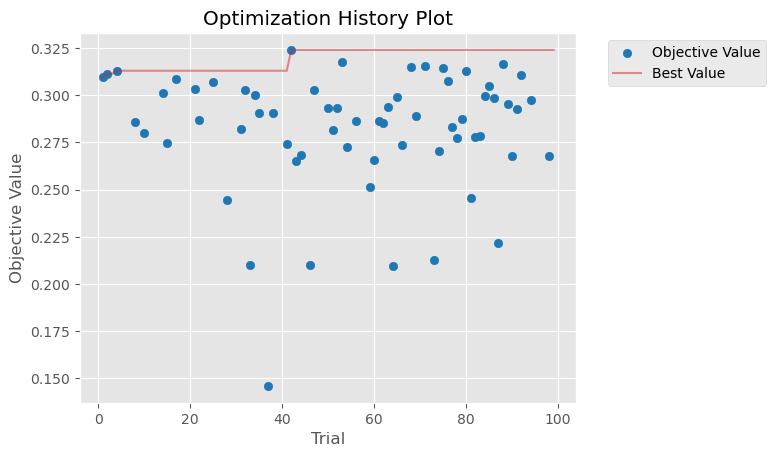

In [32]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-06 02:46:57,916] A new study created in memory with name: no-name-62c6e1df-481d-4cec-8803-4d3a43c8a434
/tmp/ipykernel_1565098/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


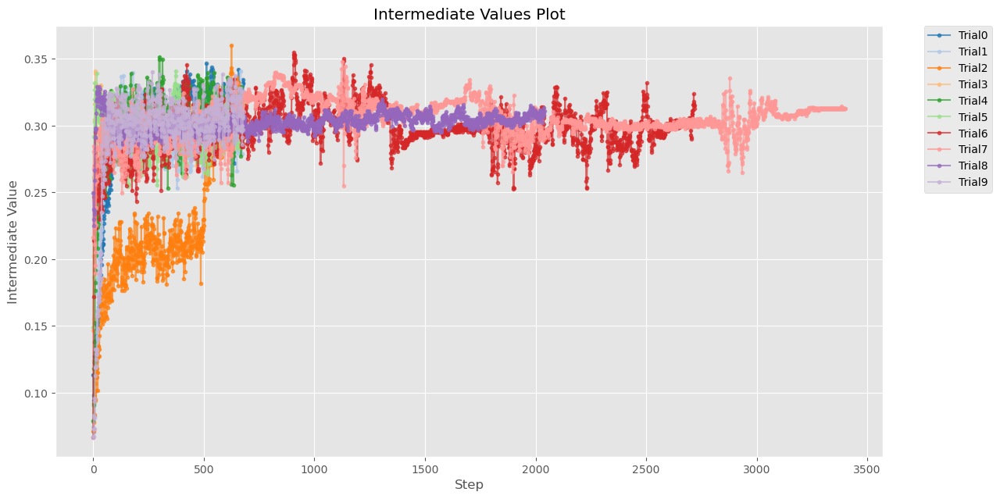

In [33]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_1565098/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


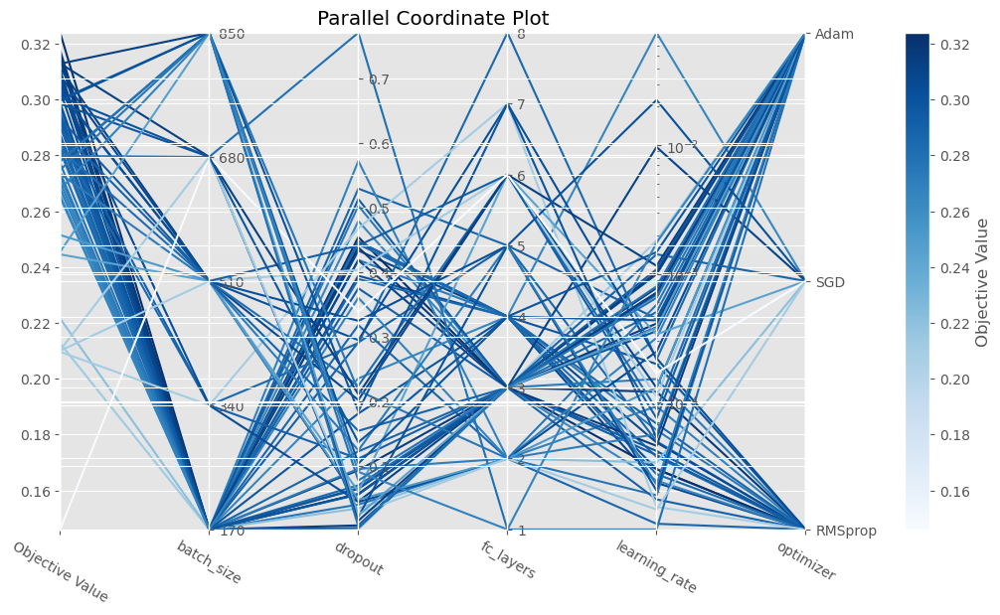

In [34]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_1565098/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-06 02:46:59,088] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


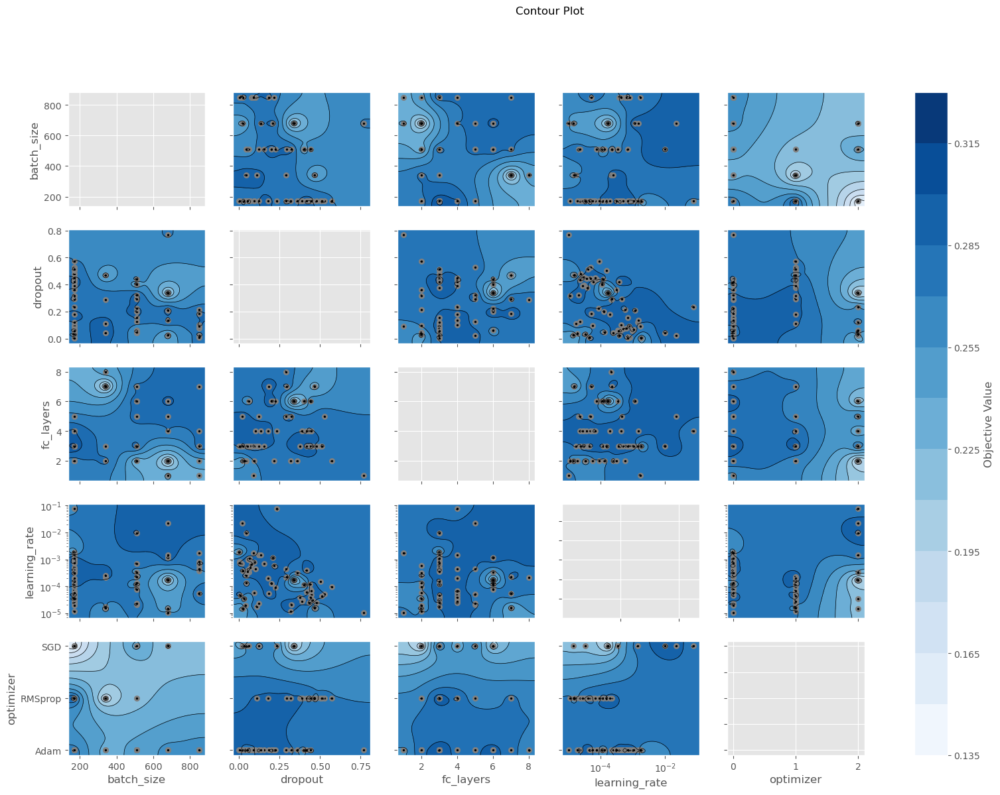

In [35]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_1565098/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

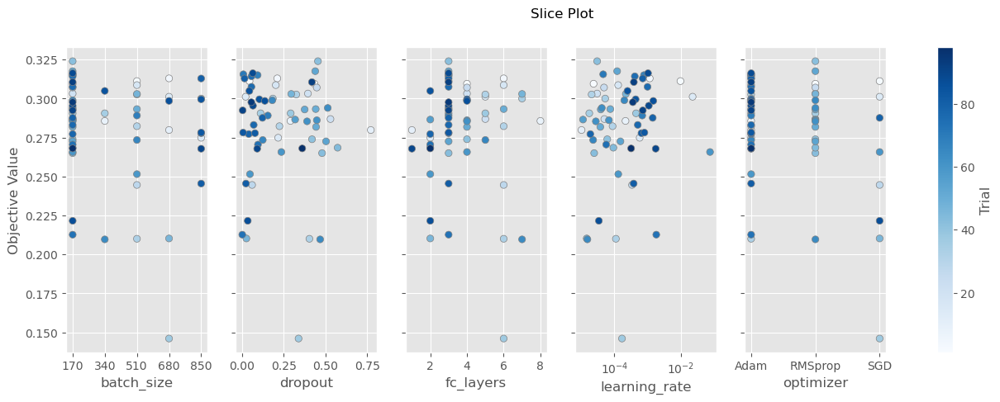

In [36]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_1565098/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

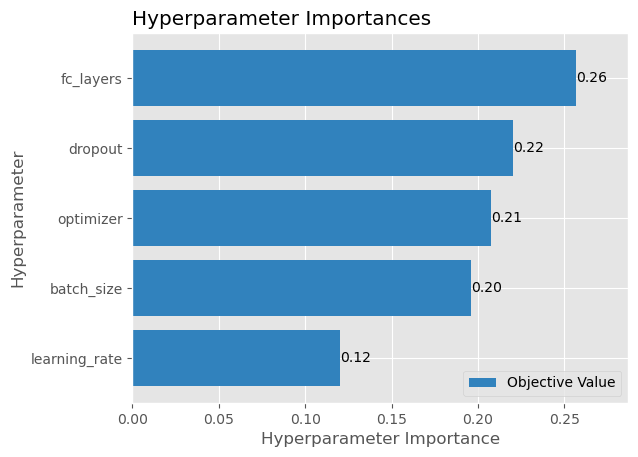

In [37]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_1565098/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

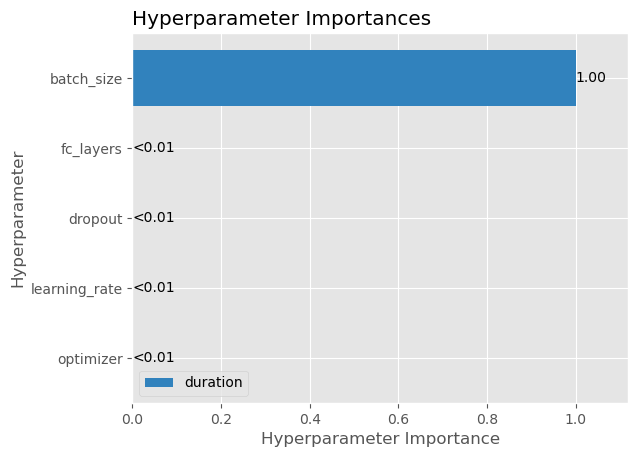

In [38]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_1565098/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

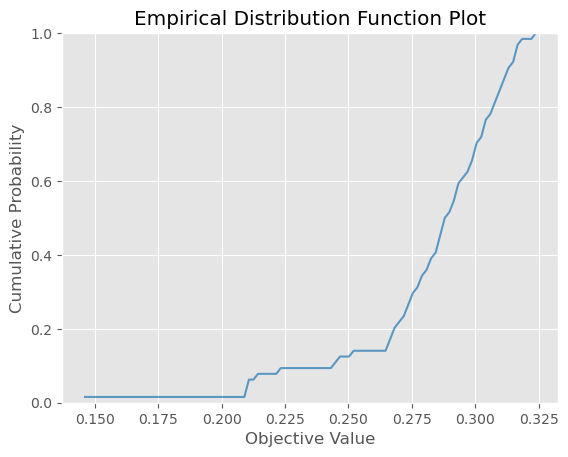

In [39]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_1565098/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-06 02:47:05,980] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


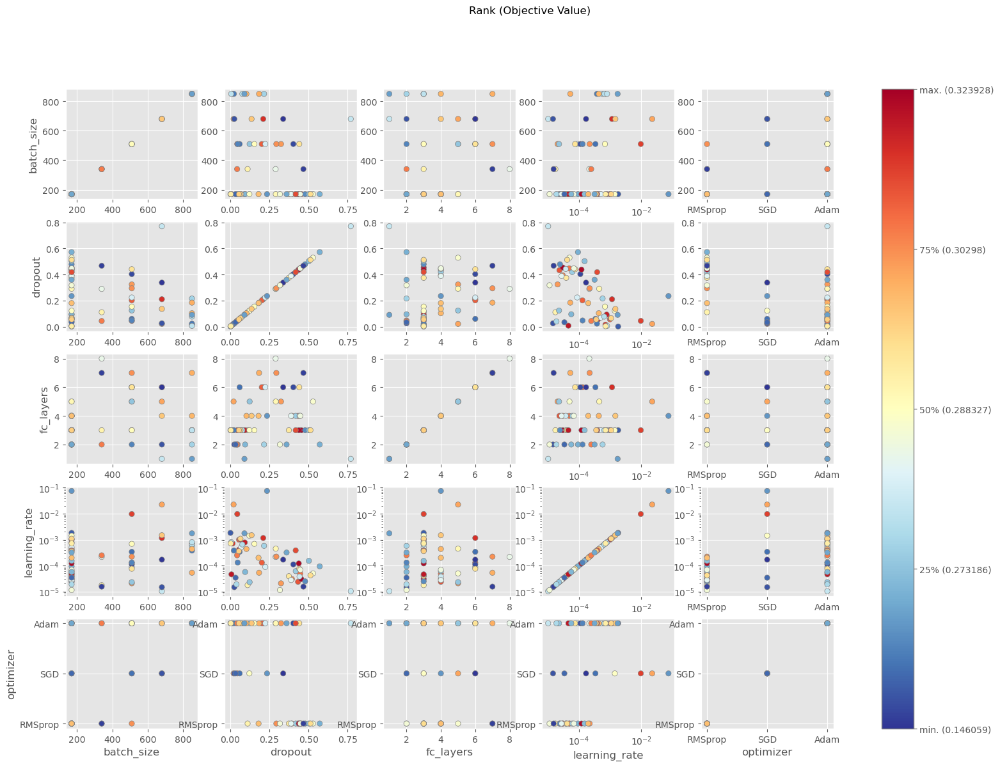

In [40]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_1565098/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


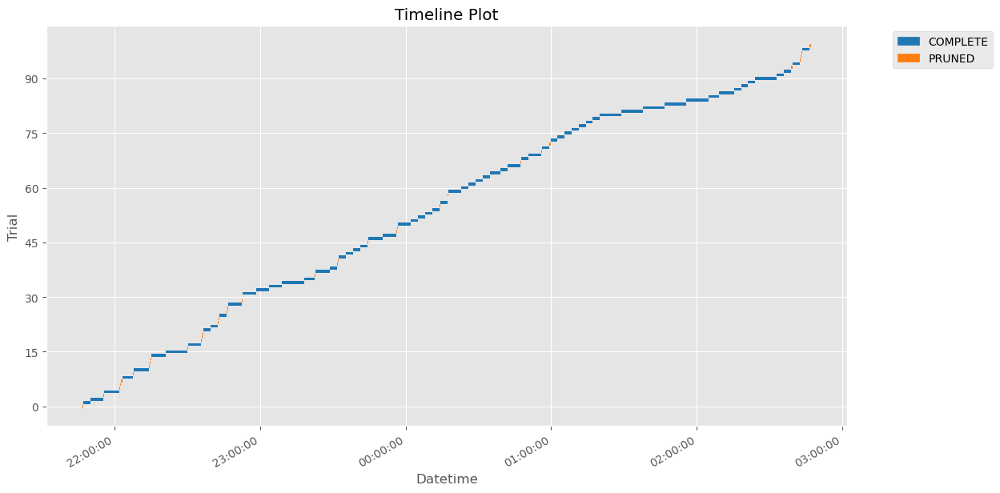

In [41]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

# 2. EO feature set

In [42]:
from sklearn.model_selection import StratifiedGroupKFold

baseline_rest_idxs = data_split_indices['EO'][0]
baseline_val_idxs = data_split_indices['EO'][1]

# first splitting validation data using the first split from the baseline RF model
groups = [elem for elem in subjects_eo_ids for i in range(12)] # times 12 for each epoch

print(f'{len(eo_graph_dataset) = }')
print(f'{len(baseline_rest_idxs) = }, {len(baseline_val_idxs) = }, total: {len(baseline_rest_idxs)+len(baseline_val_idxs)}')

X_traintest = [eo_graph_dataset[i] for i in baseline_rest_idxs] 
X_val = [eo_graph_dataset[i] for i in baseline_val_idxs]
Y_traintest =[eo_y_list[i] for i in baseline_rest_idxs]
Y_val = [eo_y_list[i] for i in baseline_val_idxs]
groups_traintest = [groups[i] for i in baseline_rest_idxs]
groups_val = [groups[i] for i in baseline_val_idxs]

# now splitting the test and training data with seperate StratifiedGroupKFold
desired_test_ratio = 0.20
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)  # should shuffle be true?

train_idxs, test_idxs = sgkf.split(X_traintest, Y_traintest, groups_traintest).__next__() # just take the first split
print(f'{len(X_traintest) = }, {len(X_val) = }')
print(f'{len(train_idxs) = }, {len(test_idxs) = }, total: {len(train_idxs)+len(test_idxs)}')

X_train = [X_traintest[i] for i in train_idxs] # X also includes y values, because they are stored in the Data object
X_test = [X_traintest[i] for i in test_idxs]
Y_train =[Y_traintest[i] for i in train_idxs]
Y_test = [Y_traintest[i] for i in test_idxs]

len(eo_graph_dataset) = 2700
len(baseline_rest_idxs) = 2160, len(baseline_val_idxs) = 540, total: 2700
len(X_traintest) = 2160, len(X_val) = 540
len(train_idxs) = 1716, len(test_idxs) = 444, total: 2160


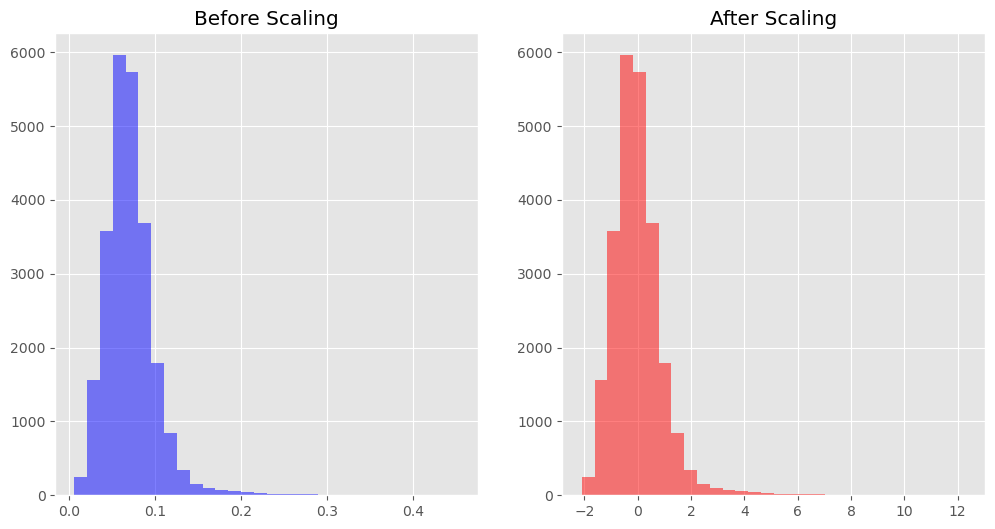

In [43]:
# standardize statistical node features
from sklearn.preprocessing import StandardScaler

# Concatenate all x values before scaling for the first feature, as a sanity check for standardization
x_before = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

scaler = StandardScaler()
scaler.fit(np.vstack([data.x.numpy() for data in X_train + X_val])) # fit on training and validation data


# Transform the x values of the data in X_train
for data in X_train:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_val
for data in X_val:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_test
for data in X_test:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Concatenate all x values after scaling for the first feature, as a sanity check for standardization
x_after = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

# Plot the distribution of the first x feature before and after scaling as a sanity check
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(x_before, bins=30, color='b', alpha=0.5)
plt.title('Before Scaling')

plt.subplot(1, 2, 2)
plt.hist(x_after, bins=30, color='r', alpha=0.5)
plt.title('After Scaling')

plt.show()

### Model: graphLambda without edge_attr

In [44]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create the model
    model = graphLambda_wo_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('eo_results_wo_edge_attrs_trials.pkl')

[I 2024-06-06 02:47:09,949] A new study created in memory with name: no-name-f5d5f9df-9a3d-447f-ae5b-e4935542ca07
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.008098788443236343, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 1, 'dropout': 0.09792541685472891}


[I 2024-06-06 02:54:17,504] Trial 0 finished with value: 0.283466100692749 and parameters: {'learning_rate': 0.008098788443236343, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 1, 'dropout': 0.09792541685472891}. Best is trial 0 with value: 0.283466100692749.


Tested parameters: {'learning_rate': 0.00044195272222606786, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.7778122559491414}


[I 2024-06-06 02:54:29,889] Trial 1 pruned. Trial was pruned at epoch 100.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.00042531400530104177, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.565631513873961}


[I 2024-06-06 02:58:11,224] Trial 2 finished with value: 0.3090575337409973 and parameters: {'learning_rate': 0.00042531400530104177, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.565631513873961}. Best is trial 2 with value: 0.3090575337409973.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (3) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.0019899896090132306, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.11189980521877115}


[I 2024-06-06 03:02:40,276] Trial 3 finished with value: 0.2919035851955414 and parameters: {'learning_rate': 0.0019899896090132306, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.11189980521877115}. Best is trial 2 with value: 0.3090575337409973.


Tested parameters: {'learning_rate': 0.008937868199299146, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.2895422167601333}


[I 2024-06-06 03:09:55,554] Trial 4 finished with value: 0.3040497899055481 and parameters: {'learning_rate': 0.008937868199299146, 'optimizer': 'SGD', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.2895422167601333}. Best is trial 2 with value: 0.3090575337409973.


Tested parameters: {'learning_rate': 0.020011859156462874, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.10432957934699197}


[I 2024-06-06 03:10:07,520] Trial 5 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.020079851960252602, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.10848885520955553}


[I 2024-06-06 03:13:52,659] Trial 6 finished with value: 0.3093595504760742 and parameters: {'learning_rate': 0.020079851960252602, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.10848885520955553}. Best is trial 6 with value: 0.3093595504760742.


Tested parameters: {'learning_rate': 0.004836419844493489, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.7000390735246942}


[I 2024-06-06 03:14:09,156] Trial 7 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.03441178353500515, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.7718278799878915}


[I 2024-06-06 03:14:22,584] Trial 8 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00011226018614298477, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 1, 'dropout': 0.0978024793983944}


[I 2024-06-06 03:21:44,572] Trial 9 finished with value: 0.2867392301559448 and parameters: {'learning_rate': 0.00011226018614298477, 'optimizer': 'RMSprop', 'batch_size': 850, 'fc_layers': 1, 'dropout': 0.0978024793983944}. Best is trial 6 with value: 0.3093595504760742.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (10) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 1.6209847694654204e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.3608302280301161}


[I 2024-06-06 03:24:31,676] Trial 10 finished with value: 0.31680864095687866 and parameters: {'learning_rate': 1.6209847694654204e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.3608302280301161}. Best is trial 10 with value: 0.31680864095687866.


Tested parameters: {'learning_rate': 1.203033098119141e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.35576334852090397}


[I 2024-06-06 03:27:22,515] Trial 11 finished with value: 0.324316143989563 and parameters: {'learning_rate': 1.203033098119141e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.35576334852090397}. Best is trial 11 with value: 0.324316143989563.


Tested parameters: {'learning_rate': 1.1469437235785494e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.36964325280901095}


[I 2024-06-06 03:30:13,304] Trial 12 finished with value: 0.28024154901504517 and parameters: {'learning_rate': 1.1469437235785494e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.36964325280901095}. Best is trial 11 with value: 0.324316143989563.


Tested parameters: {'learning_rate': 1.047285879328556e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.47811143788322996}


[I 2024-06-06 03:30:38,106] Trial 13 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 4.0271039775936594e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.2593077038125394}


[I 2024-06-06 03:33:26,427] Trial 14 finished with value: 0.28648364543914795 and parameters: {'learning_rate': 4.0271039775936594e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.2593077038125394}. Best is trial 11 with value: 0.324316143989563.


Tested parameters: {'learning_rate': 5.172925869393744e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.47665827269550454}


[I 2024-06-06 03:36:08,140] Trial 15 finished with value: 0.30804264545440674 and parameters: {'learning_rate': 5.172925869393744e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.47665827269550454}. Best is trial 11 with value: 0.324316143989563.


Tested parameters: {'learning_rate': 0.00014271810408233407, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.2508737238547978}


[I 2024-06-06 03:38:50,162] Trial 16 finished with value: 0.30349811911582947 and parameters: {'learning_rate': 0.00014271810408233407, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.2508737238547978}. Best is trial 11 with value: 0.324316143989563.


Tested parameters: {'learning_rate': 3.871835849887056e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.3724211712245923}


[I 2024-06-06 03:44:02,245] Trial 17 finished with value: 0.3181089162826538 and parameters: {'learning_rate': 3.871835849887056e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.3724211712245923}. Best is trial 11 with value: 0.324316143989563.


Tested parameters: {'learning_rate': 5.8594877619774476e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.5975521718297854}


[I 2024-06-06 03:44:14,087] Trial 18 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00023791186561370516, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.45533558069685953}


[I 2024-06-06 03:49:27,009] Trial 19 finished with value: 0.30888837575912476 and parameters: {'learning_rate': 0.00023791186561370516, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.45533558069685953}. Best is trial 11 with value: 0.324316143989563.


Tested parameters: {'learning_rate': 0.08607575422116162, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.22621548341281333}


[I 2024-06-06 03:49:38,266] Trial 20 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.800043095932808e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.3650036351497259}


[I 2024-06-06 03:52:27,285] Trial 21 finished with value: 0.18484438955783844 and parameters: {'learning_rate': 1.800043095932808e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.3650036351497259}. Best is trial 11 with value: 0.324316143989563.


Tested parameters: {'learning_rate': 2.6529272152456224e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.33618908362606753}


[I 2024-06-06 03:55:11,117] Trial 22 finished with value: 0.3381550908088684 and parameters: {'learning_rate': 2.6529272152456224e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.33618908362606753}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 2.3961542812803644e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.1793320886776395}


[I 2024-06-06 04:00:34,387] Trial 23 finished with value: 0.31261253356933594 and parameters: {'learning_rate': 2.3961542812803644e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.1793320886776395}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 3.352029302639593e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.3078540401357481}


[I 2024-06-06 04:03:18,355] Trial 24 finished with value: 0.2963150143623352 and parameters: {'learning_rate': 3.352029302639593e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.3078540401357481}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 7.960404318579747e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.4270747775123018}


[I 2024-06-06 04:08:00,506] Trial 25 finished with value: 0.29830455780029297 and parameters: {'learning_rate': 7.960404318579747e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.4270747775123018}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 0.0011859007124038002, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.5591153767497699}


[I 2024-06-06 04:08:12,052] Trial 26 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0001972112417290438, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.014597495500542457}


[I 2024-06-06 04:10:53,108] Trial 27 finished with value: 0.2978866696357727 and parameters: {'learning_rate': 0.0001972112417290438, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.014597495500542457}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 2.7374990465080378e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.3244143171194185}


[I 2024-06-06 04:13:36,830] Trial 28 finished with value: 0.2930542230606079 and parameters: {'learning_rate': 2.7374990465080378e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.3244143171194185}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 8.312271871046814e-05, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.18836331082326715}


[I 2024-06-06 04:18:45,421] Trial 29 finished with value: 0.20609554648399353 and parameters: {'learning_rate': 8.312271871046814e-05, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.18836331082326715}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 0.0004246170799556677, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.5175581901726416}


[I 2024-06-06 04:19:05,370] Trial 30 pruned. Trial was pruned at epoch 144.


Tested parameters: {'learning_rate': 1.597951948087574e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.38948081526326966}


[I 2024-06-06 04:21:57,165] Trial 31 finished with value: 0.28609344363212585 and parameters: {'learning_rate': 1.597951948087574e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.38948081526326966}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 1.0385181015457907e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.34748327551419805}


[I 2024-06-06 04:24:44,476] Trial 32 finished with value: 0.2503816485404968 and parameters: {'learning_rate': 1.0385181015457907e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.34748327551419805}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 2.343288594329261e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.4065261348640439}


[I 2024-06-06 04:27:29,006] Trial 33 finished with value: 0.2659403681755066 and parameters: {'learning_rate': 2.343288594329261e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.4065261348640439}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 3.7416580560472406e-05, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.2979902380489057}


[I 2024-06-06 04:34:46,671] Trial 34 finished with value: 0.31645122170448303 and parameters: {'learning_rate': 3.7416580560472406e-05, 'optimizer': 'RMSprop', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.2979902380489057}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 1.7541711406682204e-05, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.435203213389626}


[I 2024-06-06 04:35:03,519] Trial 35 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 6.715054461364966e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.21103970995285143}


[I 2024-06-06 04:37:52,443] Trial 36 finished with value: 0.3234853744506836 and parameters: {'learning_rate': 6.715054461364966e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.21103970995285143}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 0.00030646658502041165, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.1699420205633893}


[I 2024-06-06 04:45:20,292] Trial 37 finished with value: 0.2911900579929352 and parameters: {'learning_rate': 0.00030646658502041165, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.1699420205633893}. Best is trial 22 with value: 0.3381550908088684.


Tested parameters: {'learning_rate': 0.0005977957707066141, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.2635759552408349}


[I 2024-06-06 04:49:07,178] Trial 38 finished with value: 0.3532131612300873 and parameters: {'learning_rate': 0.0005977957707066141, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.2635759552408349}. Best is trial 38 with value: 0.3532131612300873.


Tested parameters: {'learning_rate': 0.0014446964871514696, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.21272960797594084}


[I 2024-06-06 04:52:56,341] Trial 39 finished with value: 0.3492784798145294 and parameters: {'learning_rate': 0.0014446964871514696, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.21272960797594084}. Best is trial 38 with value: 0.3532131612300873.


Tested parameters: {'learning_rate': 0.00310103187251293, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.141592373644436}


[I 2024-06-06 04:53:14,042] Trial 40 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0008337086033895212, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.24497703342395524}


[I 2024-06-06 04:57:05,993] Trial 41 finished with value: 0.3370017111301422 and parameters: {'learning_rate': 0.0008337086033895212, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.24497703342395524}. Best is trial 38 with value: 0.3532131612300873.


Tested parameters: {'learning_rate': 0.0008231986313770565, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.26690534535666743}


[I 2024-06-06 05:00:48,858] Trial 42 finished with value: 0.35759150981903076 and parameters: {'learning_rate': 0.0008231986313770565, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.26690534535666743}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0008009499541718947, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.2658578095746956}


[I 2024-06-06 05:04:34,783] Trial 43 finished with value: 0.33499330282211304 and parameters: {'learning_rate': 0.0008009499541718947, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.2658578095746956}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0008470837266193396, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.07282694520503391}


[I 2024-06-06 05:08:20,133] Trial 44 finished with value: 0.3126989006996155 and parameters: {'learning_rate': 0.0008470837266193396, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.07282694520503391}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.001458581253078451, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.23533595116336203}


[I 2024-06-06 05:12:05,499] Trial 45 finished with value: 0.16193723678588867 and parameters: {'learning_rate': 0.001458581253078451, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.23533595116336203}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.005701288245738631, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.14120976173932862}


[I 2024-06-06 05:12:22,212] Trial 46 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0027273283836318444, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.2727934671594316}


[I 2024-06-06 05:12:38,735] Trial 47 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0005599194426938704, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.32163218458831}


[I 2024-06-06 05:16:23,706] Trial 48 finished with value: 0.32355618476867676 and parameters: {'learning_rate': 0.0005599194426938704, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.32163218458831}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0019045026539312923, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.2055430755868758}


[I 2024-06-06 05:20:08,651] Trial 49 finished with value: 0.3527183532714844 and parameters: {'learning_rate': 0.0019045026539312923, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.2055430755868758}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.008879942669763668, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.20339913592941866}


[I 2024-06-06 05:20:24,649] Trial 50 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0019457181346022943, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.28457605380063083}


[I 2024-06-06 05:21:02,231] Trial 51 pruned. Trial was pruned at epoch 222.


Tested parameters: {'learning_rate': 0.0005627869075971041, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.14725850972007892}


[I 2024-06-06 05:24:49,093] Trial 52 finished with value: 0.3168293833732605 and parameters: {'learning_rate': 0.0005627869075971041, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.14725850972007892}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.00420246023649599, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.24383226949859382}


[I 2024-06-06 05:25:05,259] Trial 53 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0015925378230545882, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.05810601492967232}


[I 2024-06-06 05:28:55,463] Trial 54 finished with value: 0.3326702415943146 and parameters: {'learning_rate': 0.0015925378230545882, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.05810601492967232}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0010741190052783647, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.3308374634171511}


[I 2024-06-06 05:32:42,452] Trial 55 finished with value: 0.33003365993499756 and parameters: {'learning_rate': 0.0010741190052783647, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.3308374634171511}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.018255666641569978, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.2210022899585299}


[I 2024-06-06 05:32:58,500] Trial 56 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0006446656978246421, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.29363856798947047}


[I 2024-06-06 05:36:41,014] Trial 57 finished with value: 0.33595746755599976 and parameters: {'learning_rate': 0.0006446656978246421, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.29363856798947047}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.002897469426592337, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.15339024672224924}


[I 2024-06-06 05:36:54,111] Trial 58 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0004487543662309099, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.11051018030473175}


[I 2024-06-06 05:40:39,639] Trial 59 finished with value: 0.32050755620002747 and parameters: {'learning_rate': 0.0004487543662309099, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.11051018030473175}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0003387987854598116, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.2535343928552628}


[I 2024-06-06 05:47:50,693] Trial 60 finished with value: 0.30512535572052 and parameters: {'learning_rate': 0.0003387987854598116, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.2535343928552628}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0006310903593265651, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.19475196050005333}


[I 2024-06-06 05:51:36,222] Trial 61 finished with value: 0.2932248115539551 and parameters: {'learning_rate': 0.0006310903593265651, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.19475196050005333}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.002157114012671619, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.2983709501053632}


[I 2024-06-06 05:55:18,162] Trial 62 finished with value: 0.2914366126060486 and parameters: {'learning_rate': 0.002157114012671619, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.2983709501053632}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.00013178470726929727, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.27530736484165264}


[I 2024-06-06 05:58:58,511] Trial 63 finished with value: 0.2551463842391968 and parameters: {'learning_rate': 0.00013178470726929727, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.27530736484165264}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0012791405736457572, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.3487197761202756}


[I 2024-06-06 06:02:45,149] Trial 64 finished with value: 0.33533746004104614 and parameters: {'learning_rate': 0.0012791405736457572, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.3487197761202756}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.00021014872615229062, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 1, 'dropout': 0.7243290621204251}


[I 2024-06-06 06:06:25,333] Trial 65 finished with value: 0.2526963949203491 and parameters: {'learning_rate': 0.00021014872615229062, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 1, 'dropout': 0.7243290621204251}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0008054894145059347, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.23844693242913964}


[I 2024-06-06 06:10:17,487] Trial 66 finished with value: 0.3523111939430237 and parameters: {'learning_rate': 0.0008054894145059347, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.23844693242913964}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0009075342368852265, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.2239784905630811}


[I 2024-06-06 06:14:54,687] Trial 67 finished with value: 0.3345528244972229 and parameters: {'learning_rate': 0.0009075342368852265, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.2239784905630811}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0018908810850111766, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.2498384709671736}


[I 2024-06-06 06:18:44,238] Trial 68 finished with value: 0.3469517230987549 and parameters: {'learning_rate': 0.0018908810850111766, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.2498384709671736}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.006493660767407762, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.17100857442836792}


[I 2024-06-06 06:19:00,607] Trial 69 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.012831340399930223, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.3857724962134394}


[I 2024-06-06 06:19:13,812] Trial 70 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0018949584995209153, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.25854419633565506}


[I 2024-06-06 06:19:31,407] Trial 71 pruned. Trial was pruned at epoch 108.


Tested parameters: {'learning_rate': 0.004336444626250307, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.23595165100909543}


[I 2024-06-06 06:19:48,199] Trial 72 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0010969788479496827, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.1947975921170016}


[I 2024-06-06 06:23:37,547] Trial 73 finished with value: 0.32237157225608826 and parameters: {'learning_rate': 0.0010969788479496827, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.1947975921170016}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.002359370595678683, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.3140019303638299}


[I 2024-06-06 06:27:24,060] Trial 74 finished with value: 0.3548395335674286 and parameters: {'learning_rate': 0.002359370595678683, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.3140019303638299}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0023809871683426434, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.32069862124695736}


[I 2024-06-06 06:27:41,557] Trial 75 pruned. Trial was pruned at epoch 101.


Tested parameters: {'learning_rate': 0.0033871126194314253, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.3083263146007538}


[I 2024-06-06 06:27:58,840] Trial 76 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0016237469086779193, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.34113856335198967}


[I 2024-06-06 06:31:51,046] Trial 77 finished with value: 0.31701457500457764 and parameters: {'learning_rate': 0.0016237469086779193, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.34113856335198967}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.003740481843436283, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.3719171354400968}


[I 2024-06-06 06:32:04,538] Trial 78 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.043606327406350016, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.412136718603372}


[I 2024-06-06 06:32:16,595] Trial 79 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0003110720745437542, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.21059247251763558}


[I 2024-06-06 06:35:08,452] Trial 80 finished with value: 0.21096937358379364 and parameters: {'learning_rate': 0.0003110720745437542, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 8, 'dropout': 0.21059247251763558}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0008624757026495923, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.27549720076175177}


[I 2024-06-06 06:38:57,936] Trial 81 finished with value: 0.32532548904418945 and parameters: {'learning_rate': 0.0008624757026495923, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.27549720076175177}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0013707024204260665, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.24751906360434}


[I 2024-06-06 06:42:45,561] Trial 82 finished with value: 0.3438645601272583 and parameters: {'learning_rate': 0.0013707024204260665, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.24751906360434}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0024533648236438202, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.16753500099078744}


[I 2024-06-06 06:46:31,202] Trial 83 finished with value: 0.3518153429031372 and parameters: {'learning_rate': 0.0024533648236438202, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.16753500099078744}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.0013567424518010393, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.17573113994262932}


[I 2024-06-06 06:50:17,218] Trial 84 finished with value: 0.33135467767715454 and parameters: {'learning_rate': 0.0013567424518010393, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.17573113994262932}. Best is trial 42 with value: 0.35759150981903076.


Tested parameters: {'learning_rate': 0.002633687656283834, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.13117330006344421}


[I 2024-06-06 06:54:07,010] Trial 85 finished with value: 0.3625061511993408 and parameters: {'learning_rate': 0.002633687656283834, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.13117330006344421}. Best is trial 85 with value: 0.3625061511993408.


Tested parameters: {'learning_rate': 0.005727126700387615, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.09231262939720714}


[I 2024-06-06 06:54:23,803] Trial 86 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0017082048114421967, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.11785117199599979}


[I 2024-06-06 06:58:11,765] Trial 87 finished with value: 0.32539165019989014 and parameters: {'learning_rate': 0.0017082048114421967, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.11785117199599979}. Best is trial 85 with value: 0.3625061511993408.


Tested parameters: {'learning_rate': 0.002596080744291752, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.1600597200903181}


[I 2024-06-06 06:58:28,490] Trial 88 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0022229669676474433, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.12613818137576005}


[I 2024-06-06 07:02:16,967] Trial 89 finished with value: 0.3478458523750305 and parameters: {'learning_rate': 0.0022229669676474433, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.12613818137576005}. Best is trial 85 with value: 0.3625061511993408.


Tested parameters: {'learning_rate': 0.0004085493481029607, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.12449332581992227}


[I 2024-06-06 07:05:59,088] Trial 90 finished with value: 0.3259115517139435 and parameters: {'learning_rate': 0.0004085493481029607, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.12449332581992227}. Best is trial 85 with value: 0.3625061511993408.


Tested parameters: {'learning_rate': 0.00223826371926028, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.08143525467208154}


[I 2024-06-06 07:09:51,016] Trial 91 finished with value: 0.34016627073287964 and parameters: {'learning_rate': 0.00223826371926028, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.08143525467208154}. Best is trial 85 with value: 0.3625061511993408.


Tested parameters: {'learning_rate': 0.0006923064609402009, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.1321055391612762}


[I 2024-06-06 07:13:40,451] Trial 92 finished with value: 0.32793840765953064 and parameters: {'learning_rate': 0.0006923064609402009, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.1321055391612762}. Best is trial 85 with value: 0.3625061511993408.


Tested parameters: {'learning_rate': 0.0010563375874612956, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.05403016904998194}


[I 2024-06-06 07:17:32,115] Trial 93 finished with value: 0.3150903582572937 and parameters: {'learning_rate': 0.0010563375874612956, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.05403016904998194}. Best is trial 85 with value: 0.3625061511993408.


Tested parameters: {'learning_rate': 0.003519261577659688, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.016732205821828938}


[I 2024-06-06 07:17:48,623] Trial 94 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0018943825758304265, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.18992808827493246}


[I 2024-06-06 07:21:35,751] Trial 95 finished with value: 0.35872018337249756 and parameters: {'learning_rate': 0.0018943825758304265, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.18992808827493246}. Best is trial 85 with value: 0.3625061511993408.


Tested parameters: {'learning_rate': 0.0053194405807603, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.2195047488858867}


[I 2024-06-06 07:21:52,323] Trial 96 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00298775563381728, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.18448939044353335}


[I 2024-06-06 07:29:17,317] Trial 97 finished with value: 0.35413283109664917 and parameters: {'learning_rate': 0.00298775563381728, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.18448939044353335}. Best is trial 85 with value: 0.3625061511993408.


Tested parameters: {'learning_rate': 0.007849790190966297, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.18546202451682997}


[I 2024-06-06 07:29:30,714] Trial 98 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0030446926634601517, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.2091110060955955}


[I 2024-06-06 07:34:50,756] Trial 99 finished with value: 0.20182719826698303 and parameters: {'learning_rate': 0.0030446926634601517, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.2091110060955955}. Best is trial 85 with value: 0.3625061511993408.


Best trial:
  Value: 0.3625061511993408
  Params: 
    learning_rate: 0.002633687656283834
    optimizer: Adam
    batch_size: 340
    fc_layers: 6
    dropout: 0.13117330006344421


In [45]:
df_trials = pd.read_pickle('eo_results_wo_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
85,85,0.362506,2024-06-06 06:50:17.219571,2024-06-06 06:54:07.008220,0 days 00:03:49.788649,340,0.131173,6,0.002634,Adam,COMPLETE
95,95,0.358720,2024-06-06 07:17:48.624777,2024-06-06 07:21:35.749730,0 days 00:03:47.124953,340,0.189928,7,0.001894,Adam,COMPLETE
42,42,0.357592,2024-06-06 04:57:05.995083,2024-06-06 05:00:48.857044,0 days 00:03:42.861961,340,0.266905,4,0.000823,Adam,COMPLETE
74,74,0.354840,2024-06-06 06:23:37.548054,2024-06-06 06:27:24.058410,0 days 00:03:46.510356,340,0.314002,6,0.002359,Adam,COMPLETE
97,97,0.354133,2024-06-06 07:21:52.324447,2024-06-06 07:29:17.314043,0 days 00:07:24.989596,850,0.184489,7,0.002988,Adam,COMPLETE
38,38,0.353213,2024-06-06 04:45:20.293540,2024-06-06 04:49:07.176732,0 days 00:03:46.883192,340,0.263576,6,0.000598,Adam,COMPLETE
49,49,0.352718,2024-06-06 05:16:23.708411,2024-06-06 05:20:08.649542,0 days 00:03:44.941131,340,0.205543,6,0.001905,Adam,COMPLETE
66,66,0.352311,2024-06-06 06:06:25.334581,2024-06-06 06:10:17.485649,0 days 00:03:52.151068,340,0.238447,7,0.000805,Adam,COMPLETE
83,83,0.351815,2024-06-06 06:42:45.562551,2024-06-06 06:46:31.200487,0 days 00:03:45.637936,340,0.167535,7,0.002453,Adam,COMPLETE
39,39,0.349278,2024-06-06 04:49:07.179440,2024-06-06 04:52:56.339251,0 days 00:03:49.159811,340,0.212730,5,0.001445,Adam,COMPLETE


#### Visualizations

/tmp/ipykernel_1565098/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

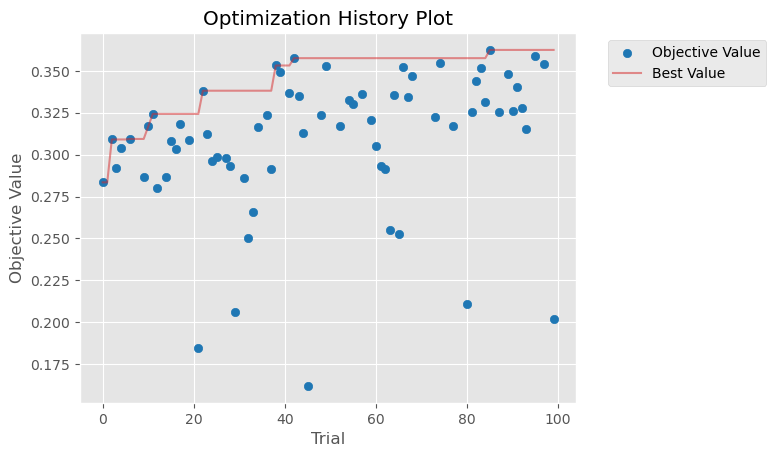

In [46]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-06 07:34:51,125] A new study created in memory with name: no-name-321db4ca-95a9-4980-a1cc-53b7cd787176
/tmp/ipykernel_1565098/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


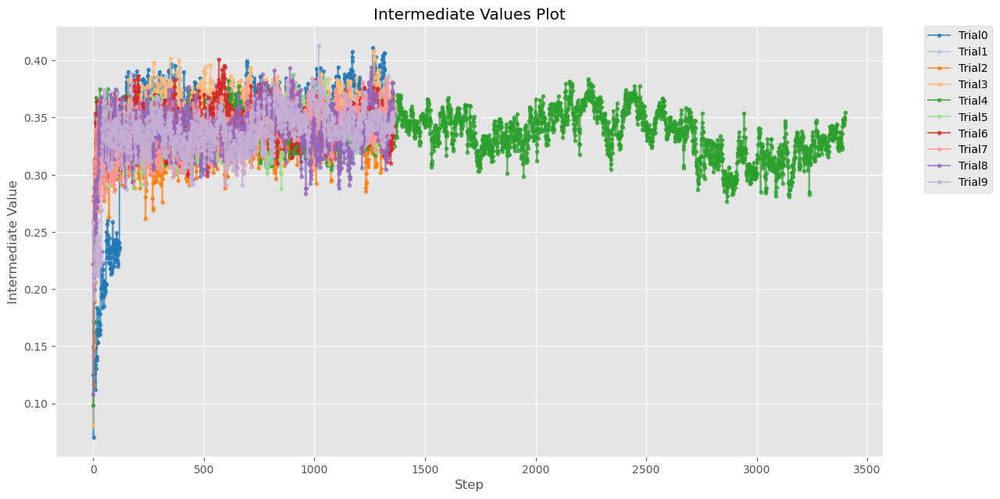

In [47]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_1565098/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


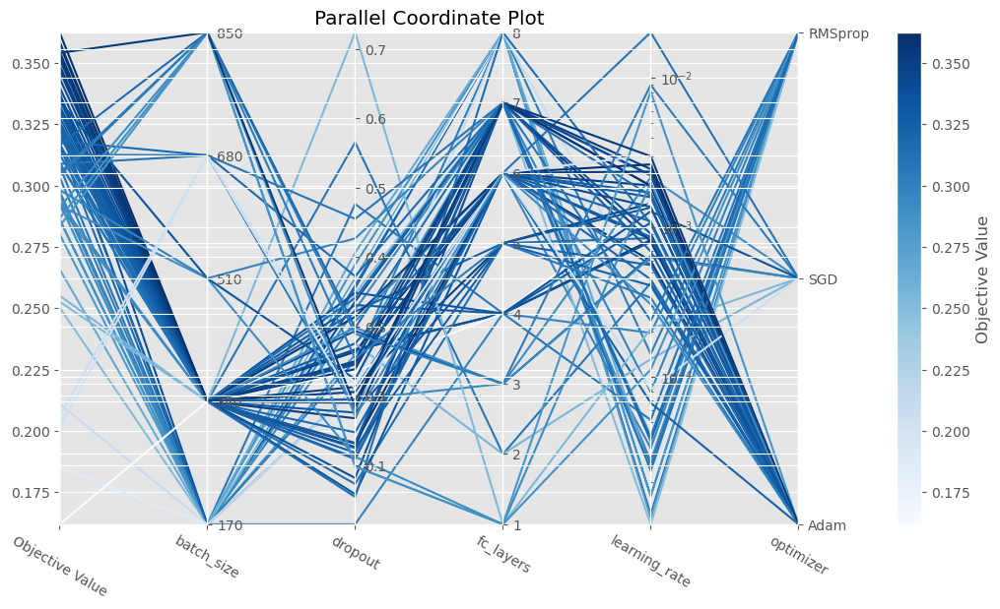

In [48]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_1565098/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-06 07:34:52,631] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


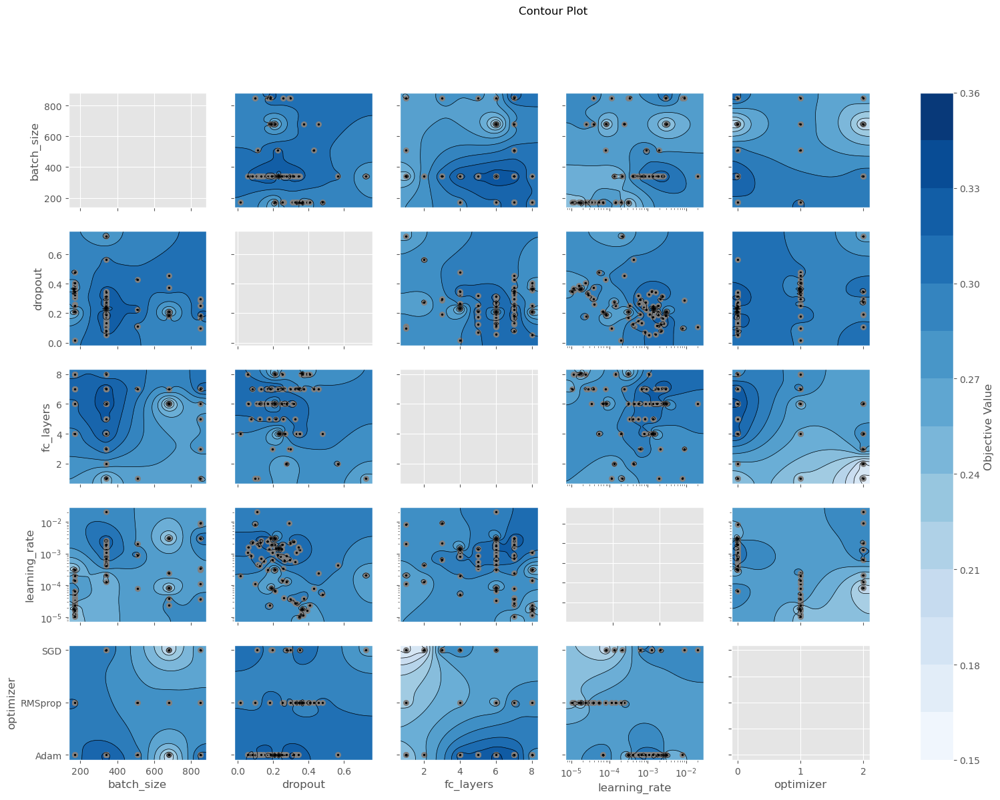

In [49]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_1565098/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

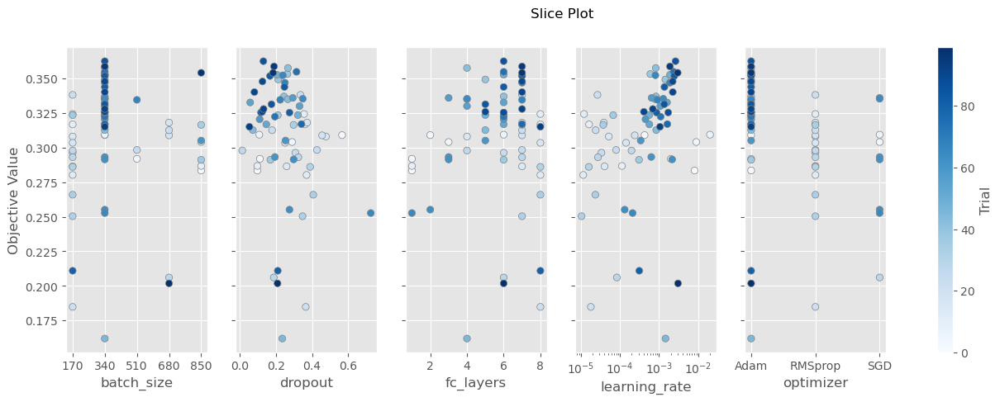

In [50]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_1565098/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

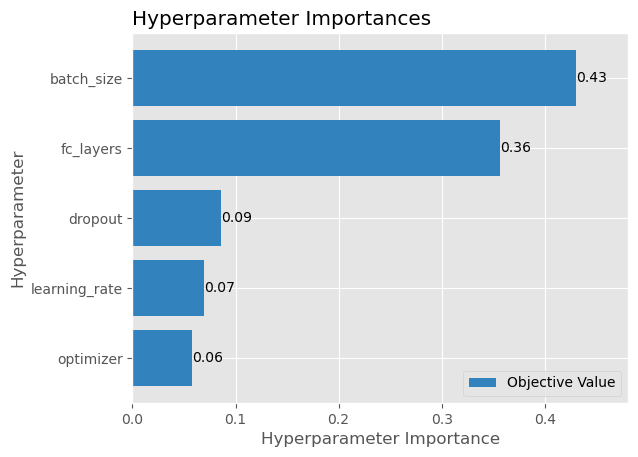

In [51]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_1565098/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

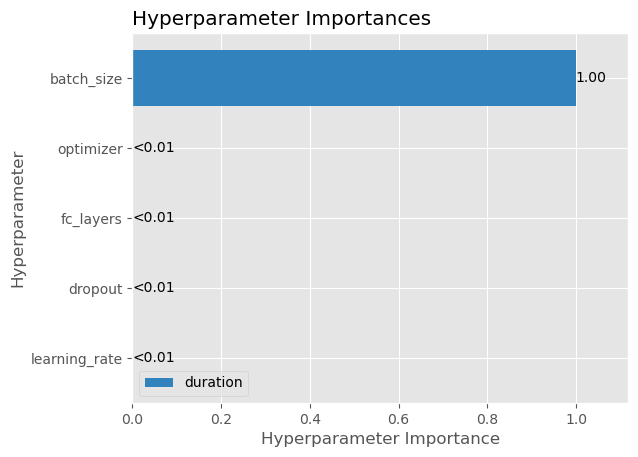

In [52]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_1565098/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

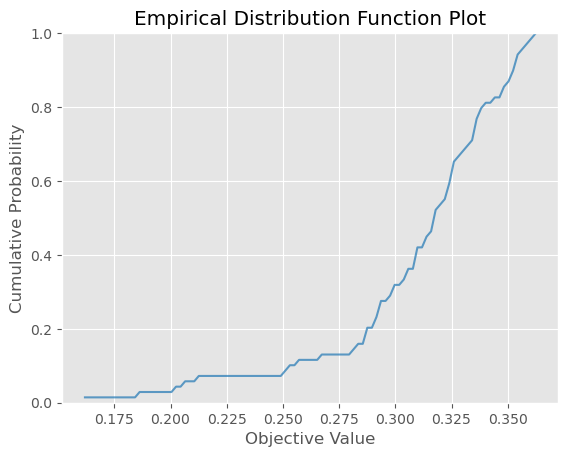

In [53]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_1565098/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-06 07:35:00,227] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


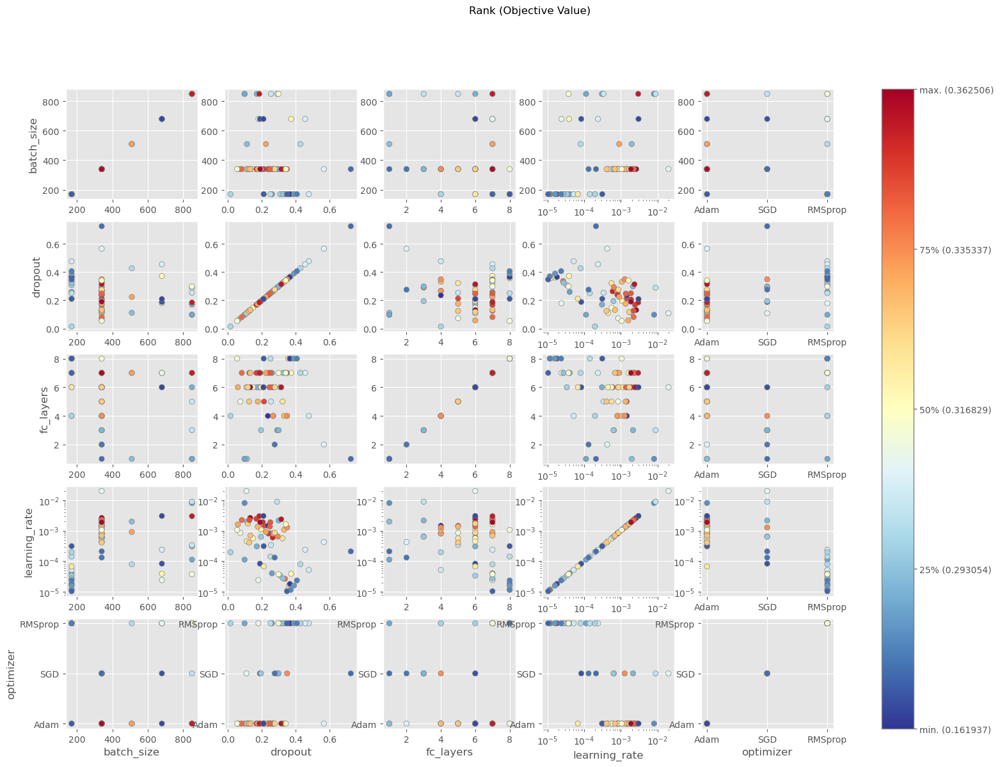

In [54]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_1565098/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


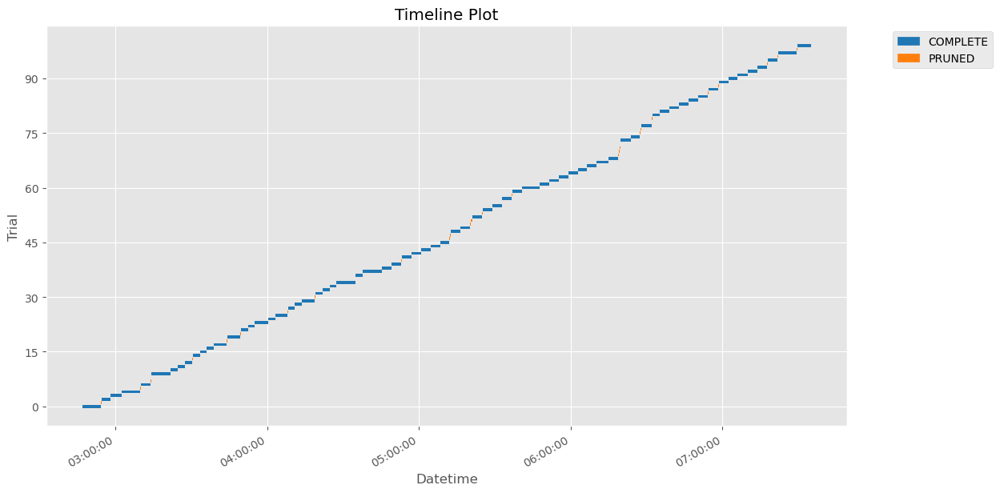

In [55]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda with edge_attr

In [56]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create the model
    model = graphLambda_w_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('eo_results_w_edge_attrs_trials.pkl')

[I 2024-06-06 07:35:03,723] A new study created in memory with name: no-name-56df062b-3599-4213-b17c-8f652264b26a
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 4.44022005830393e-05, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.7093273917325219}


[I 2024-06-06 07:36:02,126] Trial 0 pruned. Trial was pruned at epoch 421.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (3) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.002303250632963314, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.05980893990111422}


[I 2024-06-06 07:36:18,640] Trial 1 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.000797212880823841, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.7180909817179995}


[I 2024-06-06 07:36:34,187] Trial 2 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.02168428866507992, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 8, 'dropout': 0.617382727318878}


[I 2024-06-06 07:36:50,184] Trial 3 pruned. Trial was pruned at epoch 100.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (10) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 1.433548621473965e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.09399366899909252}


[I 2024-06-06 07:39:48,444] Trial 4 finished with value: 0.3280809819698334 and parameters: {'learning_rate': 1.433548621473965e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.09399366899909252}. Best is trial 4 with value: 0.3280809819698334.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.00023312250866822472, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.7586565438508128}


[I 2024-06-06 07:40:09,208] Trial 5 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.02905280883673793, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.6153102868673956}


[I 2024-06-06 07:40:25,094] Trial 6 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.07489305936045133, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 1, 'dropout': 0.503953918266072}


[I 2024-06-06 07:40:43,699] Trial 7 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0001379418113790054, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.7537941031996767}


[I 2024-06-06 07:40:59,884] Trial 8 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.01686895042717589, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 8, 'dropout': 0.31449031033097596}


[I 2024-06-06 07:41:15,646] Trial 9 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 2.210852854016892e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.039959342513520346}


[I 2024-06-06 07:44:09,260] Trial 10 finished with value: 0.3042653799057007 and parameters: {'learning_rate': 2.210852854016892e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.039959342513520346}. Best is trial 4 with value: 0.3280809819698334.


Tested parameters: {'learning_rate': 1.6707117868303684e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.008865418380239645}


[I 2024-06-06 07:46:59,085] Trial 11 finished with value: 0.3134627342224121 and parameters: {'learning_rate': 1.6707117868303684e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.008865418380239645}. Best is trial 4 with value: 0.3280809819698334.


Tested parameters: {'learning_rate': 1.0902971122473744e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.20160203330701357}


[I 2024-06-06 07:49:57,358] Trial 12 finished with value: 0.3197781443595886 and parameters: {'learning_rate': 1.0902971122473744e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.20160203330701357}. Best is trial 4 with value: 0.3280809819698334.


Tested parameters: {'learning_rate': 1.0858013812604484e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.2128750525369671}


[I 2024-06-06 07:52:55,016] Trial 13 finished with value: 0.3122841715812683 and parameters: {'learning_rate': 1.0858013812604484e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.2128750525369671}. Best is trial 4 with value: 0.3280809819698334.


Tested parameters: {'learning_rate': 0.00010253759731896915, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.19925861127730107}


[I 2024-06-06 07:55:55,194] Trial 14 finished with value: 0.3044419288635254 and parameters: {'learning_rate': 0.00010253759731896915, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.19925861127730107}. Best is trial 4 with value: 0.3280809819698334.


Tested parameters: {'learning_rate': 0.0007589679045753682, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.17209607678919012}


[I 2024-06-06 07:58:57,358] Trial 15 finished with value: 0.31641894578933716 and parameters: {'learning_rate': 0.0007589679045753682, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.17209607678919012}. Best is trial 4 with value: 0.3280809819698334.


Tested parameters: {'learning_rate': 5.577617626754653e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.345846291269434}


[I 2024-06-06 08:05:05,392] Trial 16 finished with value: 0.28978511691093445 and parameters: {'learning_rate': 5.577617626754653e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.345846291269434}. Best is trial 4 with value: 0.3280809819698334.


Tested parameters: {'learning_rate': 0.005408986530367434, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.1486633918453671}


[I 2024-06-06 08:05:31,767] Trial 17 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00031273911918942344, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.287519694197279}


[I 2024-06-06 08:08:28,364] Trial 18 finished with value: 0.2895355224609375 and parameters: {'learning_rate': 0.00031273911918942344, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.287519694197279}. Best is trial 4 with value: 0.3280809819698334.


Tested parameters: {'learning_rate': 5.177823085377873e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.4259398174715713}


[I 2024-06-06 08:11:23,972] Trial 19 finished with value: 0.33880770206451416 and parameters: {'learning_rate': 5.177823085377873e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.4259398174715713}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 4.7514059545876794e-05, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 1, 'dropout': 0.45406082832569067}


[I 2024-06-06 08:15:43,942] Trial 20 finished with value: 0.2750388979911804 and parameters: {'learning_rate': 4.7514059545876794e-05, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 1, 'dropout': 0.45406082832569067}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 1.0335136374240454e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.10505019946599058}


[I 2024-06-06 08:18:44,142] Trial 21 finished with value: 0.3182876706123352 and parameters: {'learning_rate': 1.0335136374240454e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.10505019946599058}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 2.5113523240396142e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.4263513110566047}


[I 2024-06-06 08:21:43,749] Trial 22 finished with value: 0.3154611885547638 and parameters: {'learning_rate': 2.5113523240396142e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.4263513110566047}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 3.205832979391309e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.2647871314750171}


[I 2024-06-06 08:24:43,861] Trial 23 finished with value: 0.30859196186065674 and parameters: {'learning_rate': 3.205832979391309e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.2647871314750171}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.00010064227103380199, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.37894341192130904}


[I 2024-06-06 08:27:39,557] Trial 24 finished with value: 0.30659687519073486 and parameters: {'learning_rate': 0.00010064227103380199, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.37894341192130904}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 1.0602738625030536e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.5017750272966809}


[I 2024-06-06 08:28:00,355] Trial 25 pruned. Trial was pruned at epoch 128.


Tested parameters: {'learning_rate': 0.00038593691347557353, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.12459551748248592}


[I 2024-06-06 08:34:12,302] Trial 26 finished with value: 0.327029824256897 and parameters: {'learning_rate': 0.00038593691347557353, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.12459551748248592}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.0002782186128738137, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.08081206062247223}


[I 2024-06-06 08:40:27,758] Trial 27 finished with value: 0.30827850103378296 and parameters: {'learning_rate': 0.0002782186128738137, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.08081206062247223}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.001276929080971387, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.13837724940005075}


[I 2024-06-06 08:40:41,323] Trial 28 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 6.527252971563409e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.5252586202513224}


[I 2024-06-06 08:46:51,426] Trial 29 finished with value: 0.3140619397163391 and parameters: {'learning_rate': 6.527252971563409e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.5252586202513224}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.00019665788504542268, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.2499443572265005}


[I 2024-06-06 08:53:09,755] Trial 30 finished with value: 0.21711674332618713 and parameters: {'learning_rate': 0.00019665788504542268, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.2499443572265005}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 3.536417155552726e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.0010029313505322407}


[I 2024-06-06 08:59:24,072] Trial 31 finished with value: 0.29712003469467163 and parameters: {'learning_rate': 3.536417155552726e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.0010029313505322407}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 1.9120589007106777e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.08946017043163643}


[I 2024-06-06 09:02:27,038] Trial 32 finished with value: 0.29442447423934937 and parameters: {'learning_rate': 1.9120589007106777e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.08946017043163643}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.0005806784852009089, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.21910623749061087}


[I 2024-06-06 09:05:28,872] Trial 33 finished with value: 0.2877497971057892 and parameters: {'learning_rate': 0.0005806784852009089, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.21910623749061087}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.0041830319845233815, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.1292484627851173}


[I 2024-06-06 09:05:45,089] Trial 34 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 8.1870257764395e-05, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.34753195583676993}


[I 2024-06-06 09:11:13,999] Trial 35 finished with value: 0.18215787410736084 and parameters: {'learning_rate': 8.1870257764395e-05, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.34753195583676993}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 3.9686314404180404e-05, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.0584834157115665}


[I 2024-06-06 09:15:38,715] Trial 36 finished with value: 0.31707143783569336 and parameters: {'learning_rate': 3.9686314404180404e-05, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.0584834157115665}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.0005197336719426806, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.5580282998354578}


[I 2024-06-06 09:15:53,225] Trial 37 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0018329603467261662, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.40007846600229735}


[I 2024-06-06 09:21:10,794] Trial 38 finished with value: 0.2755511403083801 and parameters: {'learning_rate': 0.0018329603467261662, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.40007846600229735}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.000174133829635914, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.6104586147803586}


[I 2024-06-06 09:21:37,530] Trial 39 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.8122270793390228e-05, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.6675801053560103}


[I 2024-06-06 09:21:56,745] Trial 40 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.2171854215088146e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.10776985607120172}


[I 2024-06-06 09:24:56,716] Trial 41 finished with value: 0.29752451181411743 and parameters: {'learning_rate': 1.2171854215088146e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.10776985607120172}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 1.373618029308633e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.17697274414993208}


[I 2024-06-06 09:27:59,260] Trial 42 finished with value: 0.30293983221054077 and parameters: {'learning_rate': 1.373618029308633e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.17697274414993208}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 2.611534958277644e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.04626066474468059}


[I 2024-06-06 09:30:59,650] Trial 43 finished with value: 0.3169102072715759 and parameters: {'learning_rate': 2.611534958277644e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.04626066474468059}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 1.6848736629002027e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.08353302820003528}


[I 2024-06-06 09:33:57,676] Trial 44 finished with value: 0.30362820625305176 and parameters: {'learning_rate': 1.6848736629002027e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.08353302820003528}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 3.4889985375652755e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.24009072241012736}


[I 2024-06-06 09:42:58,871] Trial 45 finished with value: 0.3101232945919037 and parameters: {'learning_rate': 3.4889985375652755e-05, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.24009072241012736}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 6.74333709150787e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.11968779486076041}


[I 2024-06-06 09:46:01,683] Trial 46 finished with value: 0.29646801948547363 and parameters: {'learning_rate': 6.74333709150787e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.11968779486076041}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 1.0733990223671415e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.1558723589419651}


[I 2024-06-06 09:51:22,277] Trial 47 finished with value: 0.2692379653453827 and parameters: {'learning_rate': 1.0733990223671415e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.1558723589419651}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.00014007361036812537, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.30408290121166076}


[I 2024-06-06 09:54:21,713] Trial 48 finished with value: 0.2946288585662842 and parameters: {'learning_rate': 0.00014007361036812537, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.30408290121166076}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 2.4427926216228753e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.026021767296261253}


[I 2024-06-06 09:57:23,687] Trial 49 finished with value: 0.3066474199295044 and parameters: {'learning_rate': 2.4427926216228753e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.026021767296261253}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.09810474346326482, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.18334232117025356}


[I 2024-06-06 09:57:38,763] Trial 50 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 4.765060352929229e-05, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.052000902658511865}


[I 2024-06-06 10:02:02,694] Trial 51 finished with value: 0.3231402337551117 and parameters: {'learning_rate': 4.765060352929229e-05, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.052000902658511865}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 4.916964554253293e-05, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.06475648934228882}


[I 2024-06-06 10:06:21,888] Trial 52 finished with value: 0.3154275417327881 and parameters: {'learning_rate': 4.916964554253293e-05, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.06475648934228882}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 1.4493574470725925e-05, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.46042663927242156}


[I 2024-06-06 10:10:43,222] Trial 53 finished with value: 0.3181276321411133 and parameters: {'learning_rate': 1.4493574470725925e-05, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.46042663927242156}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.011173287866534293, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.10824166902894677}


[I 2024-06-06 10:11:03,146] Trial 54 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00010303697967103308, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.03408507004183997}


[I 2024-06-06 10:15:28,068] Trial 55 finished with value: 0.3204801082611084 and parameters: {'learning_rate': 0.00010303697967103308, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.03408507004183997}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 9.737657832865607e-05, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.035572509550161516}


[I 2024-06-06 10:19:49,647] Trial 56 finished with value: 0.294540673494339 and parameters: {'learning_rate': 9.737657832865607e-05, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.035572509550161516}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.00036984810342324153, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.013649159220434456}


[I 2024-06-06 10:24:13,562] Trial 57 finished with value: 0.33400797843933105 and parameters: {'learning_rate': 0.00036984810342324153, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.013649159220434456}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.00043704288870754, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.00583077039143394}


[I 2024-06-06 10:24:33,409] Trial 58 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0003656547697187128, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.026574580945717255}


[I 2024-06-06 10:28:59,624] Trial 59 finished with value: 0.31932389736175537 and parameters: {'learning_rate': 0.0003656547697187128, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.026574580945717255}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.00014807799674595033, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.06236708969251123}


[I 2024-06-06 10:33:20,929] Trial 60 finished with value: 0.32618749141693115 and parameters: {'learning_rate': 0.00014807799674595033, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.06236708969251123}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.000154797420079585, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.06713399509863348}


[I 2024-06-06 10:37:45,096] Trial 61 finished with value: 0.32125258445739746 and parameters: {'learning_rate': 0.000154797420079585, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.06713399509863348}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.00075486701407368, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.070880839201608}


[I 2024-06-06 10:42:07,228] Trial 62 finished with value: 0.3261229991912842 and parameters: {'learning_rate': 0.00075486701407368, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.070880839201608}. Best is trial 19 with value: 0.33880770206451416.


Tested parameters: {'learning_rate': 0.0008841268560281401, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.08719746624416062}


[I 2024-06-06 10:46:39,256] Trial 63 finished with value: 0.34881556034088135 and parameters: {'learning_rate': 0.0008841268560281401, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.08719746624416062}. Best is trial 63 with value: 0.34881556034088135.


Tested parameters: {'learning_rate': 0.0007926877267206986, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.0945482596362575}


[I 2024-06-06 10:51:09,489] Trial 64 finished with value: 0.3441327214241028 and parameters: {'learning_rate': 0.0007926877267206986, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.0945482596362575}. Best is trial 63 with value: 0.34881556034088135.


Tested parameters: {'learning_rate': 0.0010126756349156639, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.15796648284042553}


[I 2024-06-06 10:55:39,143] Trial 65 finished with value: 0.3329407274723053 and parameters: {'learning_rate': 0.0010126756349156639, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.15796648284042553}. Best is trial 63 with value: 0.34881556034088135.


Tested parameters: {'learning_rate': 0.0012170082850303744, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.1518938517944866}


[I 2024-06-06 11:00:05,751] Trial 66 finished with value: 0.32528865337371826 and parameters: {'learning_rate': 0.0012170082850303744, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.1518938517944866}. Best is trial 63 with value: 0.34881556034088135.


Tested parameters: {'learning_rate': 0.0022599870759981624, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.7936249025515077}


[I 2024-06-06 11:00:25,383] Trial 67 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0008863518112815821, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.09876400723322601}


[I 2024-06-06 11:04:50,332] Trial 68 finished with value: 0.3337118923664093 and parameters: {'learning_rate': 0.0008863518112815821, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.09876400723322601}. Best is trial 63 with value: 0.34881556034088135.


Tested parameters: {'learning_rate': 0.00421812480810813, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.09487973853082164}


[I 2024-06-06 11:05:10,443] Trial 69 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.001041239568183932, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.21667826554903608}


[I 2024-06-06 11:09:37,520] Trial 70 finished with value: 0.362626314163208 and parameters: {'learning_rate': 0.001041239568183932, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.21667826554903608}. Best is trial 70 with value: 0.362626314163208.


Tested parameters: {'learning_rate': 0.0008519634985807302, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.20923331725787608}


[I 2024-06-06 11:14:05,820] Trial 71 finished with value: 0.3150833547115326 and parameters: {'learning_rate': 0.0008519634985807302, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.20923331725787608}. Best is trial 70 with value: 0.362626314163208.


Tested parameters: {'learning_rate': 0.0014077316316519386, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.14325151965567326}


[I 2024-06-06 11:18:36,043] Trial 72 finished with value: 0.33511003851890564 and parameters: {'learning_rate': 0.0014077316316519386, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.14325151965567326}. Best is trial 70 with value: 0.362626314163208.


Tested parameters: {'learning_rate': 0.0015473437949319504, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.17511174683331404}


[I 2024-06-06 11:23:02,681] Trial 73 finished with value: 0.31952279806137085 and parameters: {'learning_rate': 0.0015473437949319504, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.17511174683331404}. Best is trial 70 with value: 0.362626314163208.


Tested parameters: {'learning_rate': 0.0030529498284509243, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.15119734905363988}


[I 2024-06-06 11:23:22,375] Trial 74 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0010077924799698657, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.27714951114626435}


[I 2024-06-06 11:27:53,593] Trial 75 finished with value: 0.36123359203338623 and parameters: {'learning_rate': 0.0010077924799698657, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.27714951114626435}. Best is trial 70 with value: 0.362626314163208.


Tested parameters: {'learning_rate': 0.000650628665788997, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.2705601095472871}


[I 2024-06-06 11:28:13,004] Trial 76 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00024368268575018507, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.240710084079098}


[I 2024-06-06 11:32:41,683] Trial 77 finished with value: 0.32300665974617004 and parameters: {'learning_rate': 0.00024368268575018507, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.240710084079098}. Best is trial 70 with value: 0.362626314163208.


Tested parameters: {'learning_rate': 0.0010432307864077842, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.36831647139801493}


[I 2024-06-06 11:37:07,057] Trial 78 finished with value: 0.371652752161026 and parameters: {'learning_rate': 0.0010432307864077842, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.36831647139801493}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.001679650626861457, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.3400015530593197}


[I 2024-06-06 11:46:05,875] Trial 79 finished with value: 0.3328385353088379 and parameters: {'learning_rate': 0.001679650626861457, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.3400015530593197}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.001097263047998005, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.3789049293849541}


[I 2024-06-06 11:50:36,565] Trial 80 finished with value: 0.24751126766204834 and parameters: {'learning_rate': 0.001097263047998005, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.3789049293849541}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.0023292834533218394, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.4445947662687133}


[I 2024-06-06 11:50:57,281] Trial 81 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0005013889617044852, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.28851934250019184}


[I 2024-06-06 11:55:24,093] Trial 82 finished with value: 0.3490378260612488 and parameters: {'learning_rate': 0.0005013889617044852, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.28851934250019184}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.0005268544105574855, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.32667265760204234}


[I 2024-06-06 11:59:53,016] Trial 83 finished with value: 0.2847663462162018 and parameters: {'learning_rate': 0.0005268544105574855, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.32667265760204234}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.0015051895714757128, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.2906250712926607}


[I 2024-06-06 12:04:21,265] Trial 84 finished with value: 0.3627963662147522 and parameters: {'learning_rate': 0.0015051895714757128, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.2906250712926607}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.002496817883274999, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.29331782829721154}


[I 2024-06-06 12:09:49,642] Trial 85 finished with value: 0.3553968071937561 and parameters: {'learning_rate': 0.002496817883274999, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.29331782829721154}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.008668413869660337, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.2989917302036138}


[I 2024-06-06 12:10:05,579] Trial 86 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0021133989457488792, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.2874261203939129}


[I 2024-06-06 12:15:33,709] Trial 87 finished with value: 0.1408238708972931 and parameters: {'learning_rate': 0.0021133989457488792, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.2874261203939129}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.003400085752055168, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.3726916103782801}


[I 2024-06-06 12:15:49,940] Trial 88 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0011899832233328944, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.4040572505502378}


[I 2024-06-06 12:16:05,975] Trial 89 pruned. Trial was pruned at epoch 101.


Tested parameters: {'learning_rate': 0.0027730398781063113, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.25710473872329975}


[I 2024-06-06 12:16:22,619] Trial 90 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0015487542402338446, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.27654630159633664}


[I 2024-06-06 12:20:48,784] Trial 91 finished with value: 0.24238726496696472 and parameters: {'learning_rate': 0.0015487542402338446, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.27654630159633664}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.0006525226486057482, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.3580443510217079}


[I 2024-06-06 12:25:17,007] Trial 92 finished with value: 0.3406016230583191 and parameters: {'learning_rate': 0.0006525226486057482, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.3580443510217079}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.00047582928871137456, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.35138492190324894}


[I 2024-06-06 12:29:45,598] Trial 93 finished with value: 0.3270304799079895 and parameters: {'learning_rate': 0.00047582928871137456, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.35138492190324894}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.0006606084973612035, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.3157785981251421}


[I 2024-06-06 12:34:08,644] Trial 94 finished with value: 0.35573509335517883 and parameters: {'learning_rate': 0.0006606084973612035, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.3157785981251421}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.0006668830100009315, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.324120118796709}


[I 2024-06-06 12:38:36,403] Trial 95 finished with value: 0.3069225251674652 and parameters: {'learning_rate': 0.0006668830100009315, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.324120118796709}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.0008928577389883866, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.22822664209963775}


[I 2024-06-06 12:43:04,679] Trial 96 finished with value: 0.34679746627807617 and parameters: {'learning_rate': 0.0008928577389883866, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.22822664209963775}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.001003810563076169, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.31510027951072483}


[I 2024-06-06 12:47:31,509] Trial 97 finished with value: 0.2551998496055603 and parameters: {'learning_rate': 0.001003810563076169, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.31510027951072483}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.0002851804234740158, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.2330105292967697}


[I 2024-06-06 12:52:00,235] Trial 98 finished with value: 0.33545053005218506 and parameters: {'learning_rate': 0.0002851804234740158, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.2330105292967697}. Best is trial 78 with value: 0.371652752161026.


Tested parameters: {'learning_rate': 0.0008034333787981575, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.2237887547558408}


[I 2024-06-06 12:57:33,826] Trial 99 finished with value: 0.2949718236923218 and parameters: {'learning_rate': 0.0008034333787981575, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.2237887547558408}. Best is trial 78 with value: 0.371652752161026.


Best trial:
  Value: 0.371652752161026
  Params: 
    learning_rate: 0.0010432307864077842
    optimizer: Adam
    batch_size: 340
    fc_layers: 7
    dropout: 0.36831647139801493


In [57]:
df_trials = pd.read_pickle('eo_results_w_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
78,78,0.371653,2024-06-06 11:32:41.687575,2024-06-06 11:37:07.055731,0 days 00:04:25.368156,340,0.368316,7,0.001043,Adam,COMPLETE
84,84,0.362796,2024-06-06 11:59:53.018399,2024-06-06 12:04:21.263617,0 days 00:04:28.245218,340,0.290625,7,0.001505,Adam,COMPLETE
70,70,0.362626,2024-06-06 11:05:10.444234,2024-06-06 11:09:37.518968,0 days 00:04:27.074734,340,0.216678,7,0.001041,Adam,COMPLETE
75,75,0.361234,2024-06-06 11:23:22.376950,2024-06-06 11:27:53.591405,0 days 00:04:31.214455,340,0.277150,7,0.001008,Adam,COMPLETE
94,94,0.355735,2024-06-06 12:29:45.600290,2024-06-06 12:34:08.642467,0 days 00:04:23.042177,340,0.315779,7,0.000661,Adam,COMPLETE
85,85,0.355397,2024-06-06 12:04:21.266410,2024-06-06 12:09:49.639840,0 days 00:05:28.373430,510,0.293318,7,0.002497,Adam,COMPLETE
82,82,0.349038,2024-06-06 11:50:57.283308,2024-06-06 11:55:24.091748,0 days 00:04:26.808440,340,0.288519,7,0.000501,Adam,COMPLETE
63,63,0.348816,2024-06-06 10:42:07.229999,2024-06-06 10:46:39.254419,0 days 00:04:32.024420,340,0.087197,7,0.000884,Adam,COMPLETE
96,96,0.346797,2024-06-06 12:38:36.404819,2024-06-06 12:43:04.677622,0 days 00:04:28.272803,340,0.228227,8,0.000893,Adam,COMPLETE
64,64,0.344133,2024-06-06 10:46:39.257547,2024-06-06 10:51:09.487213,0 days 00:04:30.229666,340,0.094548,8,0.000793,Adam,COMPLETE


#### Visualizations

/tmp/ipykernel_1565098/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

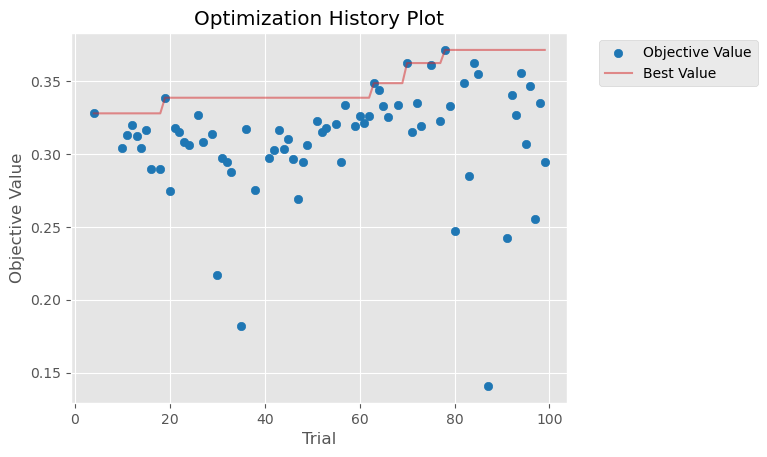

In [58]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-06 12:57:34,192] A new study created in memory with name: no-name-b6d0764f-f436-4463-b0ea-9f2f5ddfa709
/tmp/ipykernel_1565098/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


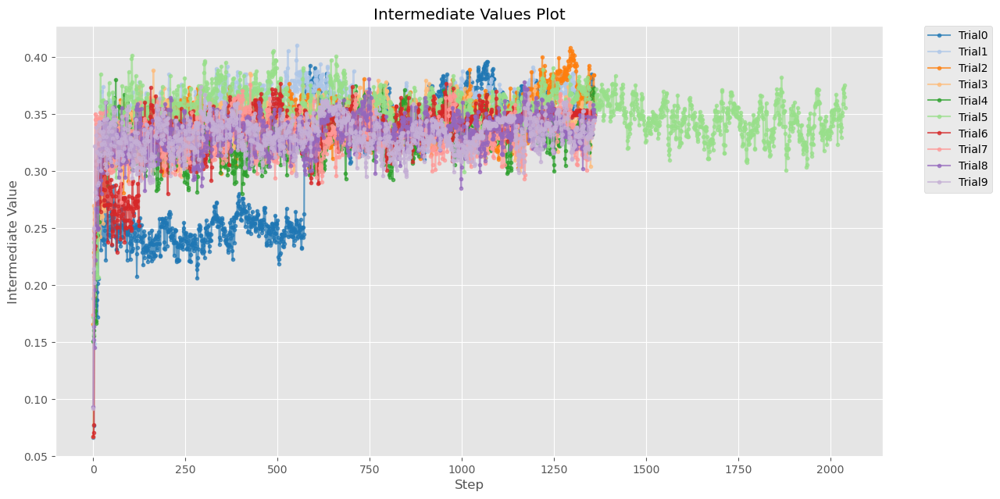

In [59]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_1565098/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


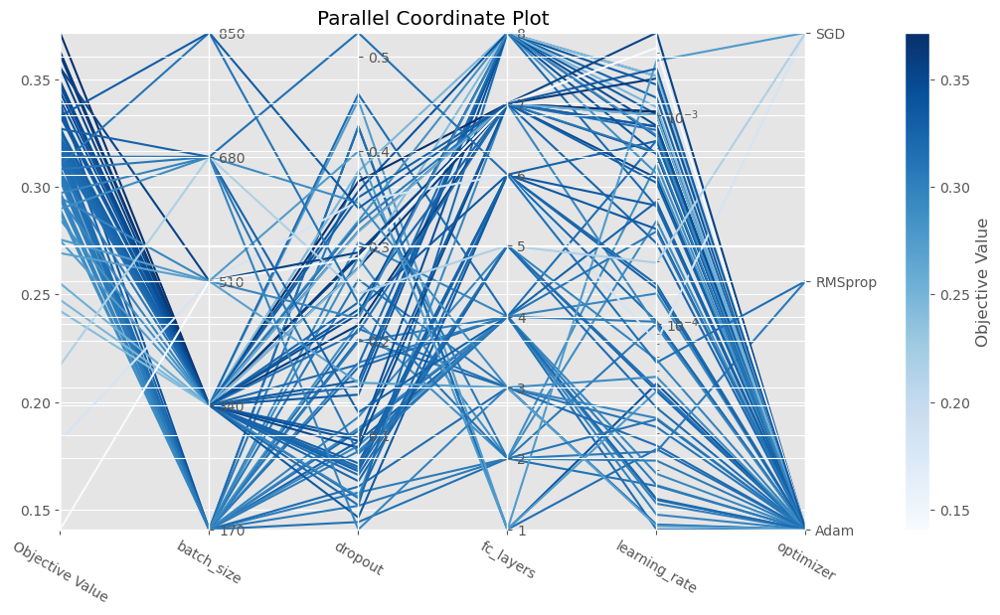

In [60]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_1565098/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-06 12:57:35,366] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


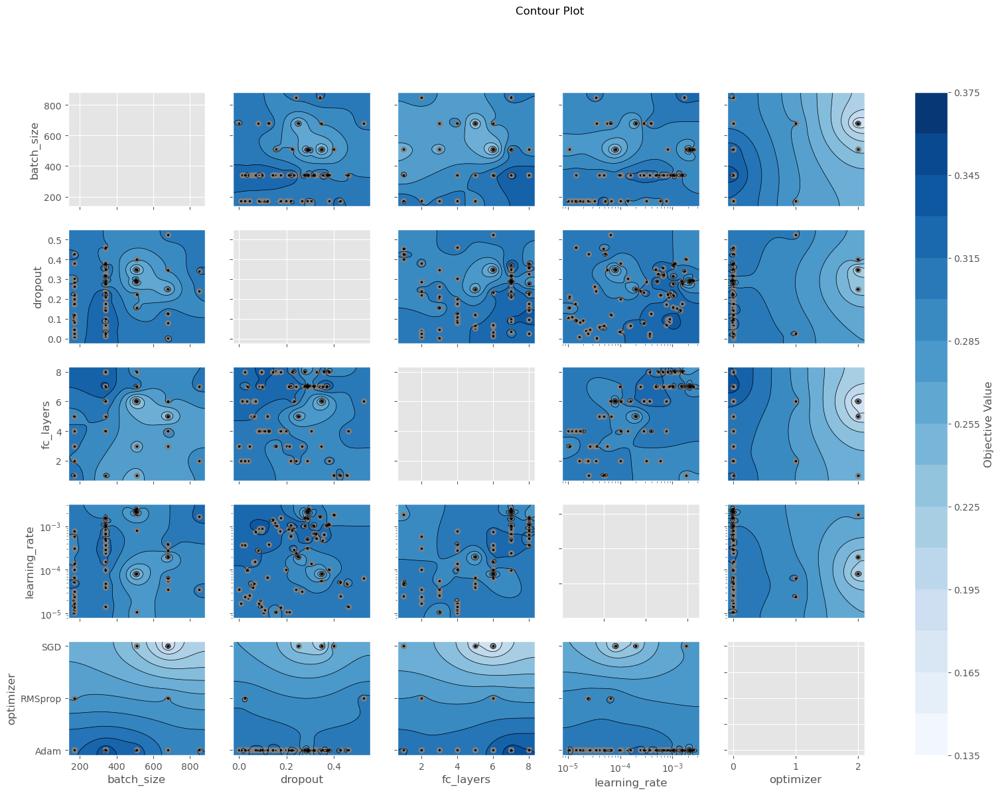

In [61]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_1565098/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

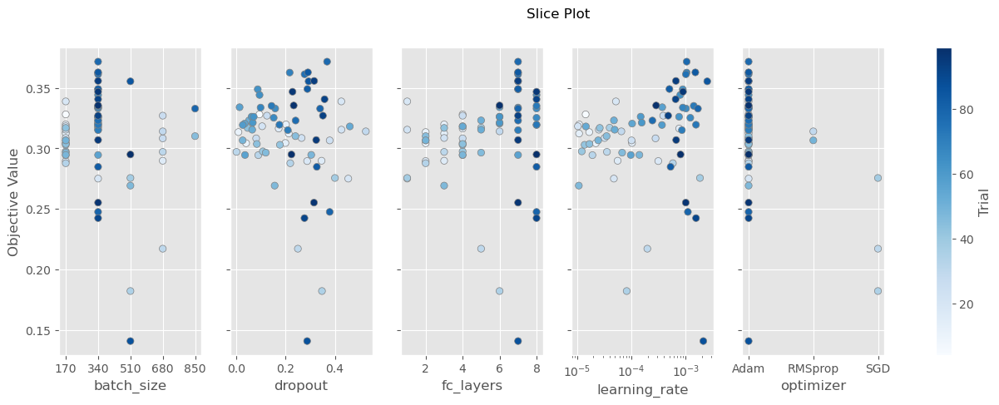

In [62]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_1565098/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

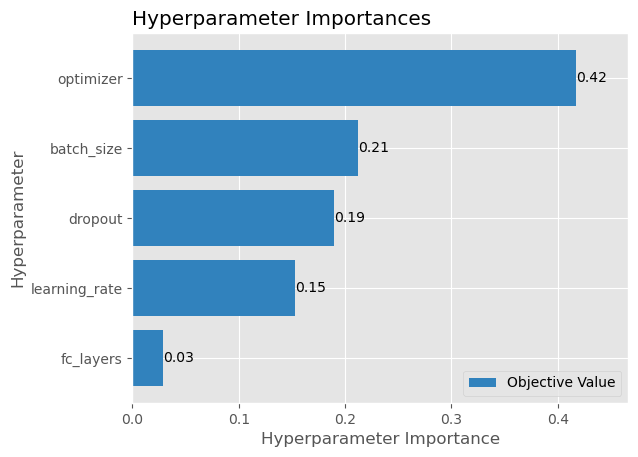

In [63]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_1565098/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

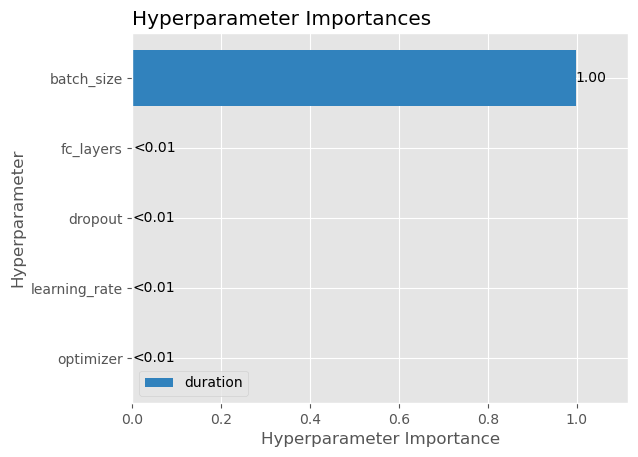

In [64]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_1565098/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

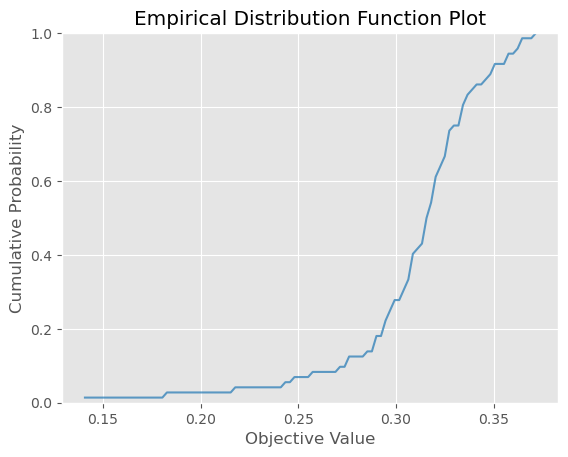

In [65]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_1565098/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-06 12:57:43,328] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


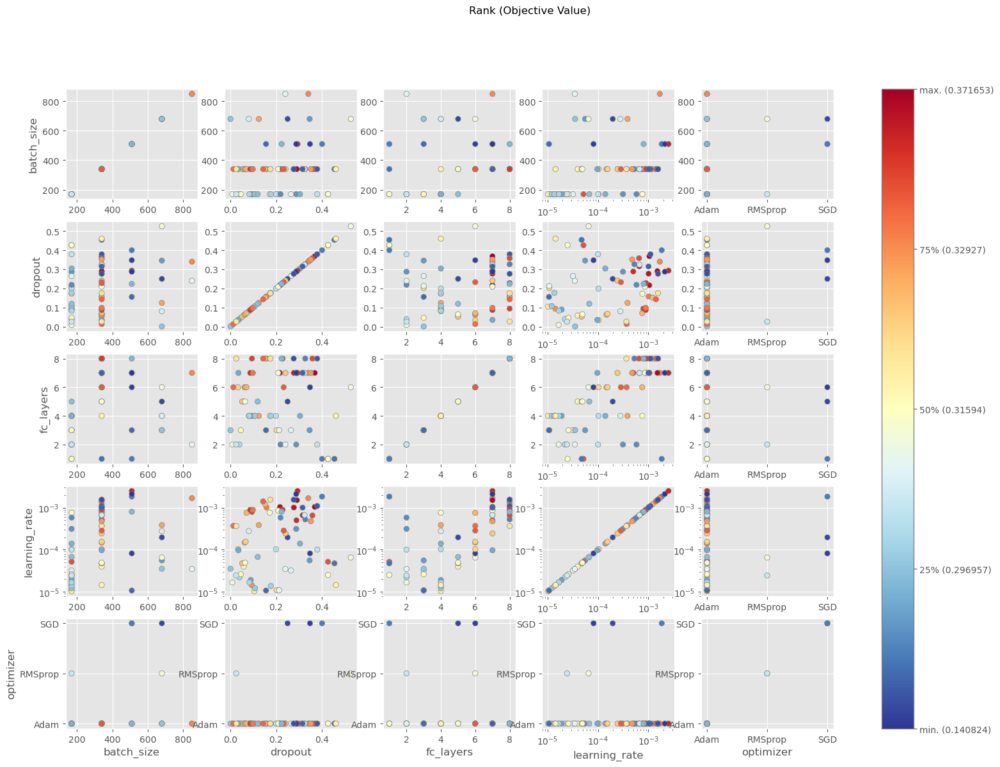

In [66]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_1565098/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


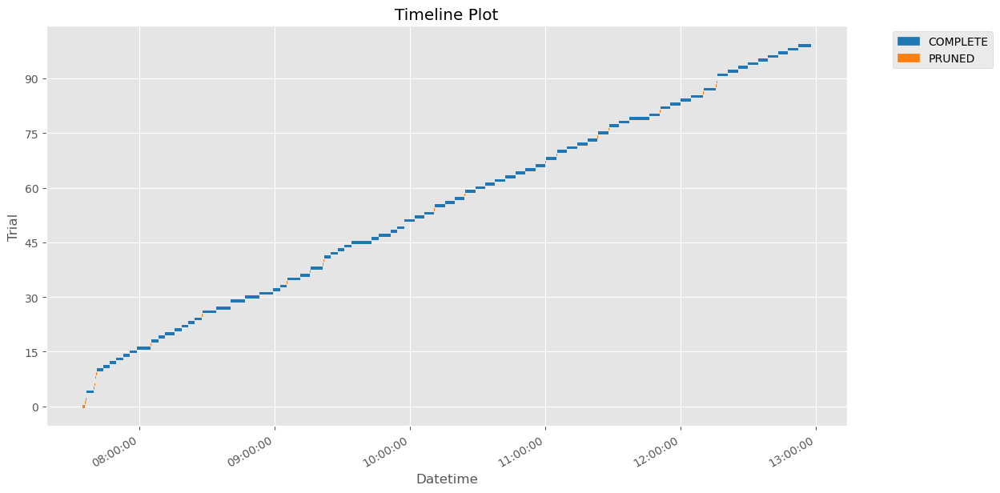

In [67]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

# 3. ratio feature set

In [68]:
from sklearn.model_selection import StratifiedGroupKFold

baseline_rest_idxs = data_split_indices['ratio'][0]
baseline_val_idxs = data_split_indices['ratio'][1]

# first splitting validation data using the first split from the baseline RF model
groups = [elem for elem in subjects_ratio_ids for i in range(12)] # times 12 for each epoch

print(f'{len(ratio_graph_dataset) = }')
print(f'{len(baseline_rest_idxs) = }, {len(baseline_val_idxs) = }, total: {len(baseline_rest_idxs)+len(baseline_val_idxs)}')

X_traintest = [ratio_graph_dataset[i] for i in baseline_rest_idxs] 
X_val = [ratio_graph_dataset[i] for i in baseline_val_idxs]
Y_traintest =[ratio_y_list[i] for i in baseline_rest_idxs]
Y_val = [ratio_y_list[i] for i in baseline_val_idxs]
groups_traintest = [groups[i] for i in baseline_rest_idxs]
groups_val = [groups[i] for i in baseline_val_idxs]

# now splitting the test and training data with seperate StratifiedGroupKFold
desired_test_ratio = 0.20
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)  # should shuffle be true?

train_idxs, test_idxs = sgkf.split(X_traintest, Y_traintest, groups_traintest).__next__() # just take the first split
print(f'{len(X_traintest) = }, {len(X_val) = }')
print(f'{len(train_idxs) = }, {len(test_idxs) = }, total: {len(train_idxs)+len(test_idxs)}')

X_train = [X_traintest[i] for i in train_idxs] # X also includes y values, because they are stored in the Data object
X_test = [X_traintest[i] for i in test_idxs]
Y_train =[Y_traintest[i] for i in train_idxs]
Y_test = [Y_traintest[i] for i in test_idxs]

len(ratio_graph_dataset) = 2688
len(baseline_rest_idxs) = 2148, len(baseline_val_idxs) = 540, total: 2688
len(X_traintest) = 2148, len(X_val) = 540
len(train_idxs) = 1716, len(test_idxs) = 432, total: 2148


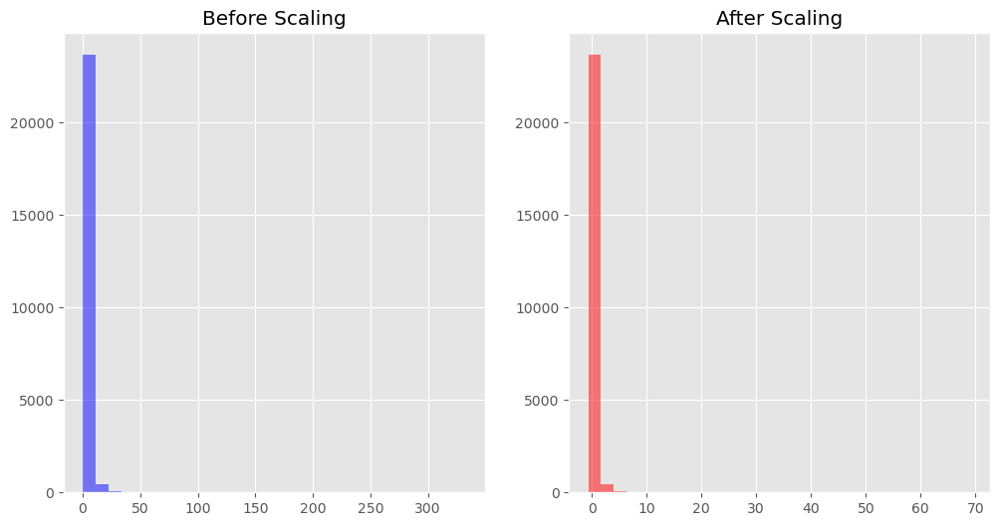

In [69]:
# standardize statistical node features
from sklearn.preprocessing import StandardScaler

# Concatenate all x values before scaling for the first feature, as a sanity check for standardization
x_before = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

scaler = StandardScaler()
scaler.fit(np.vstack([data.x.numpy() for data in X_train + X_val])) # fit on training and validation data


# Transform the x values of the data in X_train
for data in X_train:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_val
for data in X_val:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_test
for data in X_test:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Concatenate all x values after scaling for the first feature, as a sanity check for standardization
x_after = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

# Plot the distribution of the first x feature before and after scaling as a sanity check
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(x_before, bins=30, color='b', alpha=0.5)
plt.title('Before Scaling')

plt.subplot(1, 2, 2)
plt.hist(x_after, bins=30, color='r', alpha=0.5)
plt.title('After Scaling')

plt.show()

### Model: graphLambda without edge_attr

In [70]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    # fc_layers = 1
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create the model
    model = graphLambda_wo_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ratio_results_wo_edge_attrs_trials.pkl')

[I 2024-06-06 12:57:47,189] A new study created in memory with name: no-name-2d2330ae-5619-42d8-8f02-6378e94a0a4a
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 1.2157574379082881e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.15712468806609153}


[I 2024-06-06 13:04:59,607] Trial 0 finished with value: 0.23707273602485657 and parameters: {'learning_rate': 1.2157574379082881e-05, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.15712468806609153}. Best is trial 0 with value: 0.23707273602485657.


Tested parameters: {'learning_rate': 0.0037389220375049353, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 8, 'dropout': 0.4519465763749194}


[I 2024-06-06 13:05:12,913] Trial 1 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00043781738522688795, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.16789584274596017}


[I 2024-06-06 13:05:25,101] Trial 2 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.001965592581339287, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.4162952746116174}


[I 2024-06-06 13:05:47,495] Trial 3 pruned. Trial was pruned at epoch 178.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 6.664162844185446e-05, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.5901725716377055}


[I 2024-06-06 13:06:04,777] Trial 4 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 8.625785606070623e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.48709981527208657}


[I 2024-06-06 13:06:18,251] Trial 5 pruned. Trial was pruned at epoch 100.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (10) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.0005166207733272202, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.6742776015855703}


[I 2024-06-06 13:06:42,226] Trial 6 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.5359877282616353e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.5638675399048041}


[I 2024-06-06 13:07:54,746] Trial 7 pruned. Trial was pruned at epoch 291.


Tested parameters: {'learning_rate': 0.0005429685767213054, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.43840730533910277}


[I 2024-06-06 13:08:11,067] Trial 8 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0030197933945840727, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.5372893030010143}


[I 2024-06-06 13:08:23,695] Trial 9 pruned. Trial was pruned at epoch 100.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (3) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.015537075807251416, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.0002961253811316622}


[I 2024-06-06 13:08:36,897] Trial 10 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.0671641297872177e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.21408897606790359}


[I 2024-06-06 13:11:15,652] Trial 11 finished with value: 0.24998626112937927 and parameters: {'learning_rate': 1.0671641297872177e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.21408897606790359}. Best is trial 11 with value: 0.24998626112937927.


Tested parameters: {'learning_rate': 1.0562342982403348e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.22019321037226697}


[I 2024-06-06 13:13:55,270] Trial 12 finished with value: 0.2527253031730652 and parameters: {'learning_rate': 1.0562342982403348e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.22019321037226697}. Best is trial 12 with value: 0.2527253031730652.


Tested parameters: {'learning_rate': 7.233854408640654e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.2360693162226558}


[I 2024-06-06 13:16:33,156] Trial 13 finished with value: 0.24902381002902985 and parameters: {'learning_rate': 7.233854408640654e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.2360693162226558}. Best is trial 12 with value: 0.2527253031730652.


Tested parameters: {'learning_rate': 2.67299831429004e-05, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.287727149738464}


[I 2024-06-06 13:19:08,587] Trial 14 finished with value: 0.10499905049800873 and parameters: {'learning_rate': 2.67299831429004e-05, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.287727149738464}. Best is trial 12 with value: 0.2527253031730652.


Tested parameters: {'learning_rate': 0.00014311304312918162, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.04764557786979412}


[I 2024-06-06 13:21:43,480] Trial 15 finished with value: 0.24364560842514038 and parameters: {'learning_rate': 0.00014311304312918162, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.04764557786979412}. Best is trial 12 with value: 0.2527253031730652.


Tested parameters: {'learning_rate': 3.063279752234967e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.2724236342875668}


[I 2024-06-06 13:26:19,027] Trial 16 finished with value: 0.24507468938827515 and parameters: {'learning_rate': 3.063279752234967e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.2724236342875668}. Best is trial 12 with value: 0.2527253031730652.


Tested parameters: {'learning_rate': 0.02639342759340753, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.33293312183866297}


[I 2024-06-06 13:26:42,670] Trial 17 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00016636688255816648, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.11287799941217394}


[I 2024-06-06 13:29:27,925] Trial 18 finished with value: 0.25630849599838257 and parameters: {'learning_rate': 0.00016636688255816648, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.11287799941217394}. Best is trial 18 with value: 0.25630849599838257.


Tested parameters: {'learning_rate': 0.0002156922218042069, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.07419402764160668}


[I 2024-06-06 13:32:12,954] Trial 19 finished with value: 0.14012503623962402 and parameters: {'learning_rate': 0.0002156922218042069, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.07419402764160668}. Best is trial 18 with value: 0.25630849599838257.


Tested parameters: {'learning_rate': 0.009283262592502837, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.11228203939998342}


[I 2024-06-06 13:32:24,264] Trial 20 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.0943169881163978e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.18238854488712913}


[I 2024-06-06 13:35:08,697] Trial 21 finished with value: 0.2510705590248108 and parameters: {'learning_rate': 1.0943169881163978e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.18238854488712913}. Best is trial 18 with value: 0.25630849599838257.


Tested parameters: {'learning_rate': 2.733888010074223e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.3501755011130195}


[I 2024-06-06 13:37:46,988] Trial 22 finished with value: 0.2539103925228119 and parameters: {'learning_rate': 2.733888010074223e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.3501755011130195}. Best is trial 18 with value: 0.25630849599838257.


Tested parameters: {'learning_rate': 3.275815328482972e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.34826400729789087}


[I 2024-06-06 13:40:28,995] Trial 23 finished with value: 0.24678434431552887 and parameters: {'learning_rate': 3.275815328482972e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.34826400729789087}. Best is trial 18 with value: 0.25630849599838257.


Tested parameters: {'learning_rate': 0.00017117663476658382, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3773690399396912}


[I 2024-06-06 13:45:03,881] Trial 24 finished with value: 0.2662954330444336 and parameters: {'learning_rate': 0.00017117663476658382, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3773690399396912}. Best is trial 24 with value: 0.2662954330444336.


Tested parameters: {'learning_rate': 0.00020964678994136942, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3745054555167979}


[I 2024-06-06 13:49:44,441] Trial 25 finished with value: 0.2680376172065735 and parameters: {'learning_rate': 0.00020964678994136942, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3745054555167979}. Best is trial 25 with value: 0.2680376172065735.


Tested parameters: {'learning_rate': 0.0002358985030565991, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.7662355780197259}


[I 2024-06-06 13:49:58,618] Trial 26 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.08046214444800638, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.3782092277912901}


[I 2024-06-06 13:50:13,234] Trial 27 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0007272708954351284, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.6347169291626528}


[I 2024-06-06 13:50:27,266] Trial 28 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0011835715585868268, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.5072511809362115}


[I 2024-06-06 13:50:40,663] Trial 29 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0002813482402426476, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.2865192305389138}


[I 2024-06-06 13:55:14,474] Trial 30 finished with value: 0.2567184269428253 and parameters: {'learning_rate': 0.0002813482402426476, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.2865192305389138}. Best is trial 25 with value: 0.2680376172065735.


Tested parameters: {'learning_rate': 0.00021301810633446598, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.2830815911499393}


[I 2024-06-06 13:59:50,015] Trial 31 finished with value: 0.24350422620773315 and parameters: {'learning_rate': 0.00021301810633446598, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.2830815911499393}. Best is trial 25 with value: 0.2680376172065735.


Tested parameters: {'learning_rate': 0.0003213121623629479, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.12547766173554692}


[I 2024-06-06 14:04:22,464] Trial 32 finished with value: 0.24561476707458496 and parameters: {'learning_rate': 0.0003213121623629479, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.12547766173554692}. Best is trial 25 with value: 0.2680376172065735.


Tested parameters: {'learning_rate': 0.00011004278434716683, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.4022864514823507}


[I 2024-06-06 14:08:59,894] Trial 33 finished with value: 0.2782643139362335 and parameters: {'learning_rate': 0.00011004278434716683, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.4022864514823507}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.0011704108397108837, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.4090941116683641}


[I 2024-06-06 14:09:14,570] Trial 34 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 8.983804770532116e-05, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.47273919254175745}


[I 2024-06-06 14:09:37,093] Trial 35 pruned. Trial was pruned at epoch 171.


Tested parameters: {'learning_rate': 0.00012814207044805362, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3197662880911485}


[I 2024-06-06 14:14:11,737] Trial 36 finished with value: 0.2651419937610626 and parameters: {'learning_rate': 0.00012814207044805362, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3197662880911485}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 5.44465243426937e-05, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.38038505345911494}


[I 2024-06-06 14:17:57,579] Trial 37 finished with value: 0.11959892511367798 and parameters: {'learning_rate': 5.44465243426937e-05, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.38038505345911494}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.00010662257758390708, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.45530980240000063}


[I 2024-06-06 14:22:33,181] Trial 38 finished with value: 0.25697705149650574 and parameters: {'learning_rate': 0.00010662257758390708, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.45530980240000063}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.0004608599549071999, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.39969754668922486}


[I 2024-06-06 14:22:45,160] Trial 39 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 5.895594056305445e-05, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.3222122302282058}


[I 2024-06-06 14:30:09,020] Trial 40 finished with value: 0.2197536677122116 and parameters: {'learning_rate': 5.895594056305445e-05, 'optimizer': 'RMSprop', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.3222122302282058}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.00012322680156596442, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.44389688815032535}


[I 2024-06-06 14:34:43,202] Trial 41 finished with value: 0.2594313621520996 and parameters: {'learning_rate': 0.00012322680156596442, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.44389688815032535}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.00012384396284533867, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.5141127769379734}


[I 2024-06-06 14:34:56,340] Trial 42 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 5.3006833757633755e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4317880480199725}


[I 2024-06-06 14:39:29,535] Trial 43 finished with value: 0.27027028799057007 and parameters: {'learning_rate': 5.3006833757633755e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4317880480199725}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 4.614991152445096e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.5752578531635612}


[I 2024-06-06 14:39:42,815] Trial 44 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00035698721469151914, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.41677046882828944}


[I 2024-06-06 14:39:59,700] Trial 45 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 2.1158120835932145e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.3664411415442454}


[I 2024-06-06 14:44:29,808] Trial 46 finished with value: 0.2628135085105896 and parameters: {'learning_rate': 2.1158120835932145e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.3664411415442454}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.0007807874829462982, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.3195223837338816}


[I 2024-06-06 14:44:42,476] Trial 47 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0020378961218934823, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.4803802076681141}


[I 2024-06-06 14:44:55,566] Trial 48 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 4.5341667367731456e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.5448949711350773}


[I 2024-06-06 14:45:08,215] Trial 49 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 8.383520950950795e-05, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.31402108518228167}


[I 2024-06-06 14:49:44,309] Trial 50 finished with value: 0.14742344617843628 and parameters: {'learning_rate': 8.383520950950795e-05, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.31402108518228167}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 2.265973455618125e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.3742718845602216}


[I 2024-06-06 14:54:16,331] Trial 51 finished with value: 0.2468295842409134 and parameters: {'learning_rate': 2.265973455618125e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.3742718845602216}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 1.6727153626436135e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.36806269715628853}


[I 2024-06-06 14:58:45,863] Trial 52 finished with value: 0.24119290709495544 and parameters: {'learning_rate': 1.6727153626436135e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 1, 'dropout': 0.36806269715628853}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 1.7202159497285302e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.25017193615040906}


[I 2024-06-06 15:03:22,052] Trial 53 finished with value: 0.2533636689186096 and parameters: {'learning_rate': 1.7202159497285302e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.25017193615040906}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 3.7262002066319145e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4307755630343746}


[I 2024-06-06 15:07:54,929] Trial 54 finished with value: 0.26435816287994385 and parameters: {'learning_rate': 3.7262002066319145e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4307755630343746}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.0001618139065314231, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.4268402907209732}


[I 2024-06-06 15:11:38,158] Trial 55 finished with value: 0.25817251205444336 and parameters: {'learning_rate': 0.0001618139065314231, 'optimizer': 'RMSprop', 'batch_size': 340, 'fc_layers': 3, 'dropout': 0.4268402907209732}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 4.308342534867109e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4636936210852828}


[I 2024-06-06 15:16:08,008] Trial 56 finished with value: 0.26740217208862305 and parameters: {'learning_rate': 4.308342534867109e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4636936210852828}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 6.359644450806843e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.6058053251458964}


[I 2024-06-06 15:16:21,989] Trial 57 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00017140159567512666, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.5080771507594027}


[I 2024-06-06 15:16:36,136] Trial 58 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 9.09605848123849e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4494042017084408}


[I 2024-06-06 15:21:12,207] Trial 59 finished with value: 0.2705349922180176 and parameters: {'learning_rate': 9.09605848123849e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4494042017084408}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 9.472776143322224e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.4638895629360382}


[I 2024-06-06 15:26:24,370] Trial 60 finished with value: 0.2546565532684326 and parameters: {'learning_rate': 9.472776143322224e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.4638895629360382}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 6.628221838231985e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4087201274094767}


[I 2024-06-06 15:30:57,909] Trial 61 finished with value: 0.24877937138080597 and parameters: {'learning_rate': 6.628221838231985e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4087201274094767}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 3.610385179272031e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3412950210748625}


[I 2024-06-06 15:35:31,019] Trial 62 finished with value: 0.26237064599990845 and parameters: {'learning_rate': 3.610385179272031e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3412950210748625}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.00016895792408971479, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.39409946113677385}


[I 2024-06-06 15:40:11,415] Trial 63 finished with value: 0.26151371002197266 and parameters: {'learning_rate': 0.00016895792408971479, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.39409946113677385}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.00021849477478742713, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.49335358399786367}


[I 2024-06-06 15:40:24,907] Trial 64 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 7.667717859117186e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3033115156743279}


[I 2024-06-06 15:45:00,881] Trial 65 finished with value: 0.2684231996536255 and parameters: {'learning_rate': 7.667717859117186e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3033115156743279}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 4.571840229631327e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.5331241025761678}


[I 2024-06-06 15:45:14,770] Trial 66 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 8.016345827788638e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.19509600095068158}


[I 2024-06-06 15:49:45,572] Trial 67 finished with value: 0.2619320750236511 and parameters: {'learning_rate': 8.016345827788638e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.19509600095068158}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.000617816613651472, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.4488930956700411}


[I 2024-06-06 15:49:58,769] Trial 68 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00037437836766601447, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.29781937673429293}


[I 2024-06-06 15:50:12,323] Trial 69 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 9.932533212049564e-05, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.2709202360229074}


[I 2024-06-06 15:53:59,166] Trial 70 finished with value: 0.24721847474575043 and parameters: {'learning_rate': 9.932533212049564e-05, 'optimizer': 'RMSprop', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.2709202360229074}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.0001370657380780371, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.34790587979612464}


[I 2024-06-06 15:58:35,391] Trial 71 finished with value: 0.2605170011520386 and parameters: {'learning_rate': 0.0001370657380780371, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.34790587979612464}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.0002797061501696786, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.22902265419930617}


[I 2024-06-06 16:03:06,524] Trial 72 finished with value: 0.25451529026031494 and parameters: {'learning_rate': 0.0002797061501696786, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.22902265419930617}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.005486123302441164, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3965406321852498}


[I 2024-06-06 16:03:20,465] Trial 73 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 7.219387020781331e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.25750719990025533}


[I 2024-06-06 16:07:56,064] Trial 74 finished with value: 0.24855060875415802 and parameters: {'learning_rate': 7.219387020781331e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.25750719990025533}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 0.00012255499994792015, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3097906307284068}


[I 2024-06-06 16:12:26,755] Trial 75 finished with value: 0.2680550217628479 and parameters: {'learning_rate': 0.00012255499994792015, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3097906307284068}. Best is trial 33 with value: 0.2782643139362335.


Tested parameters: {'learning_rate': 4.9465261908522744e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4353649919826566}


[I 2024-06-06 16:17:01,584] Trial 76 finished with value: 0.28126776218414307 and parameters: {'learning_rate': 4.9465261908522744e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4353649919826566}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 2.671254555750186e-05, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.4413841332051186}


[I 2024-06-06 16:24:21,387] Trial 77 finished with value: 0.23263497650623322 and parameters: {'learning_rate': 2.671254555750186e-05, 'optimizer': 'RMSprop', 'batch_size': 850, 'fc_layers': 2, 'dropout': 0.4413841332051186}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 4.18527778936389e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.48894645833602857}


[I 2024-06-06 16:24:35,494] Trial 78 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 5.538420586847357e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.41879469273793146}


[I 2024-06-06 16:29:45,783] Trial 79 finished with value: 0.2524924874305725 and parameters: {'learning_rate': 5.538420586847357e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.41879469273793146}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 0.00011002244460559939, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4625860307694255}


[I 2024-06-06 16:34:21,049] Trial 80 finished with value: 0.21981975436210632 and parameters: {'learning_rate': 0.00011002244460559939, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.4625860307694255}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 0.0002046761937874805, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3010528777383288}


[I 2024-06-06 16:38:57,003] Trial 81 finished with value: 0.25360459089279175 and parameters: {'learning_rate': 0.0002046761937874805, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3010528777383288}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 1.3586558430563059e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3914637478567625}


[I 2024-06-06 16:39:10,404] Trial 82 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 3.1968925617855715e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.3604224655489784}


[I 2024-06-06 16:43:48,787] Trial 83 finished with value: 0.25528883934020996 and parameters: {'learning_rate': 3.1968925617855715e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.3604224655489784}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 5.131262863197451e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.3270138207845184}


[I 2024-06-06 16:48:19,773] Trial 84 finished with value: 0.2576250433921814 and parameters: {'learning_rate': 5.131262863197451e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.3270138207845184}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 7.461607034000817e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.7808648911196249}


[I 2024-06-06 16:48:33,745] Trial 85 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00027569696144551443, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.7214109275060888}


[I 2024-06-06 16:48:47,475] Trial 86 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00014171161406649789, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.38019831582574004}


[I 2024-06-06 16:53:20,561] Trial 87 finished with value: 0.2462427169084549 and parameters: {'learning_rate': 0.00014171161406649789, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.38019831582574004}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 9.066690102065203e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.523806997548569}


[I 2024-06-06 16:53:34,564] Trial 88 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00011082220530697791, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.44112081648533935}


[I 2024-06-06 16:57:19,690] Trial 89 finished with value: 0.24294255673885345 and parameters: {'learning_rate': 0.00011082220530697791, 'optimizer': 'RMSprop', 'batch_size': 340, 'fc_layers': 4, 'dropout': 0.44112081648533935}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 2.1929424507751487e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 2, 'dropout': 0.4797276545113203}


[I 2024-06-06 16:57:32,773] Trial 90 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00012639331762960085, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3352100468912328}


[I 2024-06-06 17:02:10,505] Trial 91 finished with value: 0.24379943311214447 and parameters: {'learning_rate': 0.00012639331762960085, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3352100468912328}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 0.00018761044756778476, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3549020494928905}


[I 2024-06-06 17:06:47,801] Trial 92 finished with value: 0.24597863852977753 and parameters: {'learning_rate': 0.00018761044756778476, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3549020494928905}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 6.431005170348986e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.31637414847632483}


[I 2024-06-06 17:11:24,500] Trial 93 finished with value: 0.2595936059951782 and parameters: {'learning_rate': 6.431005170348986e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.31637414847632483}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 5.463922241922203e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.4221557923738586}


[I 2024-06-06 17:15:57,303] Trial 94 finished with value: 0.2733946740627289 and parameters: {'learning_rate': 5.463922241922203e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.4221557923738586}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 2.7759124322591152e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.42389547300965164}


[I 2024-06-06 17:18:39,110] Trial 95 finished with value: 0.24226783215999603 and parameters: {'learning_rate': 2.7759124322591152e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.42389547300965164}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 4.0482477954485956e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.403727408392177}


[I 2024-06-06 17:23:16,869] Trial 96 finished with value: 0.2285534292459488 and parameters: {'learning_rate': 4.0482477954485956e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.403727408392177}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 5.263620349054094e-05, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.46363373993280016}


[I 2024-06-06 17:23:29,796] Trial 97 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 9.283327353326643e-05, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3828127538852511}


[I 2024-06-06 17:28:05,084] Trial 98 finished with value: 0.2343069314956665 and parameters: {'learning_rate': 9.283327353326643e-05, 'optimizer': 'RMSprop', 'batch_size': 510, 'fc_layers': 4, 'dropout': 0.3828127538852511}. Best is trial 76 with value: 0.28126776218414307.


Tested parameters: {'learning_rate': 8.067855244907083e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.5586185288321608}


[I 2024-06-06 17:28:17,196] Trial 99 pruned. Trial was pruned at epoch 100.


Best trial:
  Value: 0.28126776218414307
  Params: 
    learning_rate: 4.9465261908522744e-05
    optimizer: RMSprop
    batch_size: 510
    fc_layers: 3
    dropout: 0.4353649919826566


In [71]:
df_trials = pd.read_pickle('ratio_results_wo_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
76,76,0.281268,2024-06-06 16:12:26.757065,2024-06-06 16:17:01.582288,0 days 00:04:34.825223,510,0.435365,3,0.000049,RMSprop,COMPLETE
33,33,0.278264,2024-06-06 14:04:22.465705,2024-06-06 14:08:59.892419,0 days 00:04:37.426714,510,0.402286,4,0.000110,RMSprop,COMPLETE
94,94,0.273395,2024-06-06 17:11:24.504025,2024-06-06 17:15:57.300219,0 days 00:04:32.796194,510,0.422156,4,0.000055,RMSprop,COMPLETE
59,59,0.270535,2024-06-06 15:16:36.137341,2024-06-06 15:21:12.205024,0 days 00:04:36.067683,510,0.449404,3,0.000091,Adam,COMPLETE
43,43,0.270270,2024-06-06 14:34:56.341761,2024-06-06 14:39:29.533016,0 days 00:04:33.191255,510,0.431788,3,0.000053,RMSprop,COMPLETE
65,65,0.268423,2024-06-06 15:40:24.908637,2024-06-06 15:45:00.878384,0 days 00:04:35.969747,510,0.303312,4,0.000077,RMSprop,COMPLETE
75,75,0.268055,2024-06-06 16:07:56.064960,2024-06-06 16:12:26.752370,0 days 00:04:30.687410,510,0.309791,4,0.000123,RMSprop,COMPLETE
25,25,0.268038,2024-06-06 13:45:03.882914,2024-06-06 13:49:44.439139,0 days 00:04:40.556225,510,0.374505,4,0.000210,RMSprop,COMPLETE
56,56,0.267402,2024-06-06 15:11:38.159853,2024-06-06 15:16:08.005778,0 days 00:04:29.845925,510,0.463694,3,0.000043,RMSprop,COMPLETE
24,24,0.266295,2024-06-06 13:40:28.997806,2024-06-06 13:45:03.879054,0 days 00:04:34.881248,510,0.377369,4,0.000171,RMSprop,COMPLETE


#### Visualizations

/tmp/ipykernel_1565098/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

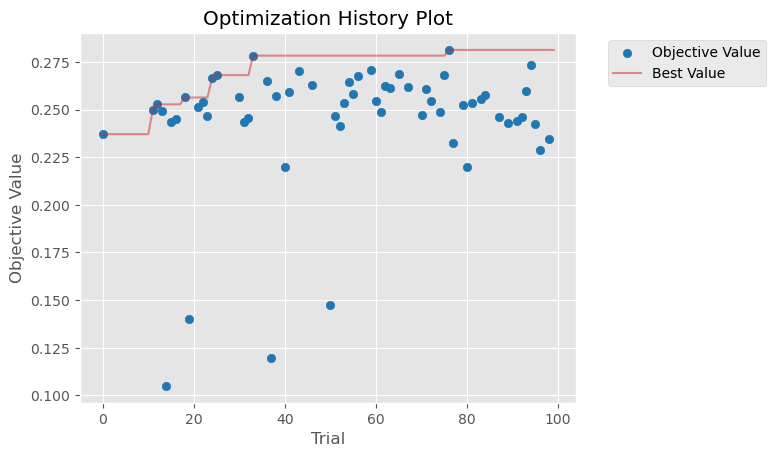

In [72]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-06 17:28:17,589] A new study created in memory with name: no-name-c54c6df6-9e89-436e-90e5-46aa8e565c96
/tmp/ipykernel_1565098/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


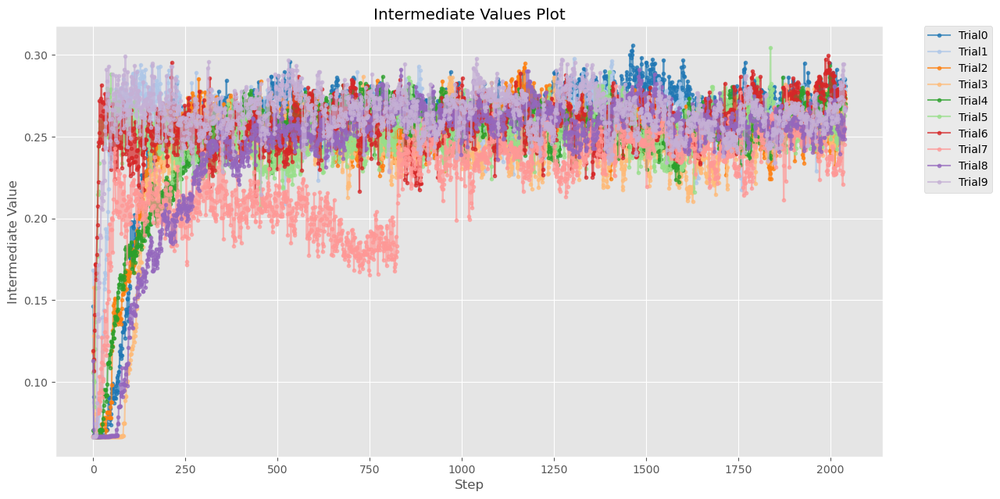

In [73]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_1565098/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


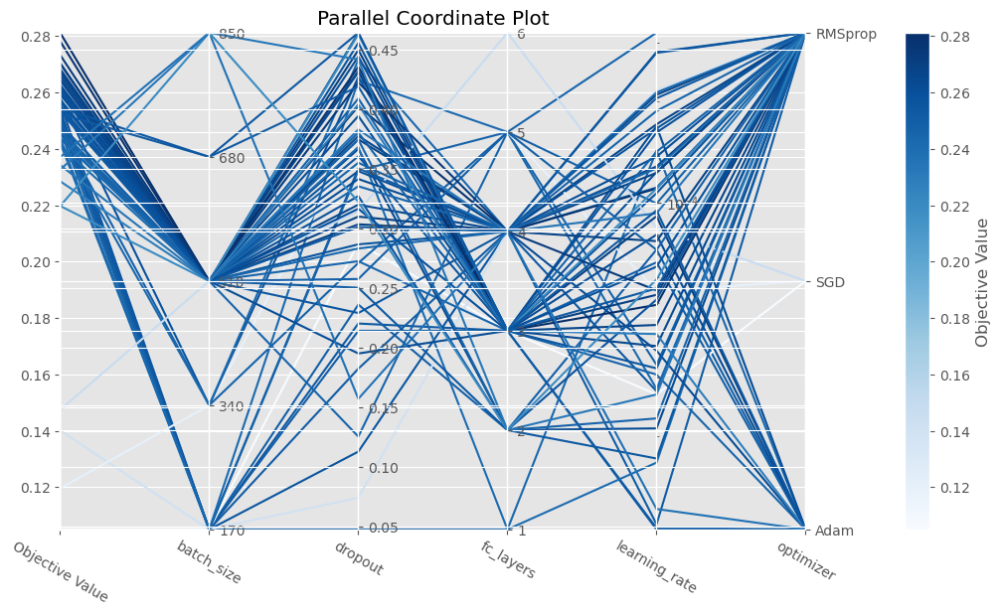

In [74]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_1565098/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-06 17:28:19,351] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


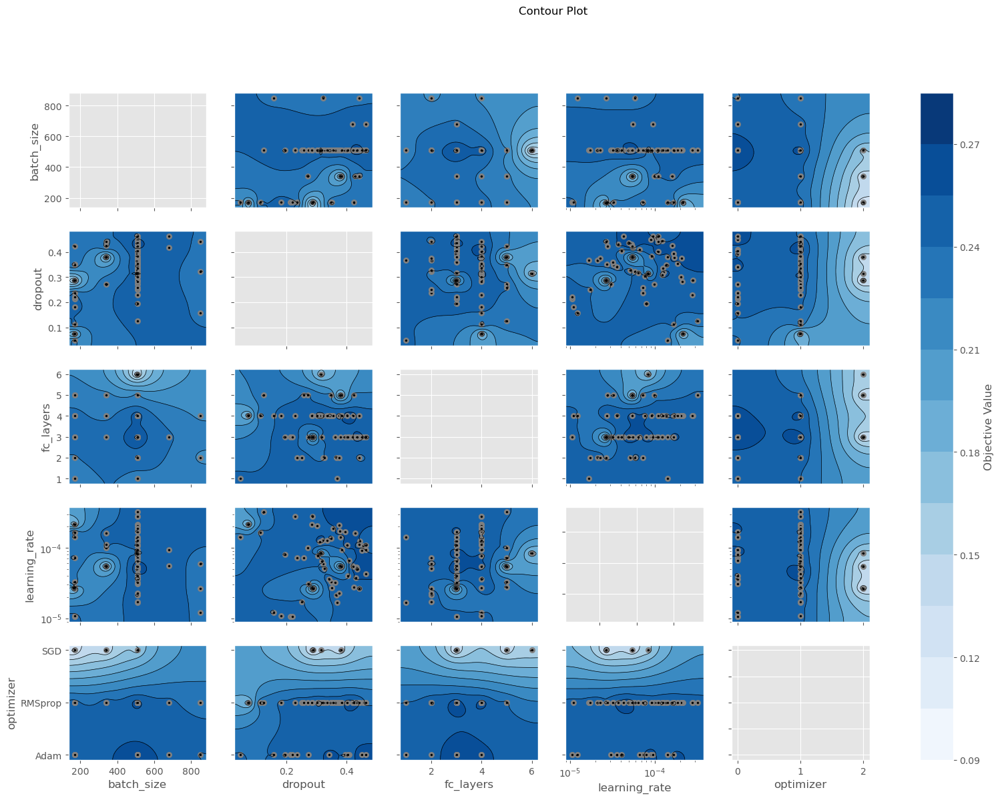

In [75]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_1565098/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

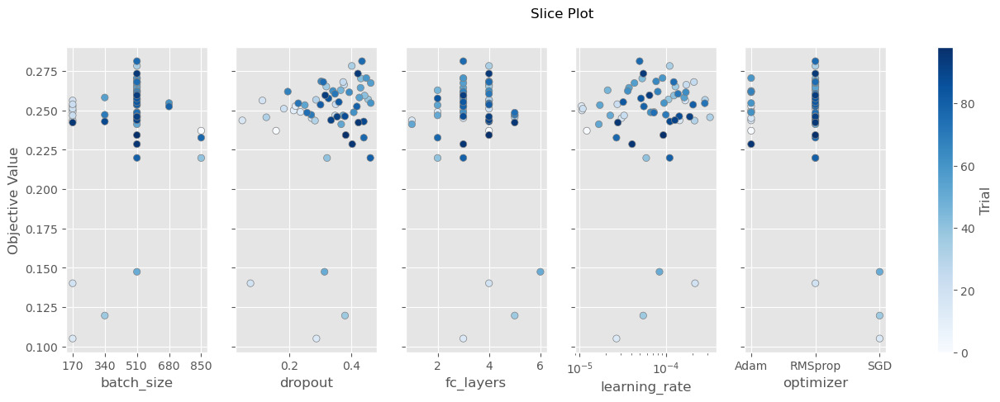

In [76]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_1565098/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

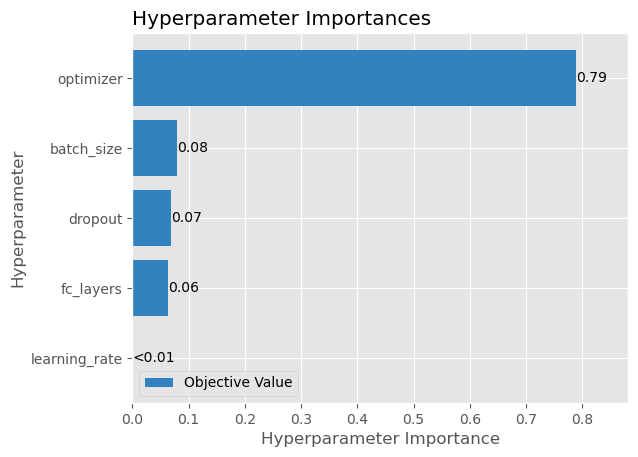

In [77]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_1565098/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

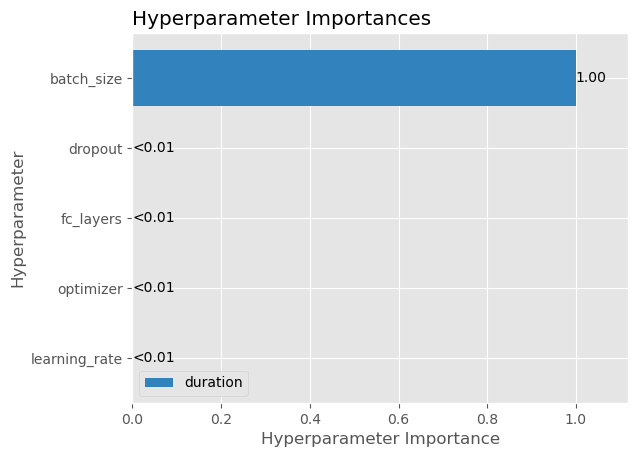

In [78]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_1565098/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

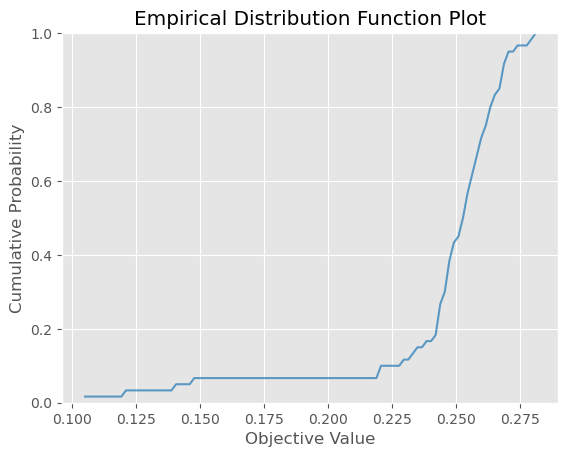

In [79]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_1565098/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-06 17:28:26,293] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


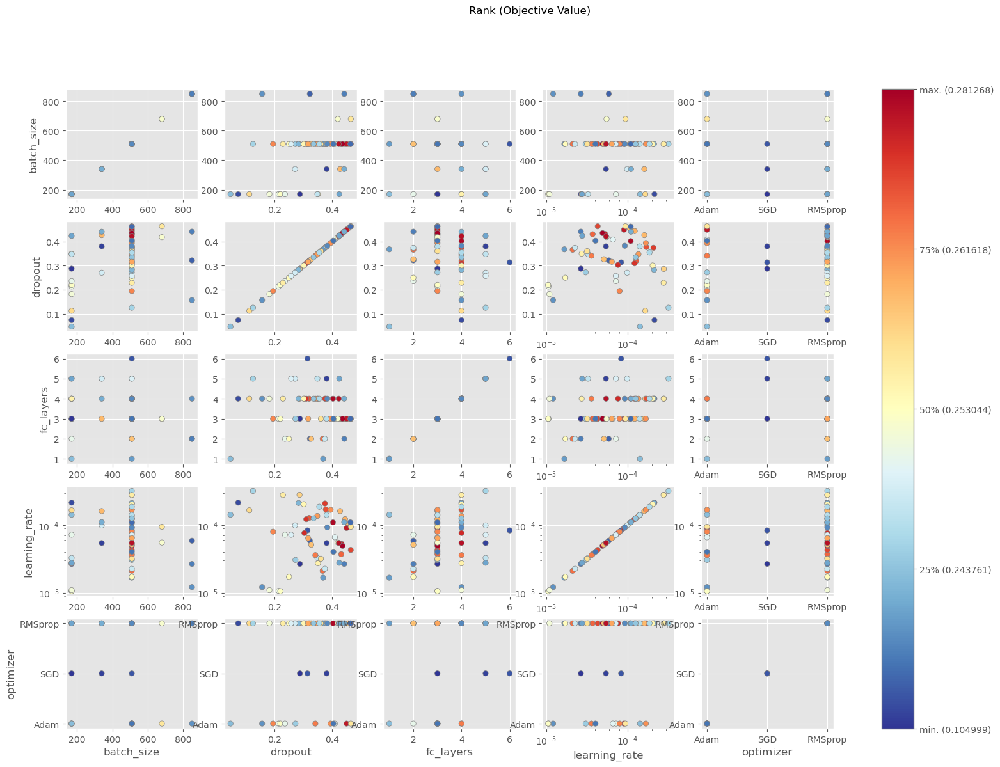

In [80]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_1565098/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


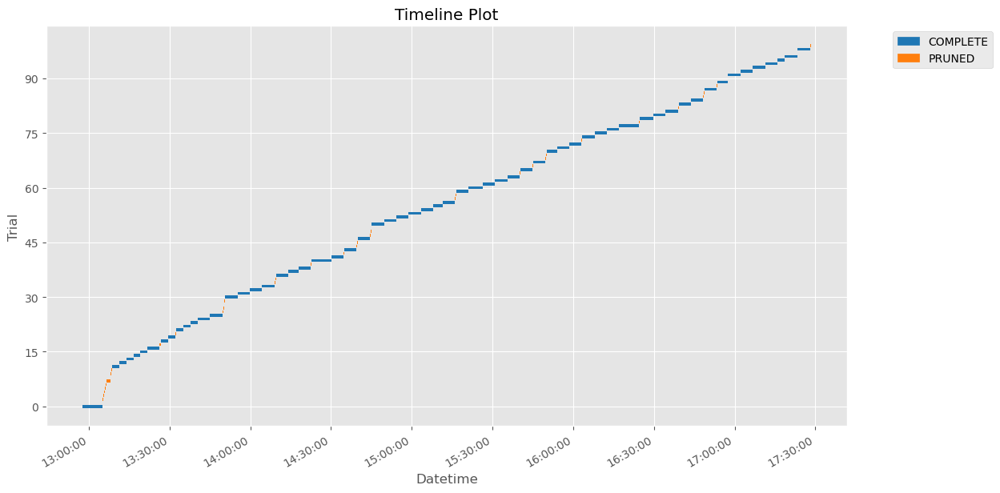

In [81]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda with edge_attr

In [82]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [170, 340, 510, 680, 850])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size


    # Create the model
    model = graphLambda_w_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.1, n_warmup_steps=100))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ratio_results_w_edge_attrs_trials.pkl')

[I 2024-06-06 17:28:29,834] A new study created in memory with name: no-name-ac3ec654-d7d6-4a66-aa3d-a22a60a6a810
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.00011371274667480487, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 8, 'dropout': 0.69944977078337}


[I 2024-06-06 17:28:45,568] Trial 0 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.05001575185819413, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.5143882605066249}


[I 2024-06-06 17:29:01,197] Trial 1 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.4908910527299812e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.5883386495126147}


[I 2024-06-06 17:35:12,988] Trial 2 finished with value: 0.2656267285346985 and parameters: {'learning_rate': 1.4908910527299812e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.5883386495126147}. Best is trial 2 with value: 0.2656267285346985.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.0007192610816677099, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 1, 'dropout': 0.2987991275257031}


[I 2024-06-06 17:39:33,402] Trial 3 finished with value: 0.24750414490699768 and parameters: {'learning_rate': 0.0007192610816677099, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 1, 'dropout': 0.2987991275257031}. Best is trial 2 with value: 0.2656267285346985.


Tested parameters: {'learning_rate': 4.2364849947052236e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 7, 'dropout': 0.5706250908555555}


[I 2024-06-06 17:39:47,393] Trial 4 pruned. Trial was pruned at epoch 100.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (3) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.05153922017738423, 'optimizer_name': 'SGD', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.25830310352199987}


[I 2024-06-06 17:45:13,571] Trial 5 finished with value: 0.24654455482959747 and parameters: {'learning_rate': 0.05153922017738423, 'optimizer': 'SGD', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.25830310352199987}. Best is trial 2 with value: 0.2656267285346985.


Tested parameters: {'learning_rate': 0.05580861518140251, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 8, 'dropout': 0.7383187725482644}


[I 2024-06-06 17:45:34,165] Trial 6 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.05004890539729092, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.31409223665690506}


[I 2024-06-06 17:49:53,588] Trial 7 finished with value: 0.2077350616455078 and parameters: {'learning_rate': 0.05004890539729092, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 2, 'dropout': 0.31409223665690506}. Best is trial 2 with value: 0.2656267285346985.


Tested parameters: {'learning_rate': 0.00015664957894675425, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.17346814080066597}


[I 2024-06-06 17:54:19,800] Trial 8 finished with value: 0.17811614274978638 and parameters: {'learning_rate': 0.00015664957894675425, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.17346814080066597}. Best is trial 2 with value: 0.2656267285346985.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (10) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.04447829132444736, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 2, 'dropout': 0.6166349697907103}


[I 2024-06-06 17:54:46,703] Trial 9 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.1865560706101958e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.014564194097550942}


[I 2024-06-06 18:00:58,728] Trial 10 finished with value: 0.26284271478652954 and parameters: {'learning_rate': 1.1865560706101958e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.014564194097550942}. Best is trial 2 with value: 0.2656267285346985.


Tested parameters: {'learning_rate': 1.09054519838563e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.03305359544117517}


[I 2024-06-06 18:07:16,165] Trial 11 finished with value: 0.25268685817718506 and parameters: {'learning_rate': 1.09054519838563e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.03305359544117517}. Best is trial 2 with value: 0.2656267285346985.


Tested parameters: {'learning_rate': 1.0473118519915451e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.4422478620790319}


[I 2024-06-06 18:07:30,125] Trial 12 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0053325411639241985, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.006865515799403532}


[I 2024-06-06 18:07:43,488] Trial 13 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 4.242799260399066e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.14918630189984167}


[I 2024-06-06 18:13:56,633] Trial 14 finished with value: 0.23970437049865723 and parameters: {'learning_rate': 4.242799260399066e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.14918630189984167}. Best is trial 2 with value: 0.2656267285346985.


Tested parameters: {'learning_rate': 0.0013140791558272284, 'optimizer_name': 'RMSprop', 'batch_size': 510, 'fc_layers': 3, 'dropout': 0.48107237541992526}


[I 2024-06-06 18:14:12,783] Trial 15 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 3.7611174563368815e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.37543831339679445}


[I 2024-06-06 18:17:07,572] Trial 16 finished with value: 0.2425108104944229 and parameters: {'learning_rate': 3.7611174563368815e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.37543831339679445}. Best is trial 2 with value: 0.2656267285346985.


Tested parameters: {'learning_rate': 0.00032528796137898017, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.7917148254982975}


[I 2024-06-06 18:17:22,160] Trial 17 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.8995121866005473e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.6458222435324769}


[I 2024-06-06 18:17:35,724] Trial 18 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.004959869454811051, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.18756254261884653}


[I 2024-06-06 18:17:50,040] Trial 19 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00010072638058438447, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.0803424690995792}


[I 2024-06-06 18:20:55,611] Trial 20 finished with value: 0.2546237111091614 and parameters: {'learning_rate': 0.00010072638058438447, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.0803424690995792}. Best is trial 2 with value: 0.2656267285346985.


Tested parameters: {'learning_rate': 9.567497271196752e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.0774379438902213}


[I 2024-06-06 18:23:57,652] Trial 21 finished with value: 0.26834237575531006 and parameters: {'learning_rate': 9.567497271196752e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.0774379438902213}. Best is trial 21 with value: 0.26834237575531006.


Tested parameters: {'learning_rate': 3.1781668120844266e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.1083431504068456}


[I 2024-06-06 18:26:56,394] Trial 22 finished with value: 0.2709314823150635 and parameters: {'learning_rate': 3.1781668120844266e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.1083431504068456}. Best is trial 22 with value: 0.2709314823150635.


Tested parameters: {'learning_rate': 2.7113073096442093e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.10038254533277335}


[I 2024-06-06 18:29:58,599] Trial 23 finished with value: 0.24499043822288513 and parameters: {'learning_rate': 2.7113073096442093e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.10038254533277335}. Best is trial 22 with value: 0.2709314823150635.


Tested parameters: {'learning_rate': 8.77334104258255e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.21162142161216788}


[I 2024-06-06 18:33:04,957] Trial 24 finished with value: 0.23714664578437805 and parameters: {'learning_rate': 8.77334104258255e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.21162142161216788}. Best is trial 22 with value: 0.2709314823150635.


Tested parameters: {'learning_rate': 0.0003307369651721036, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.38613446354401076}


[I 2024-06-06 18:36:08,202] Trial 25 finished with value: 0.2762667238712311 and parameters: {'learning_rate': 0.0003307369651721036, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.38613446354401076}. Best is trial 25 with value: 0.2762667238712311.


Tested parameters: {'learning_rate': 0.0002977347553998232, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.3868467702863475}


[I 2024-06-06 18:39:07,515] Trial 26 finished with value: 0.25906944274902344 and parameters: {'learning_rate': 0.0002977347553998232, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.3868467702863475}. Best is trial 25 with value: 0.2762667238712311.


Tested parameters: {'learning_rate': 0.0011218343992895924, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.12225604259033439}


[I 2024-06-06 18:42:12,016] Trial 27 finished with value: 0.2598932385444641 and parameters: {'learning_rate': 0.0011218343992895924, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.12225604259033439}. Best is trial 25 with value: 0.2762667238712311.


Tested parameters: {'learning_rate': 0.00032523944776757227, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.21836258528941116}


[I 2024-06-06 18:45:16,921] Trial 28 finished with value: 0.24129925668239594 and parameters: {'learning_rate': 0.00032523944776757227, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.21836258528941116}. Best is trial 25 with value: 0.2762667238712311.


Tested parameters: {'learning_rate': 7.095274647815866e-05, 'optimizer_name': 'SGD', 'batch_size': 850, 'fc_layers': 8, 'dropout': 0.31528052309667665}


[I 2024-06-06 18:45:33,471] Trial 29 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00019412992760971113, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.075534478034724}


[I 2024-06-06 18:48:36,708] Trial 30 finished with value: 0.1902727484703064 and parameters: {'learning_rate': 0.00019412992760971113, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.075534478034724}. Best is trial 25 with value: 0.2762667238712311.


Tested parameters: {'learning_rate': 5.887509373329232e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.5484020109204043}


[I 2024-06-06 18:49:05,128] Trial 31 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.881259056720366e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.4307602925543686}


[I 2024-06-06 18:58:00,337] Trial 32 finished with value: 0.29270821809768677 and parameters: {'learning_rate': 1.881259056720366e-05, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.4307602925543686}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 2.1133688410495552e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.45639186088519024}


[I 2024-06-06 18:58:17,342] Trial 33 pruned. Trial was pruned at epoch 107.


Tested parameters: {'learning_rate': 0.00017827116964385704, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.3536136211243409}


[I 2024-06-06 19:07:14,960] Trial 34 finished with value: 0.2532494068145752 and parameters: {'learning_rate': 0.00017827116964385704, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.3536136211243409}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.0005690725095799171, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.5032813769449908}


[I 2024-06-06 19:07:31,232] Trial 35 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.002470883855233294, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.284587370299461}


[I 2024-06-06 19:07:47,267] Trial 36 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 3.060450954568008e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.24358883211618684}


[I 2024-06-06 19:13:19,318] Trial 37 finished with value: 0.24281011521816254 and parameters: {'learning_rate': 3.060450954568008e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.24358883211618684}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 5.3808539023057245e-05, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.410476514892669}


[I 2024-06-06 19:13:46,302] Trial 38 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00012095613458057777, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.3422089743567694}


[I 2024-06-06 19:22:43,657] Trial 39 finished with value: 0.239472895860672 and parameters: {'learning_rate': 0.00012095613458057777, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.3422089743567694}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.0006040458941407415, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.6804690706806382}


[I 2024-06-06 19:23:10,344] Trial 40 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.8047199255682926e-05, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 5, 'dropout': 0.5639063824375833}


[I 2024-06-06 19:23:29,723] Trial 41 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 2.151465708397147e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.6118626662526535}


[I 2024-06-06 19:23:45,699] Trial 42 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.563809312508205e-05, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.7243614902487526}


[I 2024-06-06 19:24:47,104] Trial 43 pruned. Trial was pruned at epoch 234.


Tested parameters: {'learning_rate': 4.068963079833438e-05, 'optimizer_name': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.41777774665806866}


[I 2024-06-06 19:29:12,937] Trial 44 finished with value: 0.25889429450035095 and parameters: {'learning_rate': 4.068963079833438e-05, 'optimizer': 'Adam', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.41777774665806866}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 7.917983025493049e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 7, 'dropout': 0.5399914337717664}


[I 2024-06-06 19:29:39,491] Trial 45 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00013151943753138574, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.04520543413207995}


[I 2024-06-06 19:38:42,125] Trial 46 finished with value: 0.2637525796890259 and parameters: {'learning_rate': 0.00013151943753138574, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.04520543413207995}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 1.2589184087805113e-05, 'optimizer_name': 'SGD', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.13891390526355318}


[I 2024-06-06 19:41:44,256] Trial 47 finished with value: 0.11604929715394974 and parameters: {'learning_rate': 1.2589184087805113e-05, 'optimizer': 'SGD', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.13891390526355318}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.0002170107165227152, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.2793631772575728}


[I 2024-06-06 19:48:00,372] Trial 48 finished with value: 0.23897944390773773 and parameters: {'learning_rate': 0.0002170107165227152, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.2793631772575728}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.09021214933450299, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 8, 'dropout': 0.7888094642869125}


[I 2024-06-06 19:48:18,014] Trial 49 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.016443593300890028, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 1, 'dropout': 0.608763967701583}


[I 2024-06-06 19:48:31,756] Trial 50 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.0001387145420292417, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.04024264584658758}


[I 2024-06-06 19:57:33,260] Trial 51 finished with value: 0.2603718638420105 and parameters: {'learning_rate': 0.0001387145420292417, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.04024264584658758}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 3.2506837891004724e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.043085159761591635}


[I 2024-06-06 20:06:32,647] Trial 52 finished with value: 0.24337852001190186 and parameters: {'learning_rate': 3.2506837891004724e-05, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.043085159761591635}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 4.952812680700715e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.17018110932673258}


[I 2024-06-06 20:15:34,717] Trial 53 finished with value: 0.25671905279159546 and parameters: {'learning_rate': 4.952812680700715e-05, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 7, 'dropout': 0.17018110932673258}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.0004124638783567278, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.09630858690273134}


[I 2024-06-06 20:24:39,515] Trial 54 finished with value: 0.257520854473114 and parameters: {'learning_rate': 0.0004124638783567278, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.09630858690273134}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 1.0264284602909723e-05, 'optimizer_name': 'RMSprop', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.06463291918684809}


[I 2024-06-06 20:29:06,463] Trial 55 finished with value: 0.2596895694732666 and parameters: {'learning_rate': 1.0264284602909723e-05, 'optimizer': 'RMSprop', 'batch_size': 340, 'fc_layers': 6, 'dropout': 0.06463291918684809}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 2.5113053440013308e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.004425201919642151}


[I 2024-06-06 20:32:00,579] Trial 56 finished with value: 0.22308921813964844 and parameters: {'learning_rate': 2.5113053440013308e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.004425201919642151}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.00010807735746429206, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.11126554208391216}


[I 2024-06-06 20:38:15,313] Trial 57 finished with value: 0.2525281310081482 and parameters: {'learning_rate': 0.00010807735746429206, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.11126554208391216}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.0002321994128437953, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.4734564168174891}


[I 2024-06-06 20:38:30,940] Trial 58 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 7.423853760436012e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.15246026193606155}


[I 2024-06-06 20:41:33,465] Trial 59 finished with value: 0.25829917192459106 and parameters: {'learning_rate': 7.423853760436012e-05, 'optimizer': 'RMSprop', 'batch_size': 170, 'fc_layers': 6, 'dropout': 0.15246026193606155}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.0017527438956418896, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.1898902975603545}


[I 2024-06-06 20:47:43,199] Trial 60 finished with value: 0.19806814193725586 and parameters: {'learning_rate': 0.0017527438956418896, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.1898902975603545}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 1.5678479355623468e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.01881013592236696}


[I 2024-06-06 20:54:00,973] Trial 61 finished with value: 0.22488246858119965 and parameters: {'learning_rate': 1.5678479355623468e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.01881013592236696}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 1.322141211190025e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.0625879995130014}


[I 2024-06-06 21:00:13,552] Trial 62 finished with value: 0.2485887110233307 and parameters: {'learning_rate': 1.322141211190025e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.0625879995130014}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 3.4154497743477963e-05, 'optimizer_name': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.05107083203263024}


[I 2024-06-06 21:06:25,104] Trial 63 finished with value: 0.2159406691789627 and parameters: {'learning_rate': 3.4154497743477963e-05, 'optimizer': 'RMSprop', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.05107083203263024}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 2.2773951923698694e-05, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 3, 'dropout': 0.6670386252836651}


[I 2024-06-06 21:06:49,998] Trial 64 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 5.848119212195319e-05, 'optimizer_name': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.0012835108222722935}


[I 2024-06-06 21:13:03,416] Trial 65 finished with value: 0.14290772378444672 and parameters: {'learning_rate': 5.848119212195319e-05, 'optimizer': 'SGD', 'batch_size': 680, 'fc_layers': 5, 'dropout': 0.0012835108222722935}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 1.389198257698364e-05, 'optimizer_name': 'RMSprop', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.09468898055781631}


[I 2024-06-06 21:22:02,786] Trial 66 finished with value: 0.25159546732902527 and parameters: {'learning_rate': 1.389198257698364e-05, 'optimizer': 'RMSprop', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.09468898055781631}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.0008572975295718027, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.13387328069228072}


[I 2024-06-06 21:24:56,394] Trial 67 finished with value: 0.2247825562953949 and parameters: {'learning_rate': 0.0008572975295718027, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 1, 'dropout': 0.13387328069228072}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 4.508480536314121e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 5, 'dropout': 0.521014212013642}


[I 2024-06-06 21:25:13,005] Trial 68 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00013988393780587936, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 2, 'dropout': 0.5892095020599943}


[I 2024-06-06 21:25:26,370] Trial 69 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.0281523589383317e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.0286167098807677}


[I 2024-06-06 21:28:28,354] Trial 70 finished with value: 0.24537107348442078 and parameters: {'learning_rate': 1.0281523589383317e-05, 'optimizer': 'Adam', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.0286167098807677}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.00014019747822237216, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.039500993479482466}


[I 2024-06-06 21:37:31,618] Trial 71 finished with value: 0.25304996967315674 and parameters: {'learning_rate': 0.00014019747822237216, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.039500993479482466}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.00027636011072641736, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.08666042604988096}


[I 2024-06-06 21:46:28,606] Trial 72 finished with value: 0.2616903483867645 and parameters: {'learning_rate': 0.00027636011072641736, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.08666042604988096}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.000366509302266224, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.08083771924239071}


[I 2024-06-06 21:55:22,955] Trial 73 finished with value: 0.22102472186088562 and parameters: {'learning_rate': 0.000366509302266224, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 4, 'dropout': 0.08083771924239071}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 9.684206982711995e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.22573541774490777}


[I 2024-06-06 22:04:19,264] Trial 74 finished with value: 0.24671828746795654 and parameters: {'learning_rate': 9.684206982711995e-05, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 3, 'dropout': 0.22573541774490777}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.00025876394282983755, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.11454981392090374}


[I 2024-06-06 22:13:19,889] Trial 75 finished with value: 0.2472938746213913 and parameters: {'learning_rate': 0.00025876394282983755, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.11454981392090374}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 2.8800439079017908e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.43562414192940735}


[I 2024-06-06 22:13:46,440] Trial 76 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 0.00043100284723228416, 'optimizer_name': 'SGD', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.3652898811428272}


[I 2024-06-06 22:18:15,179] Trial 77 finished with value: 0.13753624260425568 and parameters: {'learning_rate': 0.00043100284723228416, 'optimizer': 'SGD', 'batch_size': 340, 'fc_layers': 7, 'dropout': 0.3652898811428272}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.00017693330479651807, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.31371771438254537}


[I 2024-06-06 22:27:15,838] Trial 78 finished with value: 0.24760702252388 and parameters: {'learning_rate': 0.00017693330479651807, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 6, 'dropout': 0.31371771438254537}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.0005786614795913248, 'optimizer_name': 'RMSprop', 'batch_size': 170, 'fc_layers': 4, 'dropout': 0.07886641330514951}


[I 2024-06-06 22:27:43,273] Trial 79 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 1.9978066809013726e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.16005708020648787}


[I 2024-06-06 22:33:56,612] Trial 80 finished with value: 0.2757703363895416 and parameters: {'learning_rate': 1.9978066809013726e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.16005708020648787}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 1.8027204010349462e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.15625221843122789}


[I 2024-06-06 22:40:09,454] Trial 81 finished with value: 0.24665944278240204 and parameters: {'learning_rate': 1.8027204010349462e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.15625221843122789}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 2.0788839604026174e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.12149979605302813}


[I 2024-06-06 22:46:25,566] Trial 82 finished with value: 0.2535814940929413 and parameters: {'learning_rate': 2.0788839604026174e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 3, 'dropout': 0.12149979605302813}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 3.8627891091192894e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.19692201598952974}


[I 2024-06-06 22:52:38,768] Trial 83 finished with value: 0.22678382694721222 and parameters: {'learning_rate': 3.8627891091192894e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 6, 'dropout': 0.19692201598952974}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 1.7085922737785072e-05, 'optimizer_name': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.023242659527169855}


[I 2024-06-06 22:58:55,971] Trial 84 finished with value: 0.2429117113351822 and parameters: {'learning_rate': 1.7085922737785072e-05, 'optimizer': 'Adam', 'batch_size': 680, 'fc_layers': 4, 'dropout': 0.023242659527169855}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 2.581707227992526e-05, 'optimizer_name': 'Adam', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.06037926648832069}


[I 2024-06-06 23:07:53,521] Trial 85 finished with value: 0.26889553666114807 and parameters: {'learning_rate': 2.581707227992526e-05, 'optimizer': 'Adam', 'batch_size': 850, 'fc_layers': 5, 'dropout': 0.06037926648832069}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 2.650490789938466e-05, 'optimizer_name': 'Adam', 'batch_size': 170, 'fc_layers': 5, 'dropout': 0.4915844852249627}


[I 2024-06-06 23:08:20,788] Trial 86 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 6.778289958054761e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.06795277120539486}


[I 2024-06-06 23:13:50,085] Trial 87 finished with value: 0.2635299265384674 and parameters: {'learning_rate': 6.778289958054761e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.06795277120539486}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 6.19305779901289e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.2637397705093455}


[I 2024-06-06 23:19:19,486] Trial 88 finished with value: 0.2561447024345398 and parameters: {'learning_rate': 6.19305779901289e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.2637397705093455}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 8.241443810859376e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.05851260981360273}


[I 2024-06-06 23:24:47,944] Trial 89 finished with value: 0.2880021333694458 and parameters: {'learning_rate': 8.241443810859376e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.05851260981360273}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 4.787672925691042e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.6379437671367816}


[I 2024-06-06 23:25:04,119] Trial 90 pruned. Trial was pruned at epoch 100.


Tested parameters: {'learning_rate': 7.666835002764634e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.05856047780438617}


[I 2024-06-06 23:30:30,584] Trial 91 finished with value: 0.2593075931072235 and parameters: {'learning_rate': 7.666835002764634e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.05856047780438617}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 9.59988389933724e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.09865274748611834}


[I 2024-06-06 23:35:58,566] Trial 92 finished with value: 0.27482664585113525 and parameters: {'learning_rate': 9.59988389933724e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.09865274748611834}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 0.00011874980846170716, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.10201841547844123}


[I 2024-06-06 23:41:25,088] Trial 93 finished with value: 0.24676159024238586 and parameters: {'learning_rate': 0.00011874980846170716, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.10201841547844123}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 9.400215155484284e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.1748191787953695}


[I 2024-06-06 23:46:48,336] Trial 94 finished with value: 0.27265459299087524 and parameters: {'learning_rate': 9.400215155484284e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.1748191787953695}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 9.11724054066396e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.1689764269356404}


[I 2024-06-06 23:52:18,751] Trial 95 finished with value: 0.2590426206588745 and parameters: {'learning_rate': 9.11724054066396e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.1689764269356404}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 3.483636487023524e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.39610865238009435}


[I 2024-06-06 23:57:50,989] Trial 96 finished with value: 0.2601211667060852 and parameters: {'learning_rate': 3.483636487023524e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 7, 'dropout': 0.39610865238009435}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 2.6343327320338312e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.12923784015934606}


[I 2024-06-07 00:03:19,676] Trial 97 finished with value: 0.25338980555534363 and parameters: {'learning_rate': 2.6343327320338312e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.12923784015934606}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 5.126528842110371e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.23081437460807647}


[I 2024-06-07 00:08:48,766] Trial 98 finished with value: 0.22668758034706116 and parameters: {'learning_rate': 5.126528842110371e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.23081437460807647}. Best is trial 32 with value: 0.29270821809768677.


Tested parameters: {'learning_rate': 4.099007577450283e-05, 'optimizer_name': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.3377574716873871}


[I 2024-06-07 00:14:14,570] Trial 99 finished with value: 0.22623977065086365 and parameters: {'learning_rate': 4.099007577450283e-05, 'optimizer': 'Adam', 'batch_size': 510, 'fc_layers': 6, 'dropout': 0.3377574716873871}. Best is trial 32 with value: 0.29270821809768677.


Best trial:
  Value: 0.29270821809768677
  Params: 
    learning_rate: 1.881259056720366e-05
    optimizer: Adam
    batch_size: 850
    fc_layers: 6
    dropout: 0.4307602925543686


In [83]:
df_trials = pd.read_pickle('ratio_results_w_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
32,32,0.292708,2024-06-06 18:49:05.129860,2024-06-06 18:58:00.333058,0 days 00:08:55.203198,850,0.430760,6,0.000019,Adam,COMPLETE
89,89,0.288002,2024-06-06 23:19:19.487520,2024-06-06 23:24:47.941152,0 days 00:05:28.453632,510,0.058513,6,0.000082,Adam,COMPLETE
25,25,0.276267,2024-06-06 18:33:04.958727,2024-06-06 18:36:08.201207,0 days 00:03:03.242480,170,0.386134,6,0.000331,Adam,COMPLETE
80,80,0.275770,2024-06-06 22:27:43.274346,2024-06-06 22:33:56.608670,0 days 00:06:13.334324,680,0.160057,3,0.000020,Adam,COMPLETE
92,92,0.274827,2024-06-06 23:30:30.585599,2024-06-06 23:35:58.562761,0 days 00:05:27.977162,510,0.098653,6,0.000096,Adam,COMPLETE
94,94,0.272655,2024-06-06 23:41:25.089473,2024-06-06 23:46:48.333063,0 days 00:05:23.243590,510,0.174819,6,0.000094,Adam,COMPLETE
22,22,0.270931,2024-06-06 18:23:57.653860,2024-06-06 18:26:56.393273,0 days 00:02:58.739413,170,0.108343,6,0.000032,Adam,COMPLETE
85,85,0.268896,2024-06-06 22:58:55.972420,2024-06-06 23:07:53.516849,0 days 00:08:57.544429,850,0.060379,5,0.000026,Adam,COMPLETE
21,21,0.268342,2024-06-06 18:20:55.612839,2024-06-06 18:23:57.651219,0 days 00:03:02.038380,170,0.077438,6,0.000096,Adam,COMPLETE
2,2,0.265627,2024-06-06 17:29:01.198438,2024-06-06 17:35:12.985087,0 days 00:06:11.786649,680,0.588339,1,0.000015,Adam,COMPLETE


#### Visualizations

/tmp/ipykernel_1565098/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

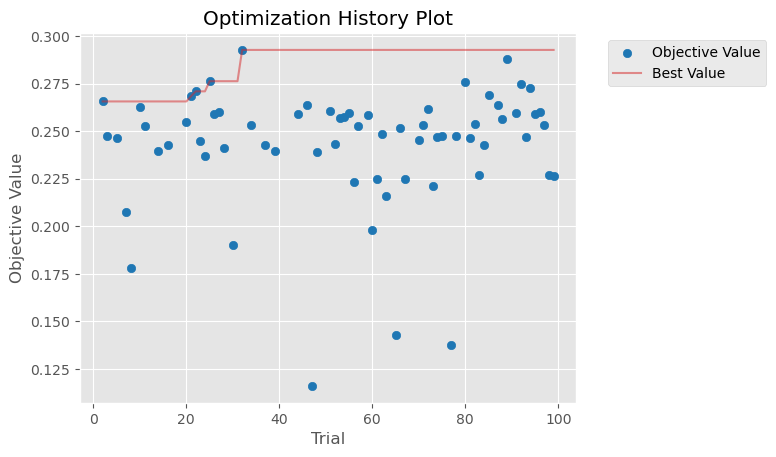

In [84]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-07 00:14:14,995] A new study created in memory with name: no-name-a5fc2e56-8ede-4b78-88aa-de63f57bad6d
/tmp/ipykernel_1565098/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


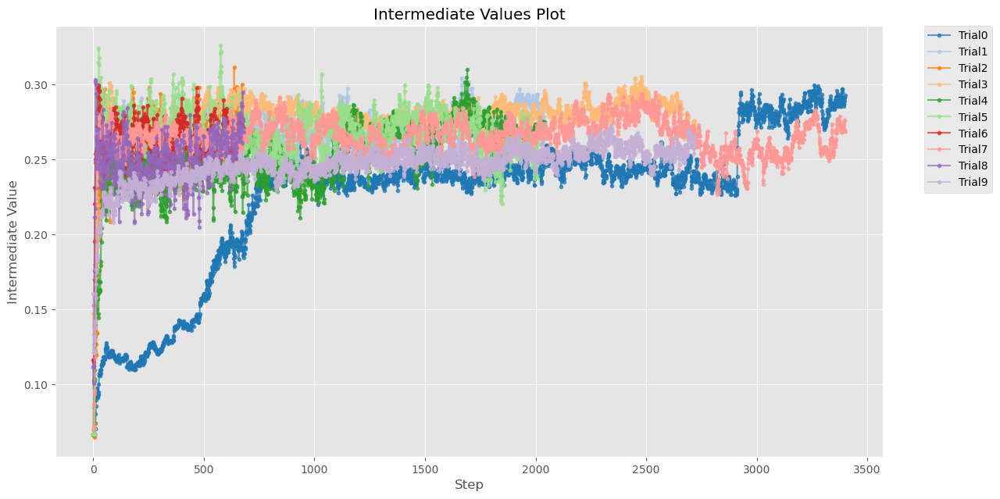

In [85]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_1565098/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


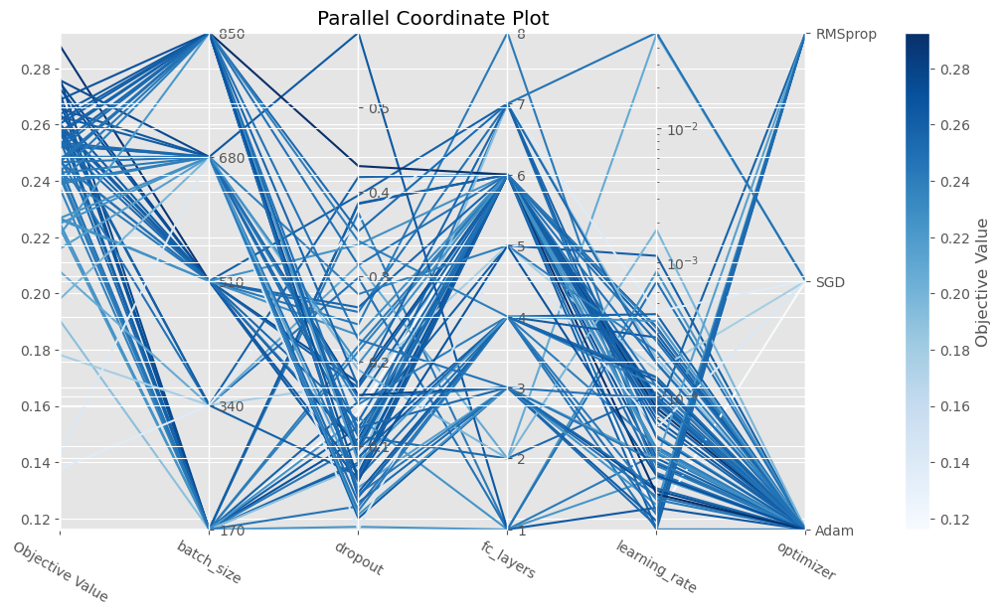

In [86]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_1565098/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-07 00:14:16,189] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


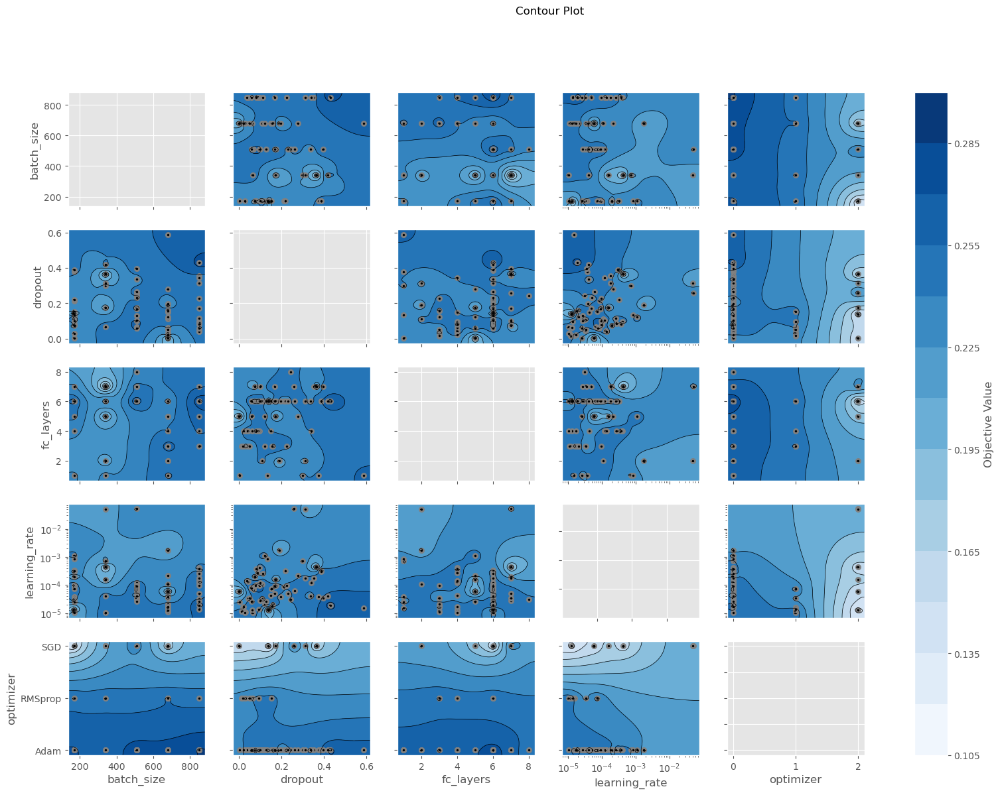

In [87]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_1565098/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

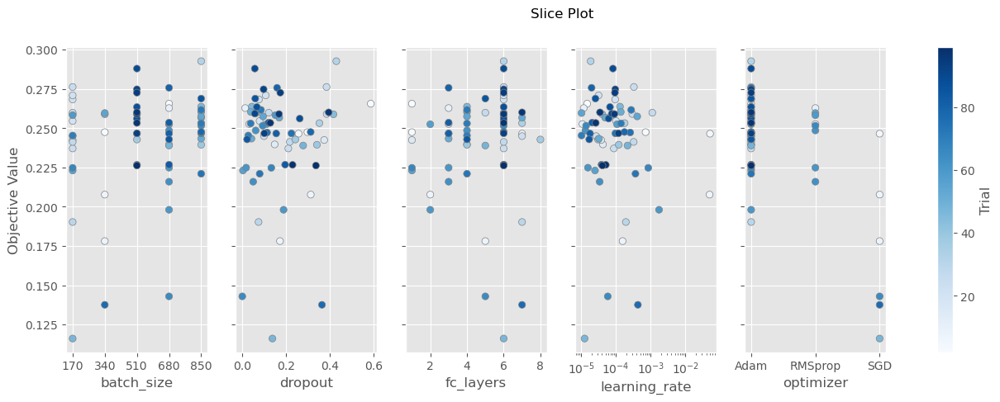

In [88]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_1565098/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

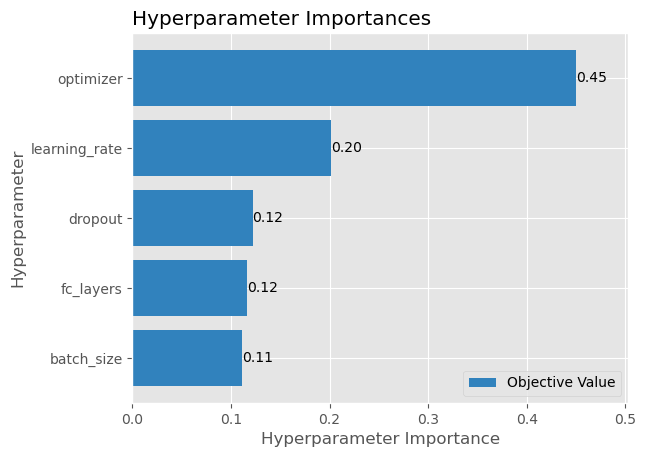

In [89]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_1565098/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

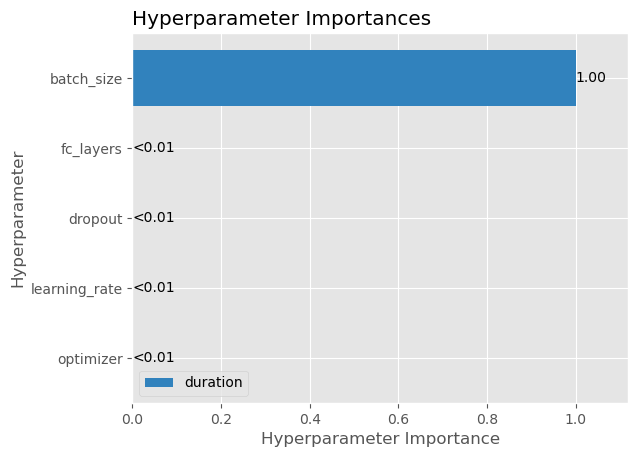

In [90]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_1565098/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

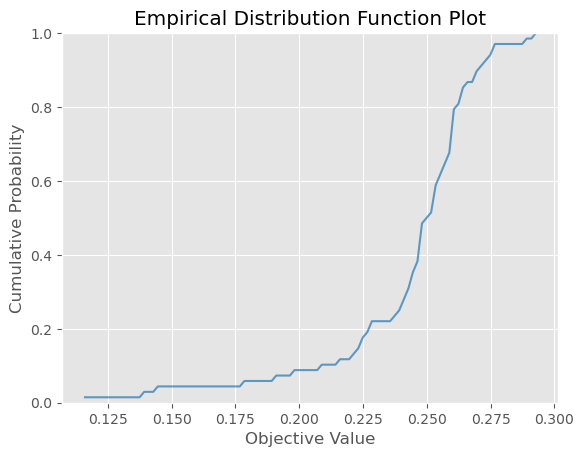

In [91]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_1565098/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-07 00:14:24,081] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


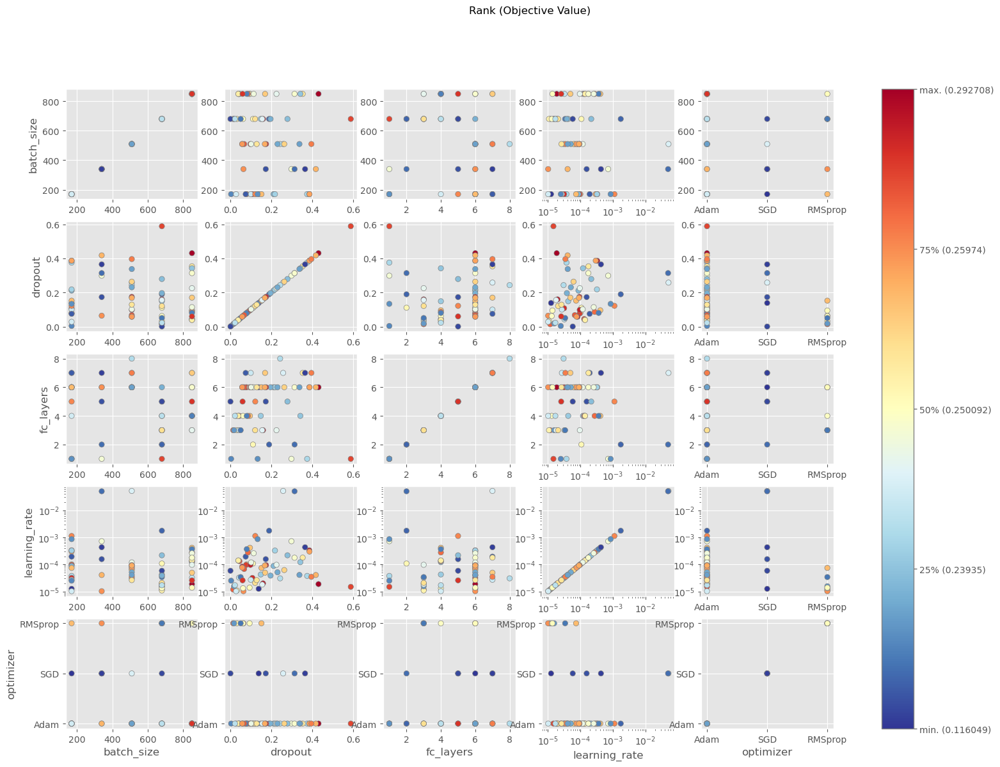

In [92]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_1565098/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


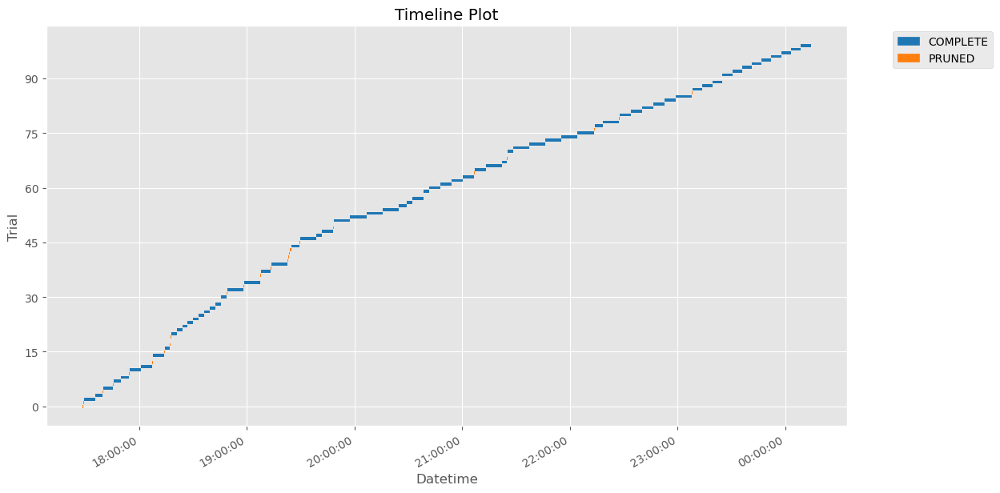

In [93]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)